# Warning : 
# Do "File -> Save a copy in Drive" before you start modifying the notebook, otherwise your modifications will not be saved.


In [ ]:
!wget http://webia.lip6.fr/~dancette/deep-learning/assets/TP3-4/TP3-4.zip
!unzip -j TP3-4.zip

--2021-10-17 21:35:54--  http://webia.lip6.fr/~dancette/deep-learning/assets/TP3-4/TP3-4.zip
Resolving webia.lip6.fr (webia.lip6.fr)... 132.227.201.33
Connecting to webia.lip6.fr (webia.lip6.fr)|132.227.201.33|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13421167 (13M) [application/zip]
Saving to: ‘TP3-4.zip.1’

TP3-4.zip.1         100%[===================>]  12.80M  14.5MB/s    in 0.9s    

2021-10-17 21:35:55 (14.5 MB/s) - ‘TP3-4.zip.1’ saved [13421167/13421167]

Archive:  TP3-4.zip
replace tme5.py? [y]es, [n]o, [A]ll, [N]one, [r]ename: a
error:  invalid response [a]
replace tme5.py? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: tme5.py                 
  inflating: mnist.mat               
  inflating: circles.py              
  inflating: circles.mat             


In [ ]:
import math
import torch
from torch.autograd import Variable
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
%run 'tme5.py'

# Part 1 : Forward and backward passes "by hands"

In [ ]:
def init_params(nx, nh, ny):
    """
    nx, nh, ny: integers
    out params: dictionnary
    """
    params = {}
    
    #####################
    ## Your code here  ##
    #####################
    # fill values for Wh, Wy, bh, by
    
    params["Wh"] = torch.randn(nh, nx).normal_(mean=0,std=0.3)
    params["Wy"] = torch.randn(ny, nh).normal_(mean=0,std=0.3)
    params["bh"] = torch.randn(nh,).normal_(mean=0,std=0.3)
    params["by"] = torch.randn(ny,).normal_(mean=0,std=0.3)
    
    ####################
    ##      END        #
    ####################
    return params

In [ ]:
def forward(params, X):
    """
    params: dictionnary
    X: (n_batch, dimension)
    """
    bsize = X.size(0)
    nh = params['Wh'].size(0)
    ny = params['Wy'].size(0)
    outputs = {}

    #####################
    ## Your code here  ##
    #####################
    # fill values for X, htilde, h, ytilde, yhat
    
    outputs["X"] = X
    outputs["htilde"] = torch.mm(X,params['Wh'].T)+ params["bh"]
    outputs["h"] = torch.tanh(outputs['htilde'])
    outputs["ytilde"] = torch.mm(outputs["h"],params["Wy"].T) + params["by"]
    outputs["yhat"] = torch.div(torch.exp(outputs["ytilde"]) , torch.sum(torch.exp(outputs["ytilde"]),1, keepdim=True))
    
    ####################
    ##      END        #
    ####################

    return outputs['yhat'], outputs

In [ ]:
def loss_accuracy(Yhat, Y):

    #####################
    ## Your code here  ##
    #####################


    _, indsY = torch.max(Y, 1)
    _, indsYhat = torch.max(Yhat, 1)

    
    L = -torch.mean(sum(Y*torch.log(Yhat),1))
    acc = (indsY == indsYhat).float().mean() * 100


    ####################
    ##      END        #
    ####################

    return L, acc

In [ ]:
def backward(params, outputs, Y):
    bsize = Y.shape[0]
    grads = {}

    #####################
    ## Your code here  ##
    #####################
    # fill values for Wy, Wh, by, bh

    grad_y = outputs["yhat"]-Y
    grad_h = torch.mm(grad_y,params['Wy']) * (1-torch.pow(outputs['h'],2))

    grads["Wy"] = torch.mm( grad_y.T, outputs["h"] )
    grads["Wh"] = torch.mm( grad_h, outputs["X"] )


    grads["by"] = torch.sum( grad_y, 0 )
    grads["bh"] = torch.sum( grad_h, 0 )
    
    ####################
    ##      END        #
    ####################
    return grads

In [ ]:
def sgd(params, grads, eta):

    #####################
    ## Your code here  ##
    #####################
    # update the params values

    params["Wh"] -= eta * grads["Wh"]
    params["Wy"] -= eta * grads["Wy"] 
    params["bh"] -= eta * grads["bh"]
    params["by"] -= eta * grads["by"]  

    ####################
    ##      END        #
    ####################
    return params

## Global learning procedure "by hands"

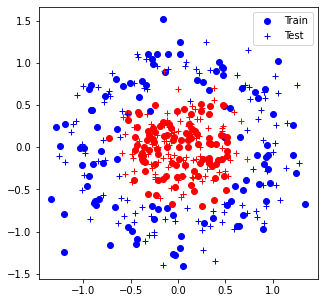

Iter 0: Acc train 34.0% (69.00), acc test 38.5% (69.07)


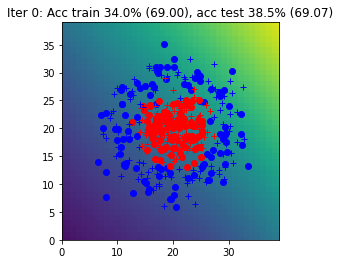

Iter 1: Acc train 64.0% (68.66), acc test 65.0% (68.65)


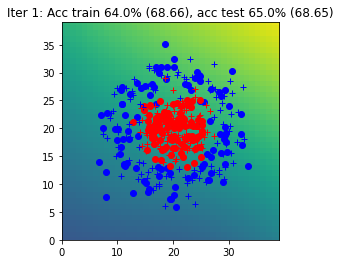

Iter 2: Acc train 37.5% (68.51), acc test 38.5% (68.50)


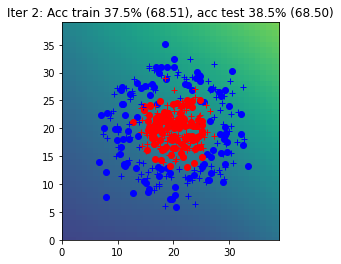

Iter 3: Acc train 66.0% (68.30), acc test 64.5% (68.39)


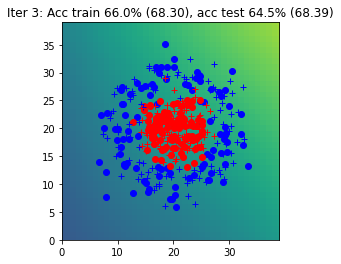

Iter 4: Acc train 37.5% (68.50), acc test 38.5% (68.47)


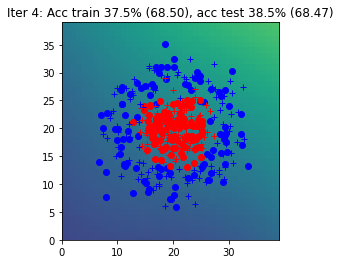

Iter 5: Acc train 44.0% (68.55), acc test 42.0% (68.58)


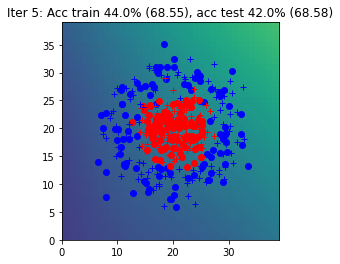

Iter 6: Acc train 52.0% (68.23), acc test 51.0% (68.21)


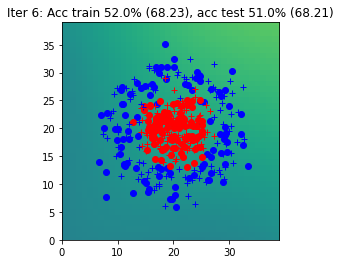

Iter 7: Acc train 50.0% (68.90), acc test 50.0% (68.90)


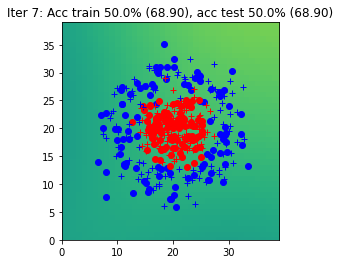

Iter 8: Acc train 50.0% (68.41), acc test 50.0% (68.40)


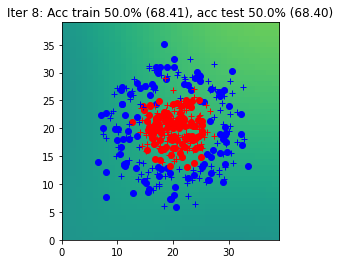

Iter 9: Acc train 50.0% (70.10), acc test 50.0% (70.05)


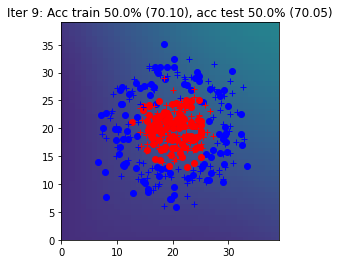

Iter 10: Acc train 63.5% (67.83), acc test 69.5% (67.79)


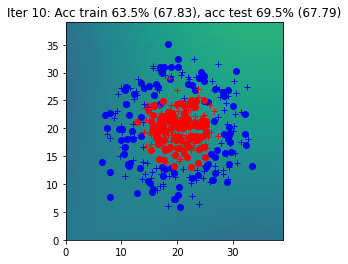

Iter 11: Acc train 51.5% (67.90), acc test 50.5% (67.92)


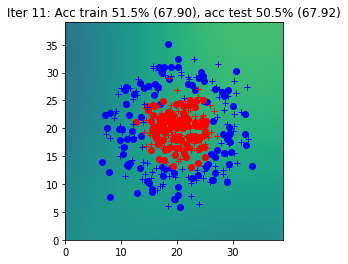

Iter 12: Acc train 50.0% (68.06), acc test 50.0% (68.14)


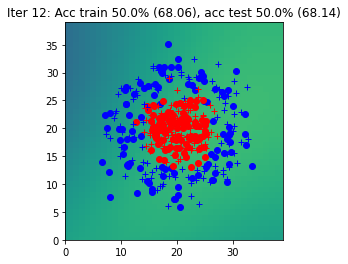

Iter 13: Acc train 52.0% (67.47), acc test 52.0% (67.46)


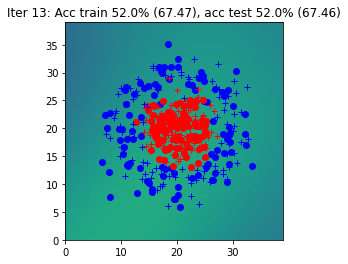

Iter 14: Acc train 65.5% (67.33), acc test 65.0% (67.34)


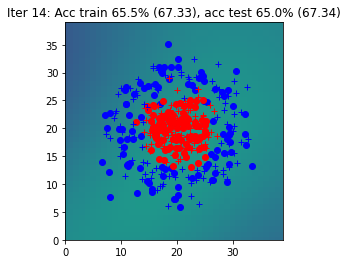

Iter 15: Acc train 66.0% (67.32), acc test 63.5% (67.37)


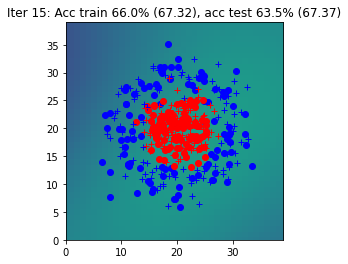

Iter 16: Acc train 50.5% (67.68), acc test 50.0% (67.77)


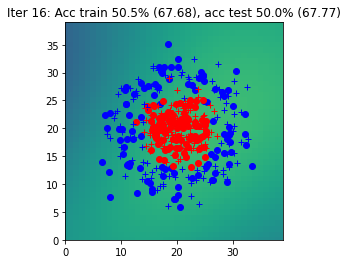

Iter 17: Acc train 50.0% (67.88), acc test 50.0% (67.86)


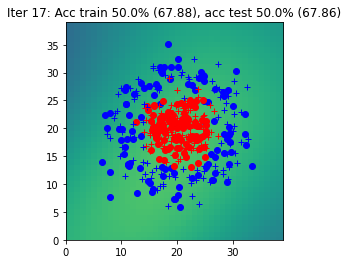

Iter 18: Acc train 50.0% (67.51), acc test 51.0% (67.57)


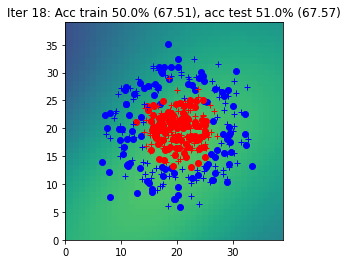

Iter 19: Acc train 56.0% (66.82), acc test 58.0% (66.86)


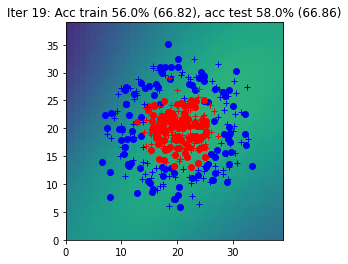

Iter 20: Acc train 50.0% (66.55), acc test 50.0% (66.49)


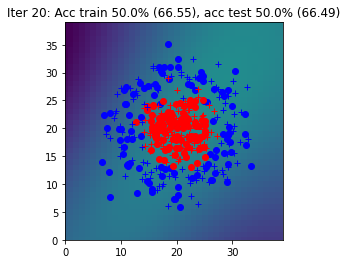

Iter 21: Acc train 55.5% (66.28), acc test 57.0% (66.27)


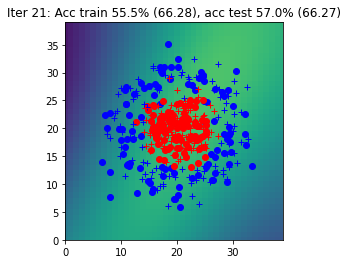

Iter 22: Acc train 50.0% (66.34), acc test 50.0% (66.20)


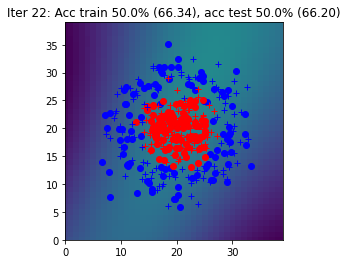

Iter 23: Acc train 50.0% (67.79), acc test 50.0% (67.73)


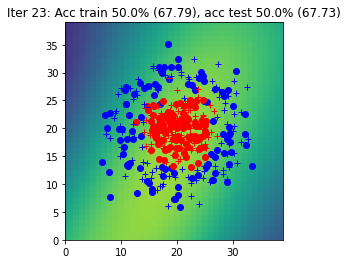

Iter 24: Acc train 50.0% (67.37), acc test 50.0% (67.29)


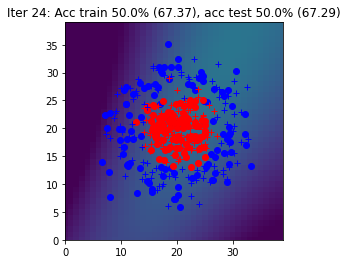

Iter 25: Acc train 50.0% (73.75), acc test 50.0% (73.62)


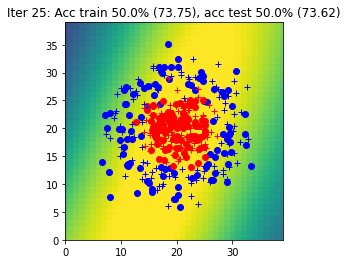

Iter 26: Acc train 64.5% (64.76), acc test 65.0% (64.63)


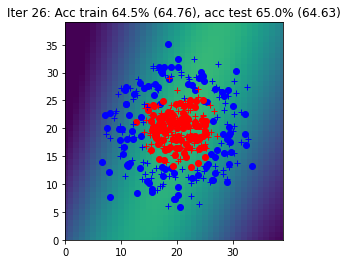

Iter 27: Acc train 64.0% (65.03), acc test 64.0% (64.90)


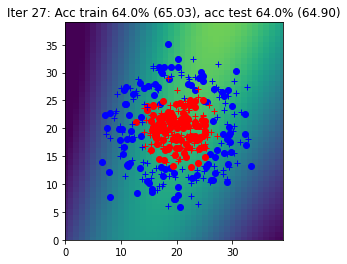

Iter 28: Acc train 71.5% (64.32), acc test 67.5% (63.93)


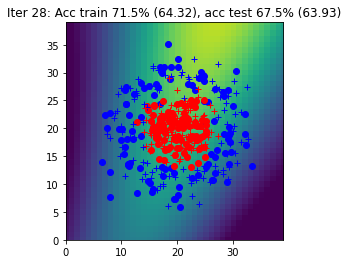

Iter 29: Acc train 75.0% (63.23), acc test 75.0% (62.72)


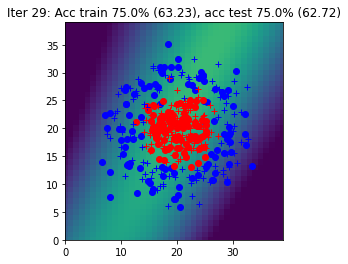

Iter 30: Acc train 79.5% (61.55), acc test 78.0% (61.01)


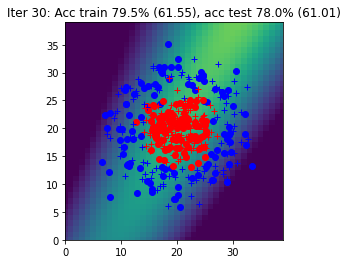

Iter 31: Acc train 58.5% (61.14), acc test 64.5% (60.60)


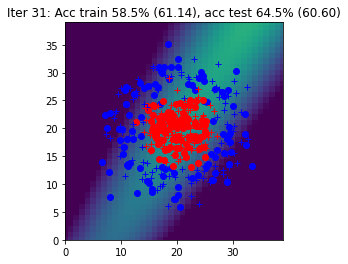

Iter 32: Acc train 78.0% (58.28), acc test 76.0% (57.86)


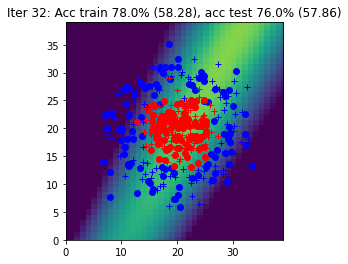

Iter 33: Acc train 77.0% (57.21), acc test 77.0% (56.33)


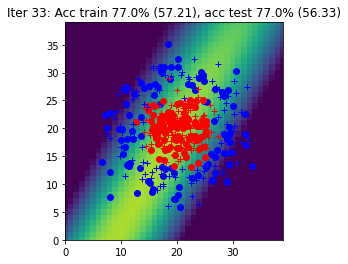

Iter 34: Acc train 77.0% (55.94), acc test 78.5% (55.10)


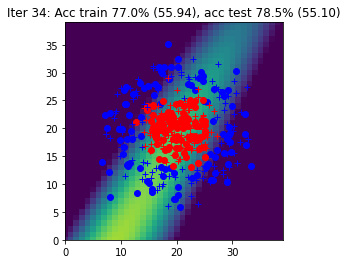

Iter 35: Acc train 73.5% (55.56), acc test 73.5% (54.01)


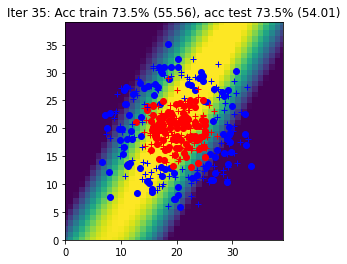

Iter 36: Acc train 78.0% (52.42), acc test 80.0% (51.14)


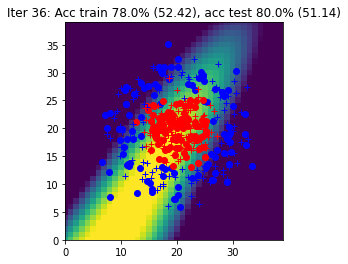

Iter 37: Acc train 77.5% (51.72), acc test 77.5% (50.76)


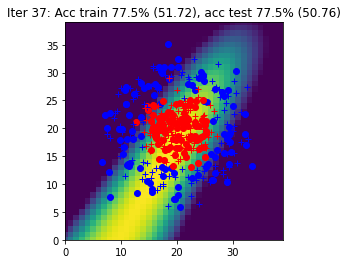

Iter 38: Acc train 77.0% (51.00), acc test 79.5% (49.53)


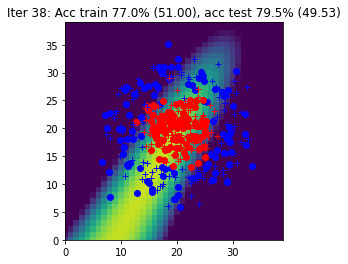

Iter 39: Acc train 77.0% (49.16), acc test 80.0% (47.54)


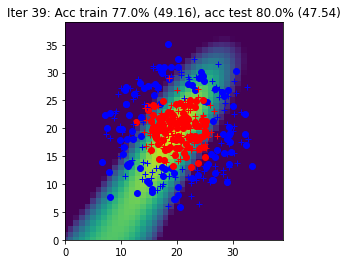

Iter 40: Acc train 78.5% (47.17), acc test 78.5% (45.75)


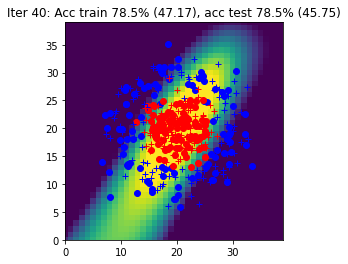

Iter 41: Acc train 79.0% (48.22), acc test 79.0% (46.83)


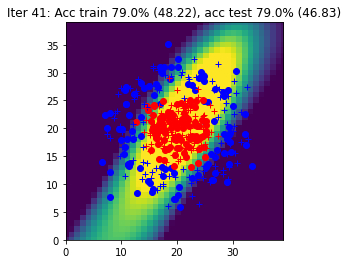

Iter 42: Acc train 80.5% (45.74), acc test 78.0% (44.35)


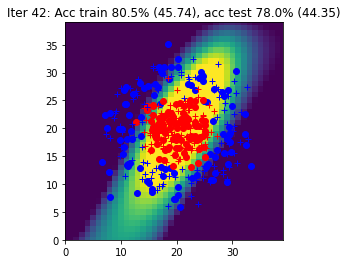

Iter 43: Acc train 82.0% (41.51), acc test 83.5% (39.91)


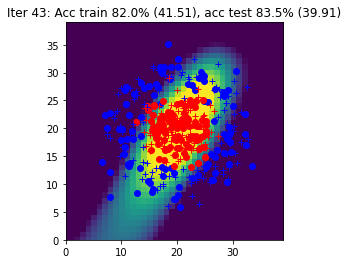

Iter 44: Acc train 83.0% (41.03), acc test 83.0% (39.49)


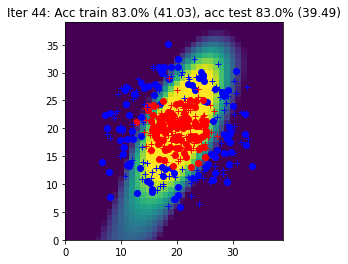

Iter 45: Acc train 83.5% (38.18), acc test 84.0% (36.75)


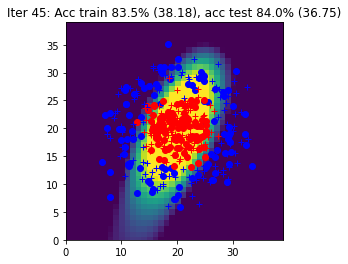

Iter 46: Acc train 87.5% (35.90), acc test 85.0% (34.13)


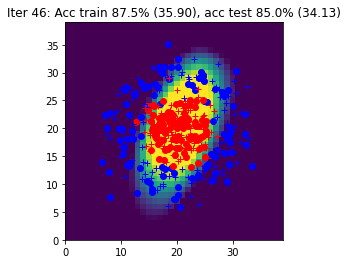

Iter 47: Acc train 88.5% (33.32), acc test 89.0% (32.06)


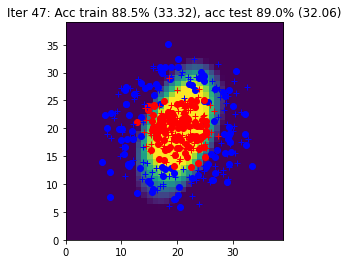

Iter 48: Acc train 88.0% (33.40), acc test 87.5% (31.78)


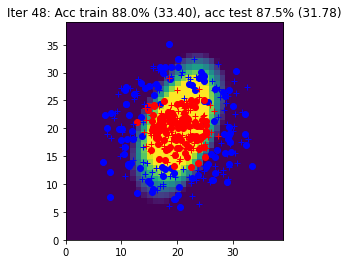

Iter 49: Acc train 87.0% (33.72), acc test 84.5% (31.73)


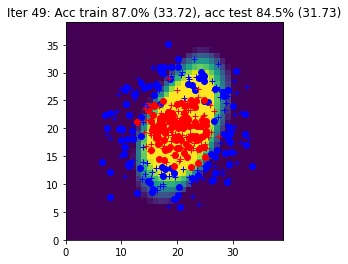

Iter 50: Acc train 88.0% (31.16), acc test 91.5% (29.94)


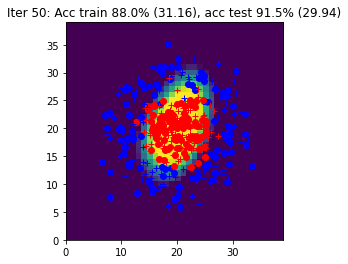

Iter 51: Acc train 90.5% (27.91), acc test 95.5% (26.00)


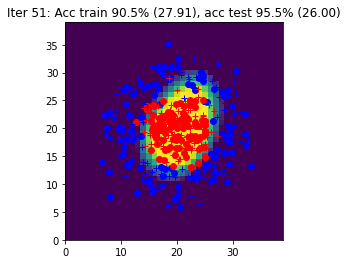

Iter 52: Acc train 91.0% (28.34), acc test 91.5% (26.51)


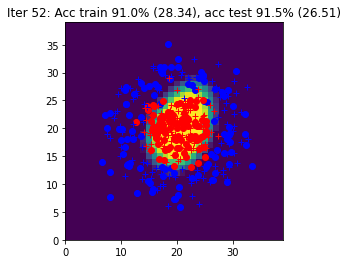

Iter 53: Acc train 91.5% (23.97), acc test 94.0% (23.11)


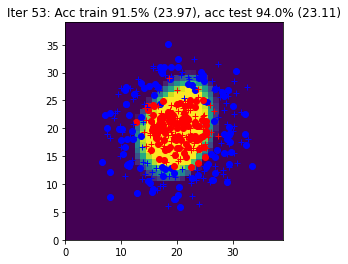

Iter 54: Acc train 90.5% (25.18), acc test 94.5% (23.18)


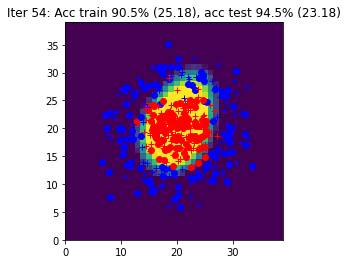

Iter 55: Acc train 90.5% (26.72), acc test 90.5% (26.97)


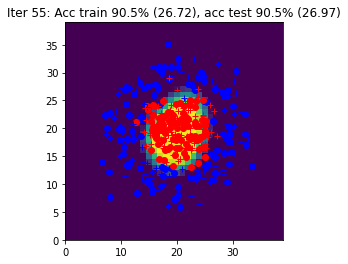

Iter 56: Acc train 93.0% (23.43), acc test 93.5% (21.69)


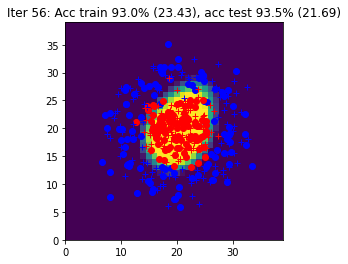

Iter 57: Acc train 91.5% (22.67), acc test 92.0% (22.64)


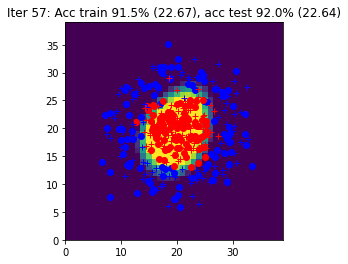

Iter 58: Acc train 91.5% (24.63), acc test 89.5% (24.11)


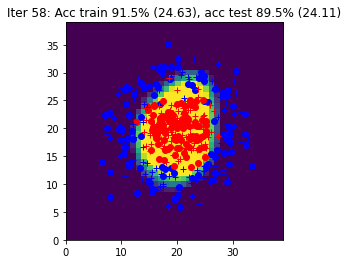

Iter 59: Acc train 93.0% (20.51), acc test 96.0% (20.49)


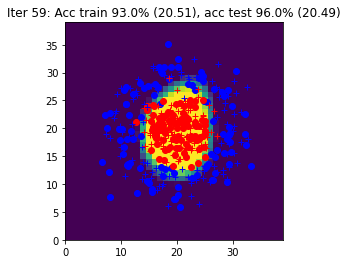

Iter 60: Acc train 89.5% (22.78), acc test 92.5% (22.11)


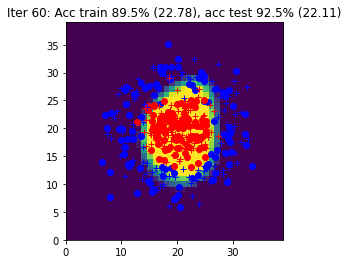

Iter 61: Acc train 92.5% (20.22), acc test 92.5% (21.13)


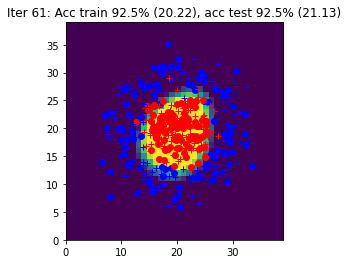

Iter 62: Acc train 94.0% (19.43), acc test 93.5% (19.29)


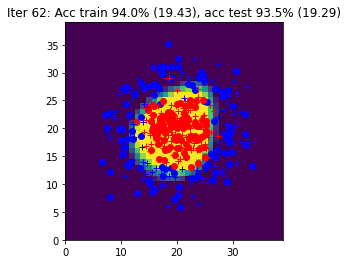

Iter 63: Acc train 90.0% (22.61), acc test 92.0% (21.17)


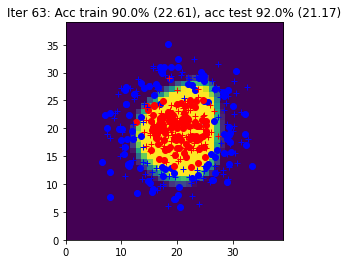

Iter 64: Acc train 89.5% (23.00), acc test 90.0% (23.79)


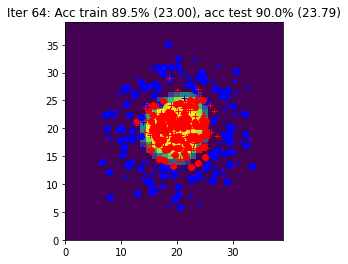

Iter 65: Acc train 94.5% (18.62), acc test 96.0% (16.74)


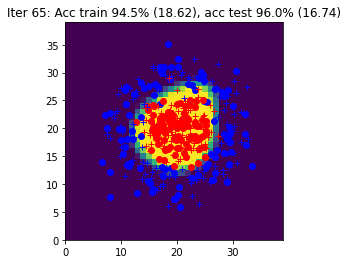

Iter 66: Acc train 87.0% (26.64), acc test 88.0% (25.18)


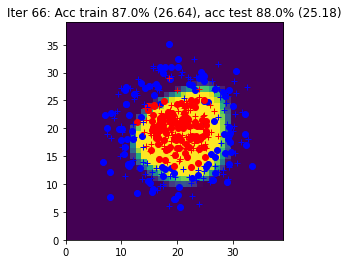

Iter 67: Acc train 92.0% (17.62), acc test 95.0% (17.59)


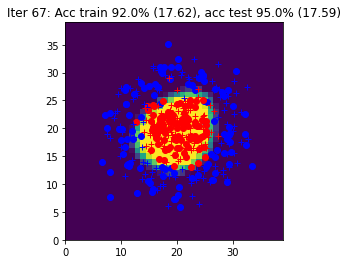

Iter 68: Acc train 93.5% (17.69), acc test 94.5% (17.05)


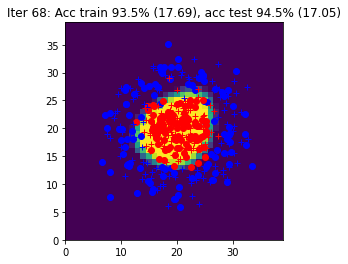

Iter 69: Acc train 93.0% (17.73), acc test 95.5% (16.56)


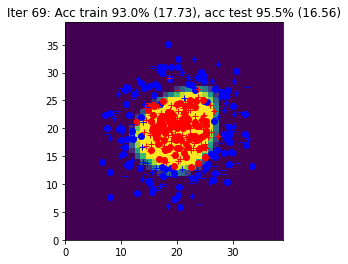

Iter 70: Acc train 91.0% (20.95), acc test 91.5% (19.62)


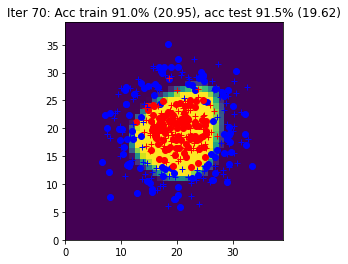

Iter 71: Acc train 94.0% (17.16), acc test 94.5% (17.87)


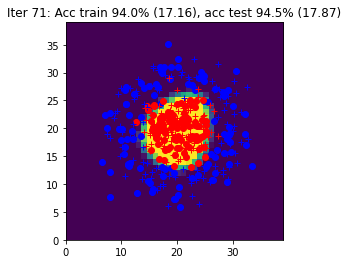

Iter 72: Acc train 95.0% (15.53), acc test 94.5% (15.90)


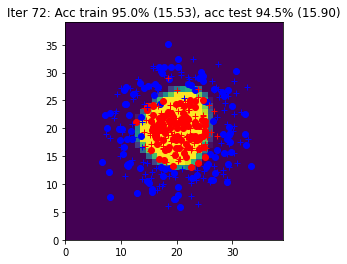

Iter 73: Acc train 92.5% (16.60), acc test 93.5% (17.34)


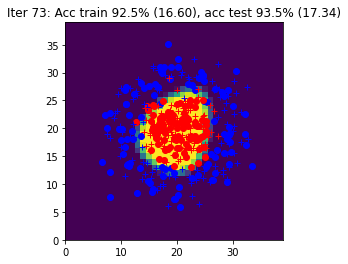

Iter 74: Acc train 92.0% (20.19), acc test 90.5% (21.72)


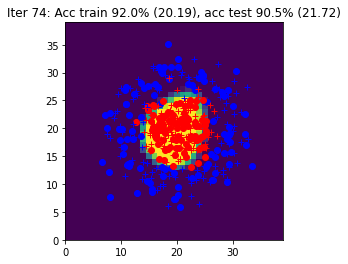

Iter 75: Acc train 93.0% (18.29), acc test 93.5% (17.87)


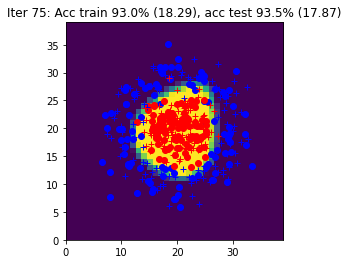

Iter 76: Acc train 94.5% (17.03), acc test 93.5% (17.73)


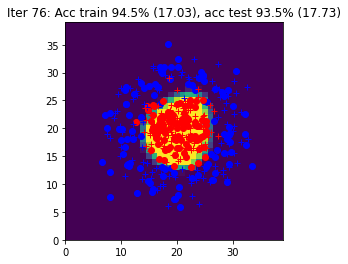

Iter 77: Acc train 93.5% (17.45), acc test 91.5% (18.22)


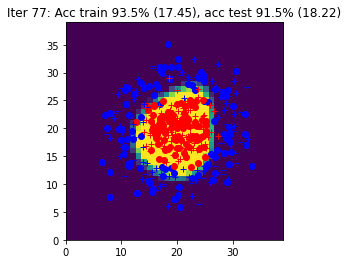

Iter 78: Acc train 93.5% (16.02), acc test 95.0% (15.95)


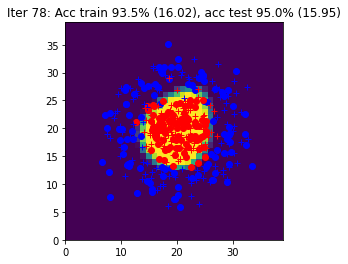

Iter 79: Acc train 93.5% (17.54), acc test 95.5% (16.39)


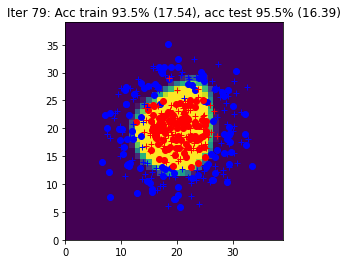

Iter 80: Acc train 94.5% (14.42), acc test 93.0% (16.15)


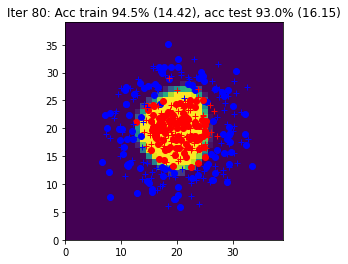

Iter 81: Acc train 88.5% (20.72), acc test 95.0% (17.59)


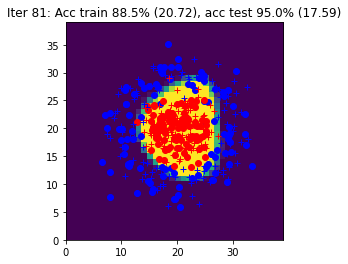

Iter 82: Acc train 96.5% (13.24), acc test 94.5% (15.22)


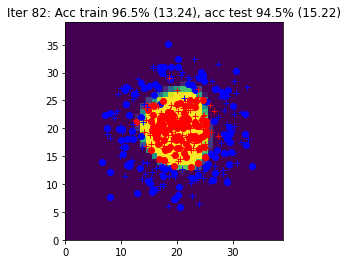

Iter 83: Acc train 93.0% (15.18), acc test 95.5% (14.74)


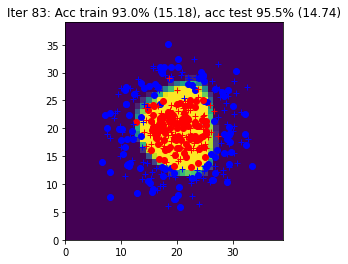

Iter 84: Acc train 96.0% (12.80), acc test 94.0% (15.20)


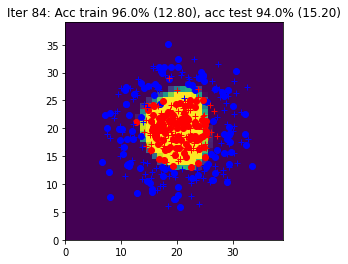

Iter 85: Acc train 91.0% (15.87), acc test 89.5% (20.19)


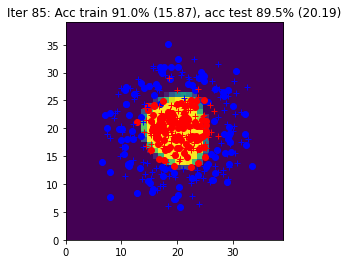

Iter 86: Acc train 96.5% (12.50), acc test 93.0% (15.19)


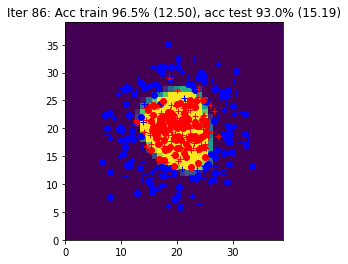

Iter 87: Acc train 95.0% (13.11), acc test 92.0% (18.26)


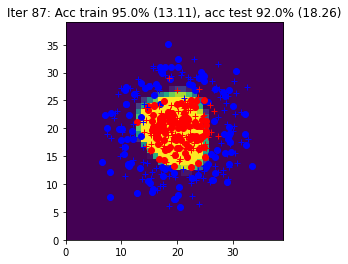

Iter 88: Acc train 96.0% (12.53), acc test 94.0% (14.20)


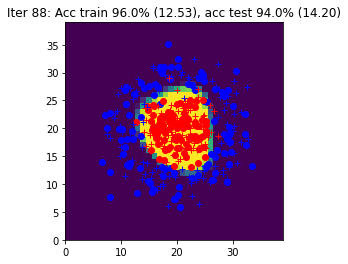

Iter 89: Acc train 94.0% (13.46), acc test 93.0% (17.69)


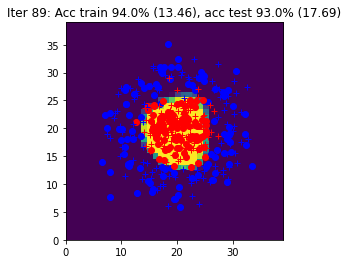

Iter 90: Acc train 93.0% (17.87), acc test 94.5% (15.93)


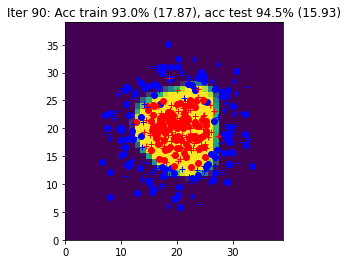

Iter 91: Acc train 92.0% (14.23), acc test 92.5% (17.12)


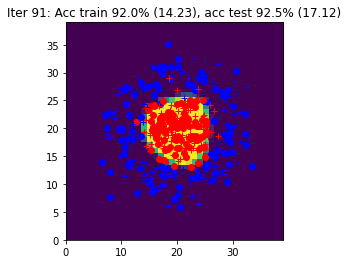

Iter 92: Acc train 96.0% (12.87), acc test 95.0% (13.37)


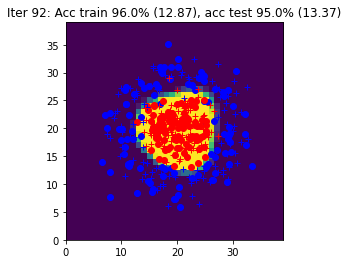

Iter 93: Acc train 93.5% (15.35), acc test 94.5% (14.24)


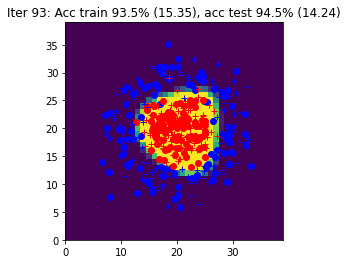

Iter 94: Acc train 93.5% (13.91), acc test 94.5% (14.45)


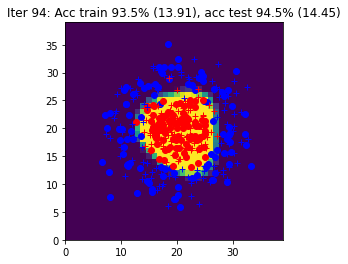

Iter 95: Acc train 95.0% (12.68), acc test 93.0% (15.70)


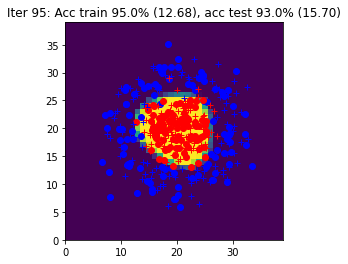

Iter 96: Acc train 94.5% (13.63), acc test 93.0% (17.52)


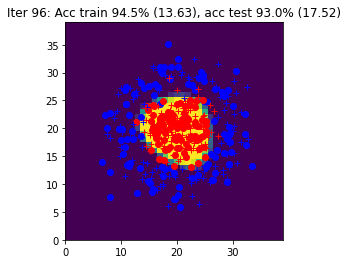

Iter 97: Acc train 94.5% (14.65), acc test 91.5% (17.62)


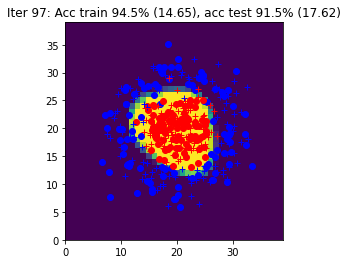

Iter 98: Acc train 93.0% (16.44), acc test 92.0% (22.92)


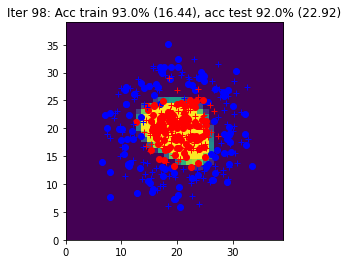

Iter 99: Acc train 92.5% (15.58), acc test 90.5% (17.47)


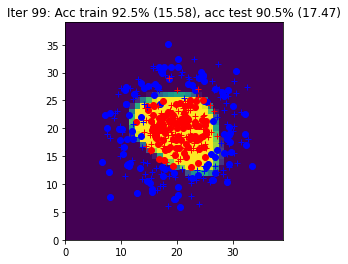

Iter 100: Acc train 96.0% (14.08), acc test 92.0% (21.83)


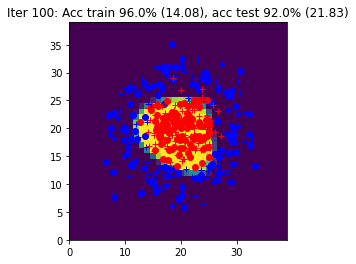

Iter 101: Acc train 91.0% (20.68), acc test 91.5% (20.76)


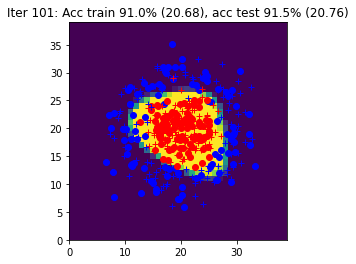

Iter 102: Acc train 92.5% (18.79), acc test 92.0% (19.25)


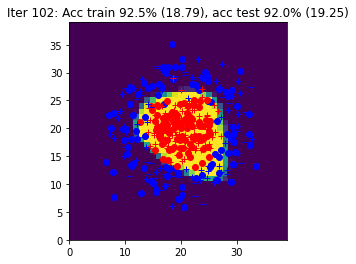

Iter 103: Acc train 93.0% (15.26), acc test 91.0% (20.98)


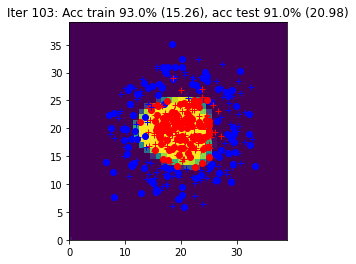

Iter 104: Acc train 93.5% (13.69), acc test 94.5% (15.11)


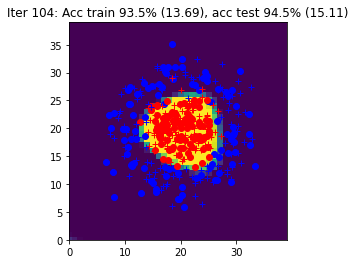

Iter 105: Acc train 92.0% (16.18), acc test 91.0% (19.31)


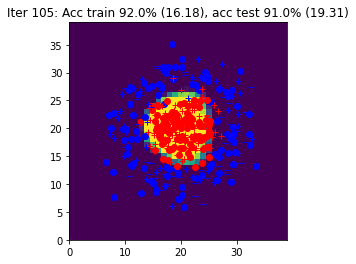

Iter 106: Acc train 92.0% (15.97), acc test 95.0% (14.40)


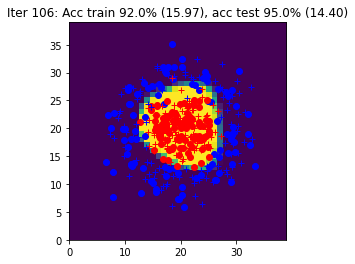

Iter 107: Acc train 96.0% (13.70), acc test 95.0% (14.50)


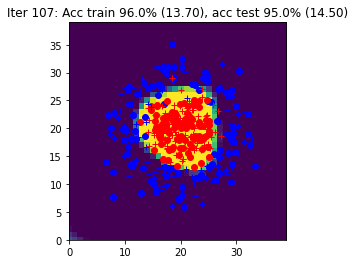

Iter 108: Acc train 95.5% (11.91), acc test 93.5% (14.70)


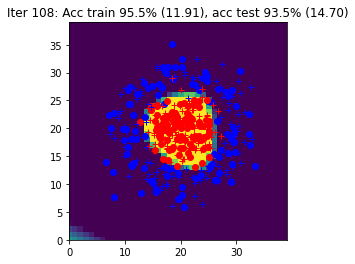

Iter 109: Acc train 96.0% (11.73), acc test 95.0% (14.22)


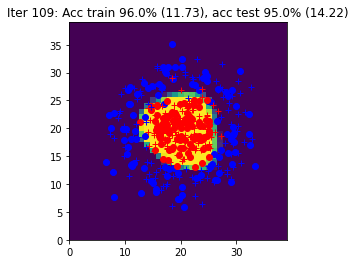

Iter 110: Acc train 93.5% (14.08), acc test 92.0% (19.07)


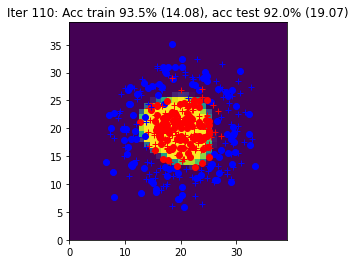

Iter 111: Acc train 92.5% (16.20), acc test 93.0% (16.42)


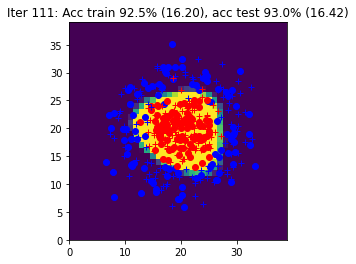

Iter 112: Acc train 95.0% (11.54), acc test 93.0% (13.27)


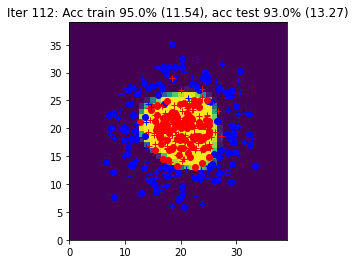

Iter 113: Acc train 93.5% (14.25), acc test 93.5% (16.27)


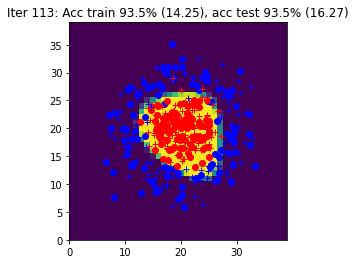

Iter 114: Acc train 95.5% (12.05), acc test 93.0% (18.28)


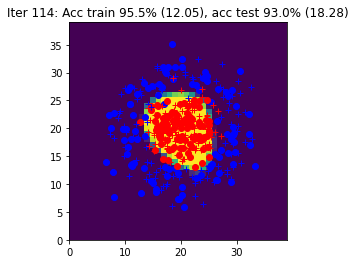

Iter 115: Acc train 94.0% (12.98), acc test 91.5% (19.02)


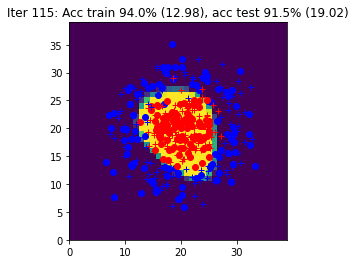

Iter 116: Acc train 95.0% (12.14), acc test 91.0% (19.11)


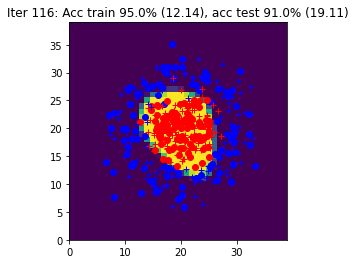

Iter 117: Acc train 94.5% (12.67), acc test 91.0% (17.71)


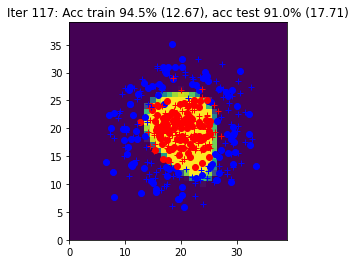

Iter 118: Acc train 93.5% (12.84), acc test 91.5% (20.66)


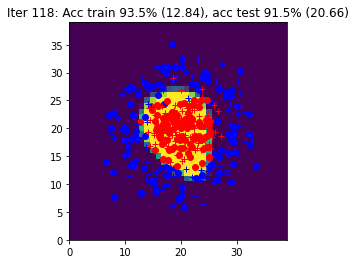

Iter 119: Acc train 96.0% (11.85), acc test 92.5% (15.74)


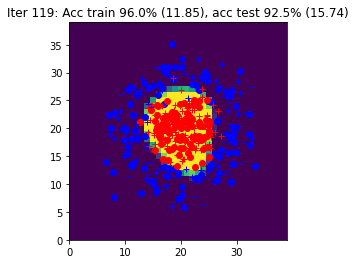

Iter 120: Acc train 96.5% (11.14), acc test 92.0% (16.30)


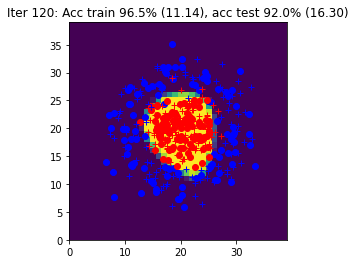

Iter 121: Acc train 94.5% (12.25), acc test 92.0% (19.08)


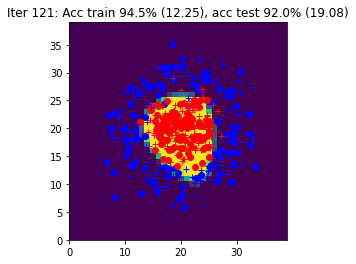

Iter 122: Acc train 92.5% (16.86), acc test 91.5% (19.85)


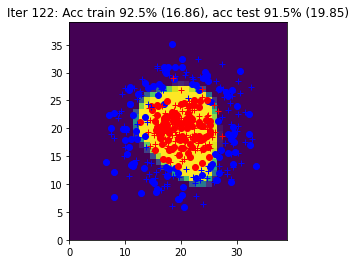

Iter 123: Acc train 95.0% (15.12), acc test 91.0% (20.82)


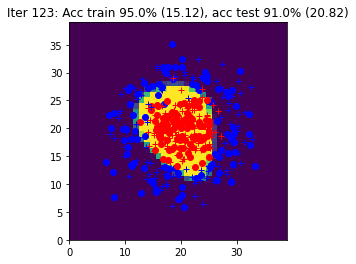

Iter 124: Acc train 96.0% (12.05), acc test 90.5% (19.73)


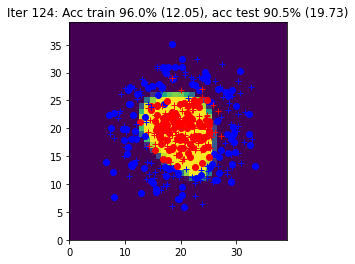

Iter 125: Acc train 94.0% (13.07), acc test 90.5% (18.25)


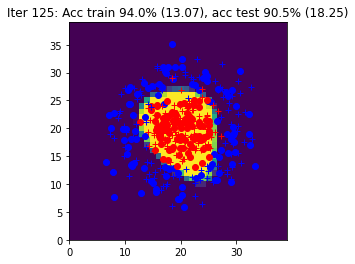

Iter 126: Acc train 94.5% (11.26), acc test 91.0% (16.90)


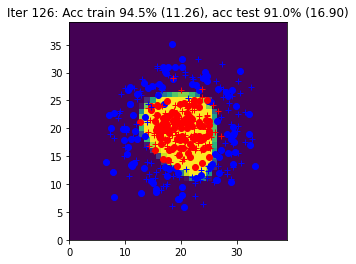

Iter 127: Acc train 94.0% (13.99), acc test 90.0% (20.77)


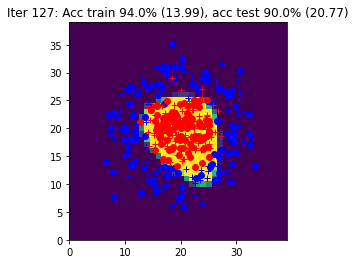

Iter 128: Acc train 95.0% (10.89), acc test 91.0% (18.24)


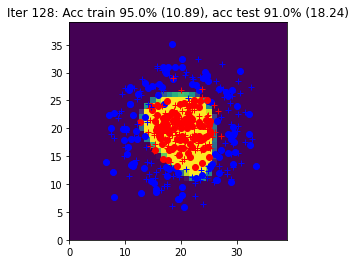

Iter 129: Acc train 95.0% (12.54), acc test 91.0% (19.73)


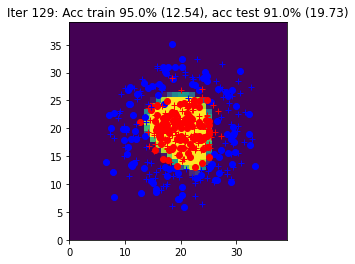

Iter 130: Acc train 96.0% (11.52), acc test 92.5% (16.38)


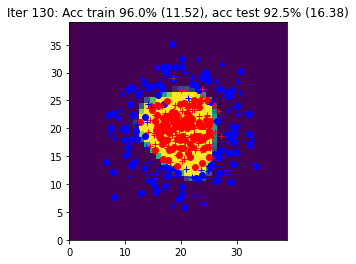

Iter 131: Acc train 93.5% (13.03), acc test 93.0% (14.84)


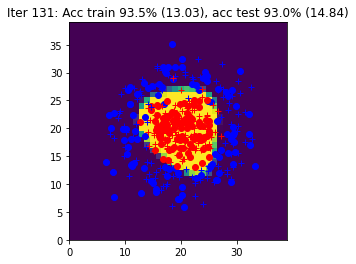

Iter 132: Acc train 95.5% (10.80), acc test 92.0% (15.20)


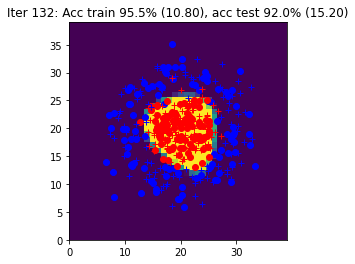

Iter 133: Acc train 89.5% (18.81), acc test 87.5% (25.77)


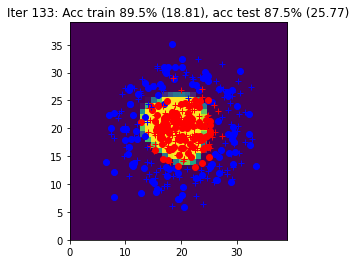

Iter 134: Acc train 97.0% (10.25), acc test 94.0% (14.68)


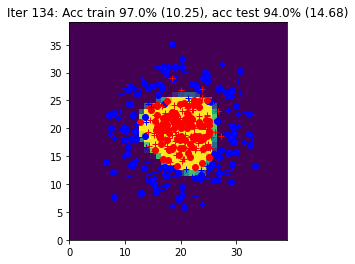

Iter 135: Acc train 95.5% (11.72), acc test 92.5% (14.62)


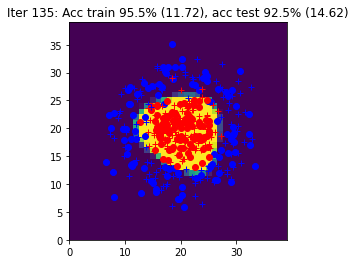

Iter 136: Acc train 91.5% (13.34), acc test 93.0% (18.76)


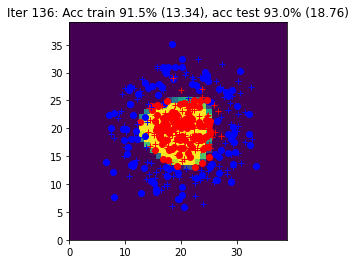

Iter 137: Acc train 95.0% (12.18), acc test 94.5% (13.69)


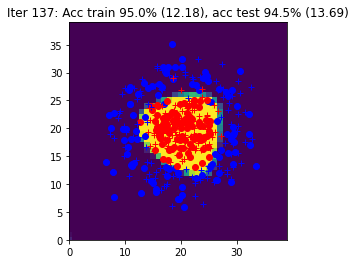

Iter 138: Acc train 94.0% (12.34), acc test 93.5% (14.77)


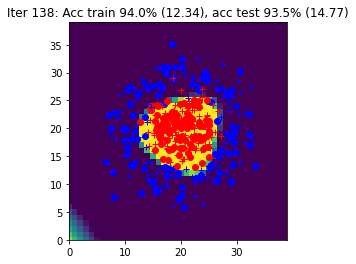

Iter 139: Acc train 96.5% (11.24), acc test 94.0% (16.40)


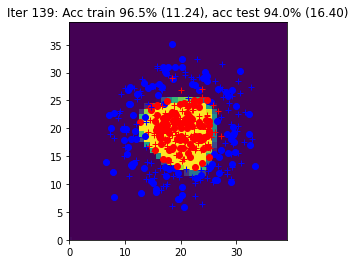

Iter 140: Acc train 97.5% (11.50), acc test 93.0% (16.41)


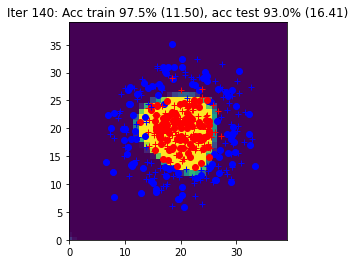

Iter 141: Acc train 94.5% (11.75), acc test 92.5% (15.89)


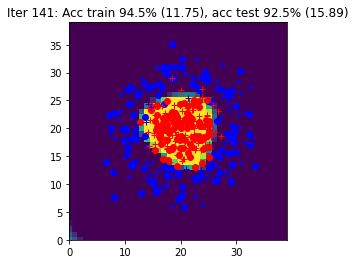

Iter 142: Acc train 92.5% (15.18), acc test 93.5% (17.30)


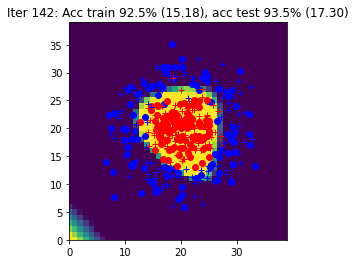

Iter 143: Acc train 94.0% (12.96), acc test 90.5% (17.59)


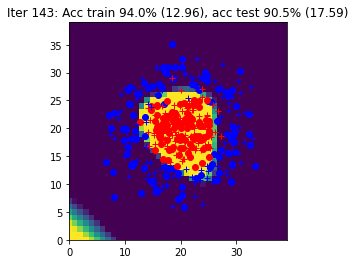

Iter 144: Acc train 95.5% (12.78), acc test 90.5% (20.55)


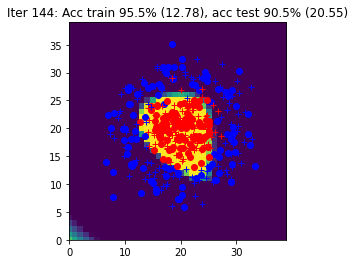

Iter 145: Acc train 94.5% (13.90), acc test 90.0% (20.35)


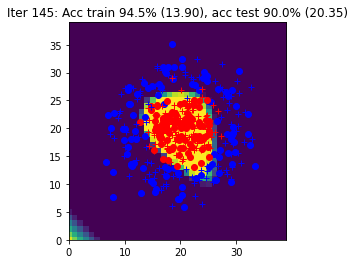

Iter 146: Acc train 91.0% (17.76), acc test 88.5% (24.38)


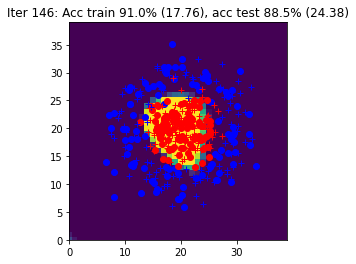

Iter 147: Acc train 94.0% (13.80), acc test 90.5% (20.60)


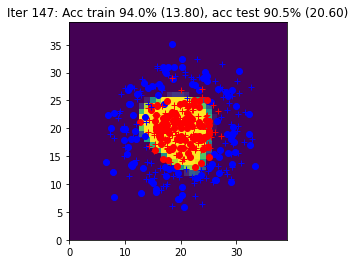

Iter 148: Acc train 90.5% (20.18), acc test 90.0% (24.22)


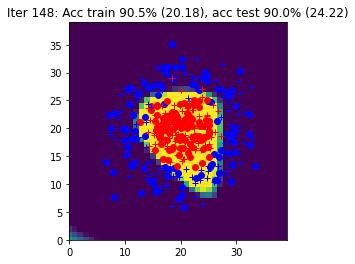

Iter 149: Acc train 96.0% (11.50), acc test 93.5% (15.54)


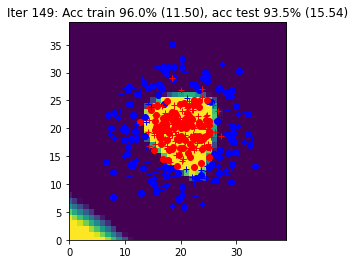

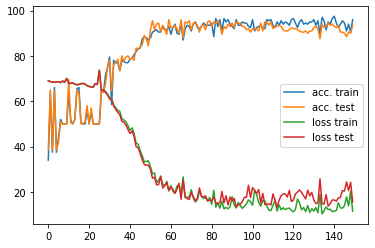

In [ ]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.03

params = init_params(nx, nh, ny)

curves = [[],[], [], []]

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    #####################
    ## Your code here  ##
    #####################
    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]

        # write the optimization algorithm on the batch (X,Y)
        # using the functions: forward, loss_accuracy, backward, sgd

        Yhat, outputs = forward(params, X)
        L, acc = loss_accuracy(Yhat, Y)
        grads = backward(params, outputs, Y)
        params = sgd(params,grads,eta)

    ####################
    ##      END        #
    ####################


    Yhat_train, _ = forward(params, data.Xtrain)
    Yhat_test, _ = forward(params, data.Xtest)
    Ltrain, acctrain = loss_accuracy(Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(Yhat_test, data.Ytest)
    Ygrid, _ = forward(params, data.Xgrid)  

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
    print(title)
    data.plot_data_with_grid(Ygrid, title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain)
    curves[3].append(Ltest)

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Part 2 : Simplification of the backward pass with `torch.autograd`



In [ ]:
def init_params(nx, nh, ny):
    """
    nx, nh, ny: integers
    out params: dictionnary
    """
    params = {}
    
    #####################
    ## Your code here  ##
    #####################
    # fill values for Wh, Wy, bh, by
    # activaye autograd on the network weights

    params["Wh"] = torch.randn(nh, nx).normal_(mean=0,std=0.3).requires_grad_(True)
    params["Wy"] = torch.randn(ny, nh).normal_(mean=0,std=0.3).requires_grad_(True)
    params["bh"] = torch.randn(nh,).normal_(mean=0,std=0.3).requires_grad_(True)
    params["by"] = torch.randn(ny,).normal_(mean=0,std=0.3).requires_grad_(True)
    
    ####################
    ##      END        #
    ####################
    return params

The function `forward` remains unchanged from previous part. 

The function `backward` is no longer used because of "autograd". 

In [ ]:
def sgd(params, eta):

    #####################
    ## Your code here  ##
    #####################
    # update the network weights
    # warning: use torch.no_grad()
    # and reset to zero the gradient accumulators

    with torch.no_grad():
      params["Wh"] -= eta * params["Wh"].grad
      params["Wy"] -= eta * params["Wy"].grad
      params["bh"] -= eta * params["bh"].grad
      params["by"] -= eta * params["by"].grad
      
      params["Wh"].grad.zero_()
      params["Wy"].grad.zero_()
      params["bh"].grad.zero_()
      params["by"].grad.zero_()  

    ####################
    ##      END        #
    ####################
    return params

## Global learning procedure with autograd

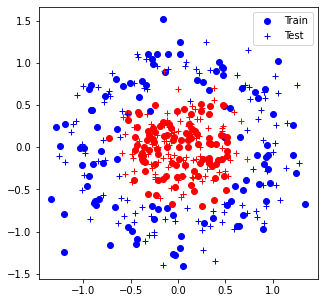

Iter 0: Acc train 68.0% (67.66), acc test 69.0% (67.58)


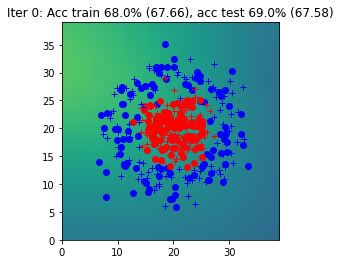

Iter 1: Acc train 66.0% (67.10), acc test 68.0% (67.17)


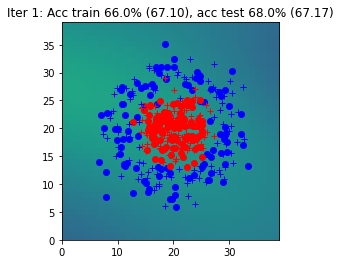

Iter 2: Acc train 52.5% (66.74), acc test 52.0% (66.93)


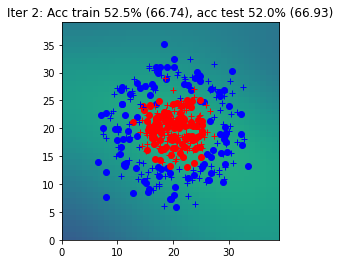

Iter 3: Acc train 53.0% (66.50), acc test 52.0% (66.78)


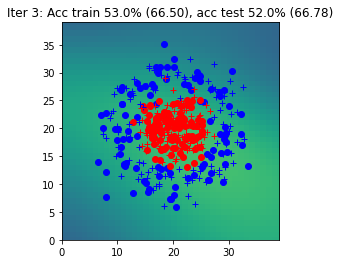

Iter 4: Acc train 66.5% (65.44), acc test 63.0% (65.81)


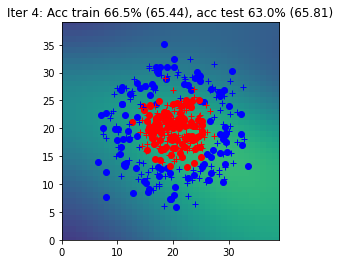

Iter 5: Acc train 83.0% (64.54), acc test 81.5% (64.93)


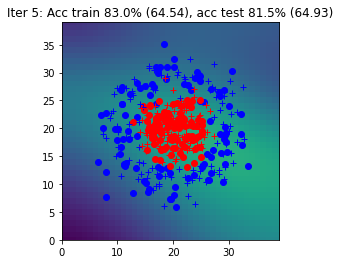

Iter 6: Acc train 76.5% (63.54), acc test 73.5% (64.02)


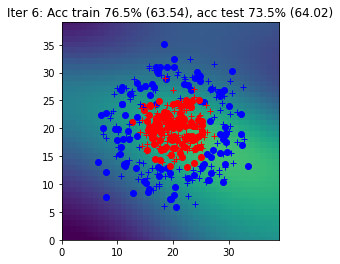

Iter 7: Acc train 64.0% (63.00), acc test 62.5% (63.58)


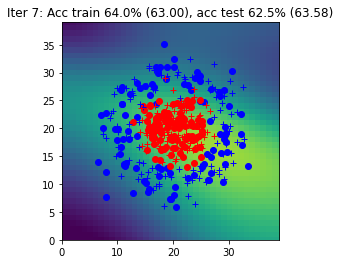

Iter 8: Acc train 80.5% (60.89), acc test 78.0% (61.57)


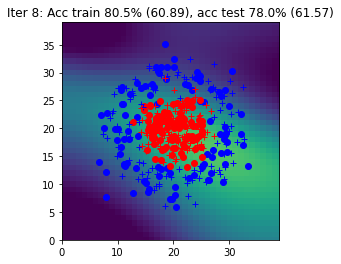

Iter 9: Acc train 77.0% (60.02), acc test 71.0% (60.77)


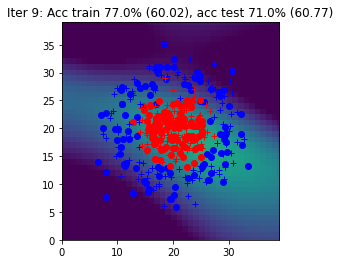

Iter 10: Acc train 72.5% (58.04), acc test 68.5% (58.85)


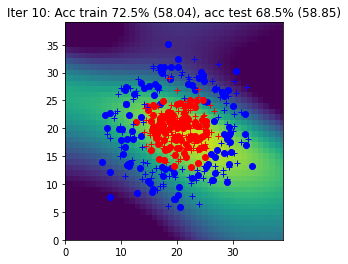

Iter 11: Acc train 79.5% (55.70), acc test 77.0% (56.46)


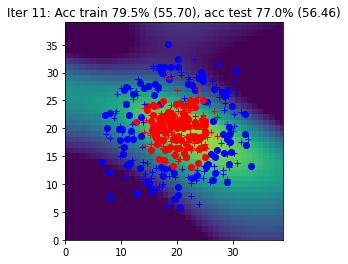

Iter 12: Acc train 77.0% (53.83), acc test 74.0% (54.78)


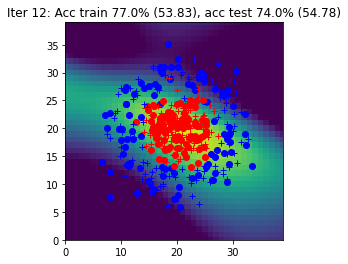

Iter 13: Acc train 74.5% (52.72), acc test 72.5% (53.77)


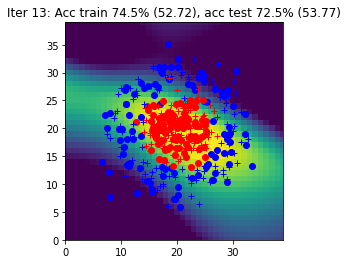

Iter 14: Acc train 80.5% (49.75), acc test 79.5% (50.87)


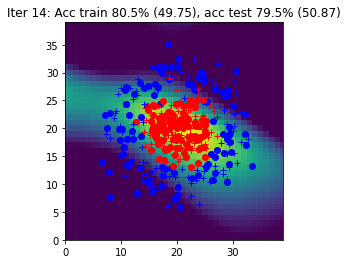

Iter 15: Acc train 85.0% (48.51), acc test 84.5% (50.05)


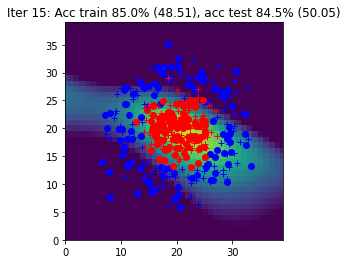

Iter 16: Acc train 83.0% (45.73), acc test 82.5% (47.13)


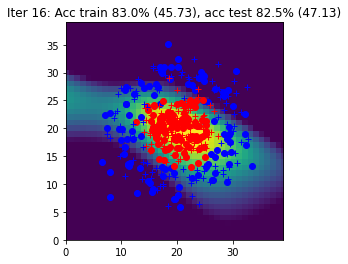

Iter 17: Acc train 87.0% (44.12), acc test 88.0% (45.52)


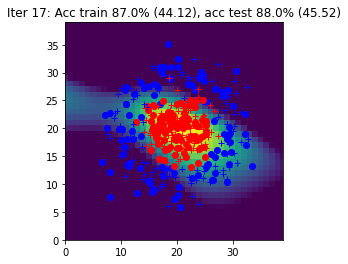

Iter 18: Acc train 86.5% (41.65), acc test 88.5% (43.17)


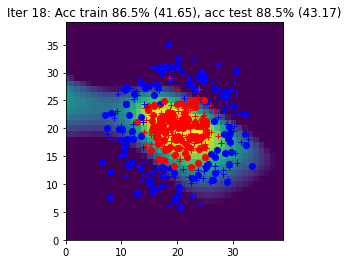

Iter 19: Acc train 84.5% (40.47), acc test 80.0% (41.07)


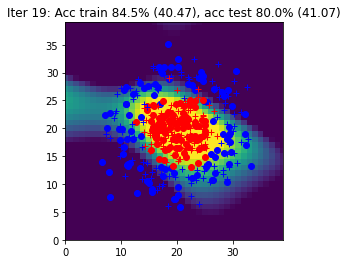

Iter 20: Acc train 87.5% (37.56), acc test 87.0% (38.38)


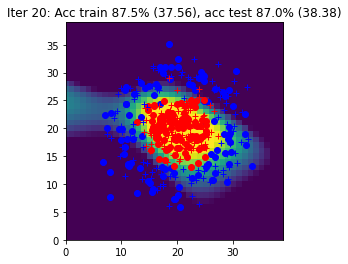

Iter 21: Acc train 89.0% (35.73), acc test 89.5% (36.42)


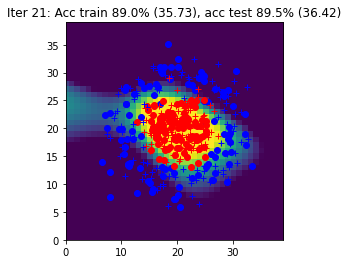

Iter 22: Acc train 92.0% (33.80), acc test 92.5% (34.83)


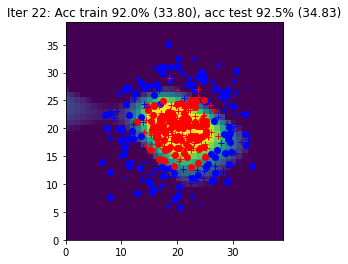

Iter 23: Acc train 93.5% (31.67), acc test 93.0% (32.74)


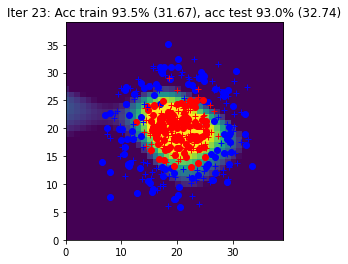

Iter 24: Acc train 94.5% (30.01), acc test 94.0% (31.17)


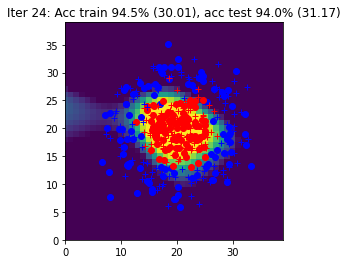

Iter 25: Acc train 93.0% (28.56), acc test 95.0% (29.17)


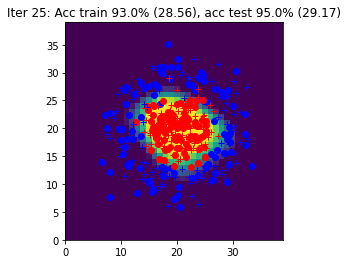

Iter 26: Acc train 93.5% (27.06), acc test 95.0% (27.77)


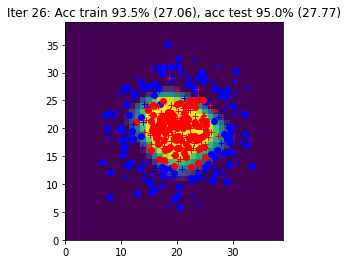

Iter 27: Acc train 93.0% (25.89), acc test 94.0% (26.37)


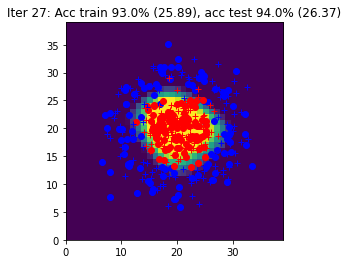

Iter 28: Acc train 95.0% (24.57), acc test 94.0% (24.89)


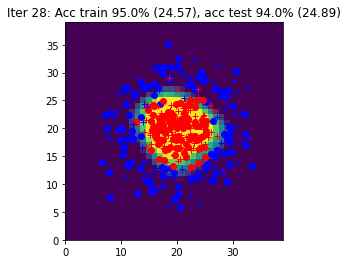

Iter 29: Acc train 94.0% (23.62), acc test 93.5% (23.48)


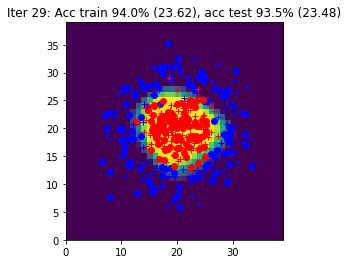

Iter 30: Acc train 95.0% (22.71), acc test 95.0% (22.92)


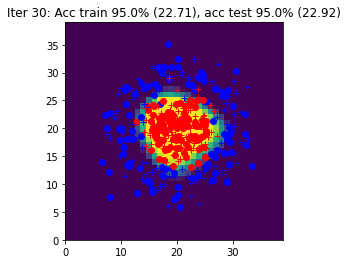

Iter 31: Acc train 95.0% (22.13), acc test 94.0% (22.42)


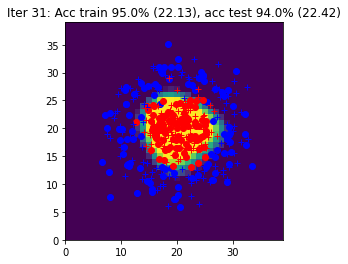

Iter 32: Acc train 94.5% (21.57), acc test 94.5% (21.89)


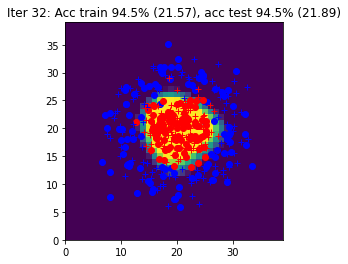

Iter 33: Acc train 93.5% (20.54), acc test 95.0% (20.77)


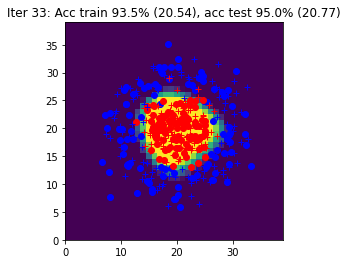

Iter 34: Acc train 93.0% (20.86), acc test 94.5% (20.20)


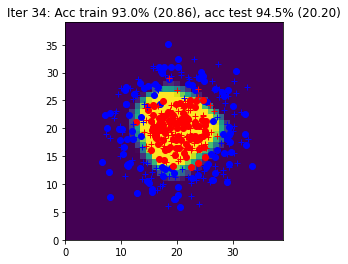

Iter 35: Acc train 94.5% (20.07), acc test 95.0% (21.05)


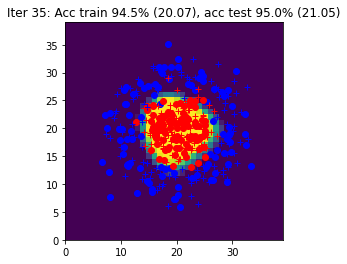

Iter 36: Acc train 94.5% (19.44), acc test 94.0% (20.47)


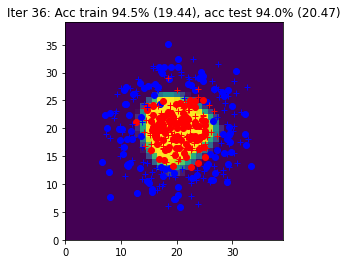

Iter 37: Acc train 94.0% (18.69), acc test 95.5% (18.67)


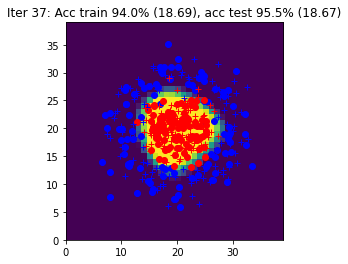

Iter 38: Acc train 93.5% (18.29), acc test 95.0% (18.29)


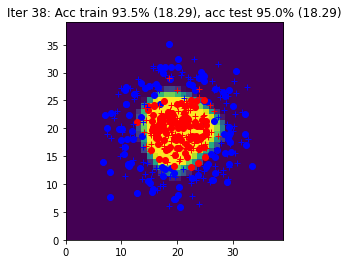

Iter 39: Acc train 95.0% (17.96), acc test 95.0% (18.04)


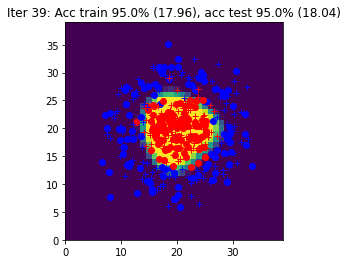

Iter 40: Acc train 95.0% (17.79), acc test 94.5% (18.23)


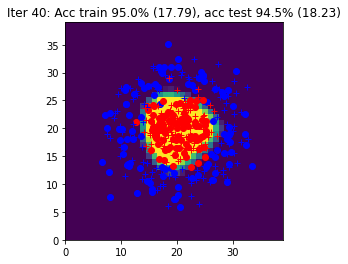

Iter 41: Acc train 95.0% (17.53), acc test 94.0% (18.10)


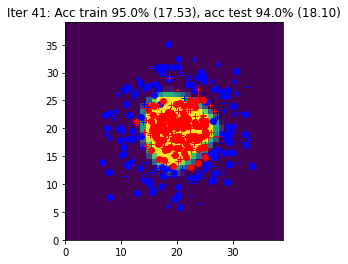

Iter 42: Acc train 93.0% (18.76), acc test 92.5% (17.93)


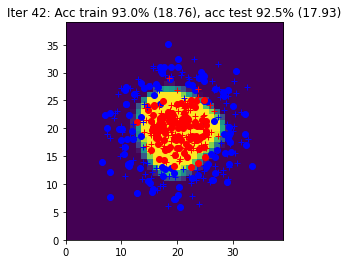

Iter 43: Acc train 93.5% (16.91), acc test 94.5% (17.07)


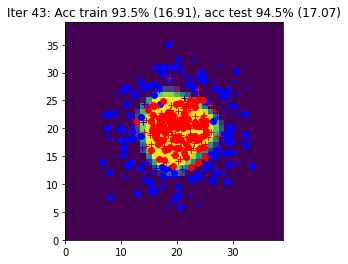

Iter 44: Acc train 95.0% (16.63), acc test 94.0% (16.51)


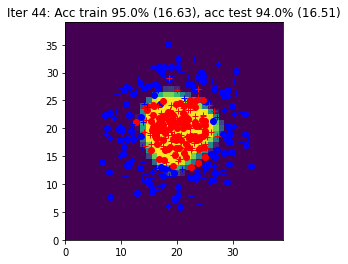

Iter 45: Acc train 93.5% (16.64), acc test 94.5% (16.17)


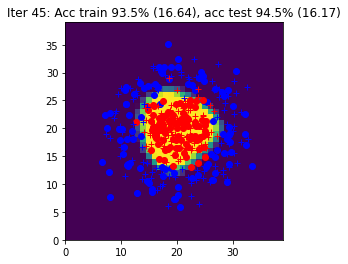

Iter 46: Acc train 95.5% (16.34), acc test 94.0% (16.53)


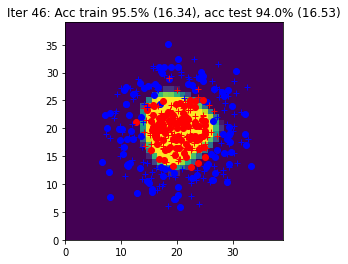

Iter 47: Acc train 94.5% (16.73), acc test 93.5% (17.03)


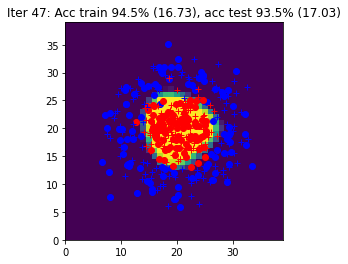

Iter 48: Acc train 95.0% (15.88), acc test 94.5% (16.06)


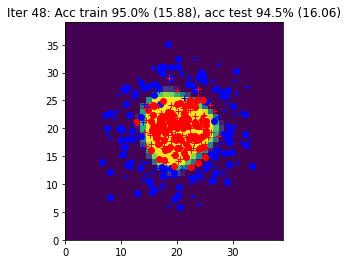

Iter 49: Acc train 94.0% (16.06), acc test 95.0% (15.42)


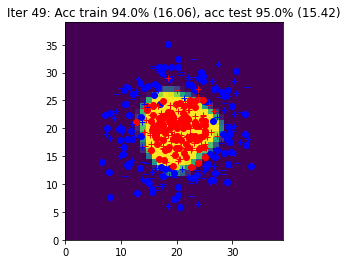

Iter 50: Acc train 94.5% (15.81), acc test 93.5% (16.55)


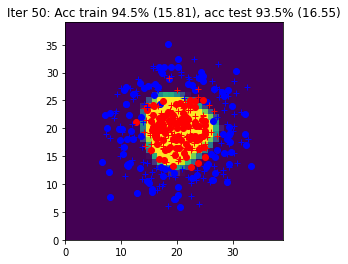

Iter 51: Acc train 94.5% (15.49), acc test 94.5% (15.48)


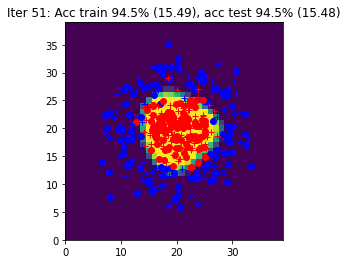

Iter 52: Acc train 94.5% (15.37), acc test 94.0% (15.88)


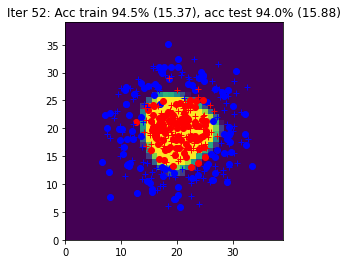

Iter 53: Acc train 94.0% (15.59), acc test 94.0% (16.39)


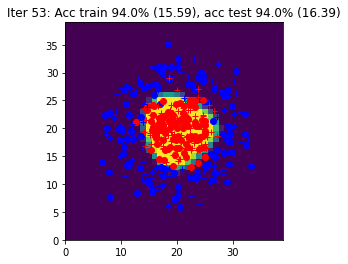

Iter 54: Acc train 93.5% (15.47), acc test 94.5% (15.03)


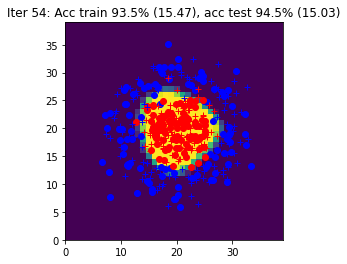

Iter 55: Acc train 94.0% (15.02), acc test 94.5% (15.37)


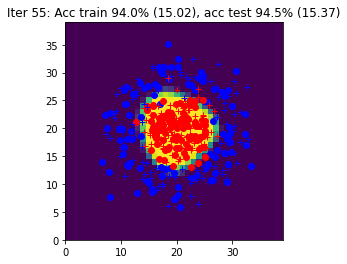

Iter 56: Acc train 95.0% (14.88), acc test 94.0% (15.27)


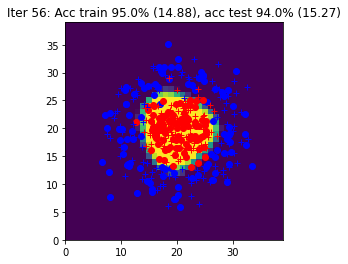

Iter 57: Acc train 93.5% (15.09), acc test 94.5% (14.67)


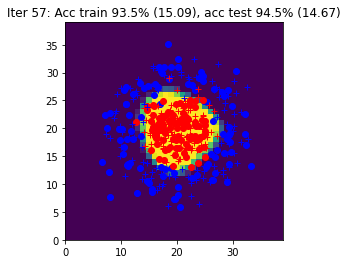

Iter 58: Acc train 95.0% (14.67), acc test 94.5% (15.33)


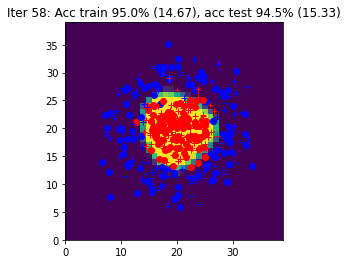

Iter 59: Acc train 94.0% (14.71), acc test 94.0% (14.65)


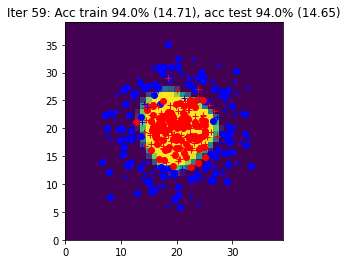

Iter 60: Acc train 93.5% (14.60), acc test 94.5% (14.97)


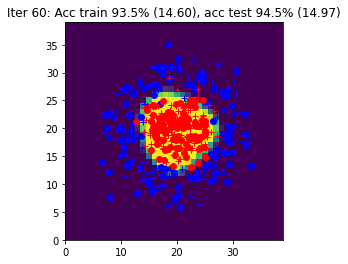

Iter 61: Acc train 95.0% (14.42), acc test 94.0% (14.71)


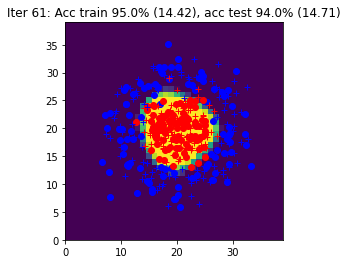

Iter 62: Acc train 93.5% (14.81), acc test 95.0% (14.65)


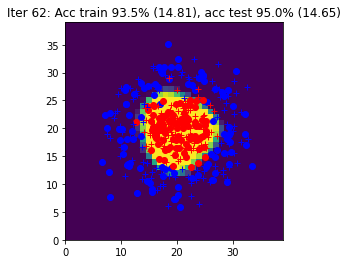

Iter 63: Acc train 95.5% (14.32), acc test 94.5% (14.30)


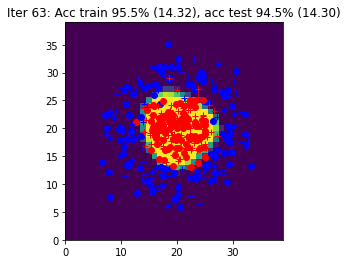

Iter 64: Acc train 94.0% (15.08), acc test 94.5% (14.24)


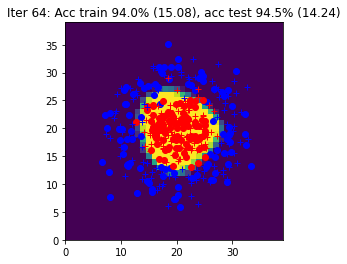

Iter 65: Acc train 93.5% (15.63), acc test 94.5% (15.43)


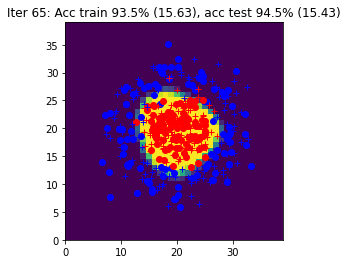

Iter 66: Acc train 93.5% (14.43), acc test 94.5% (14.50)


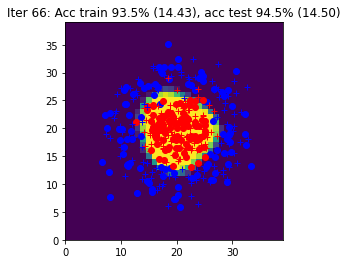

Iter 67: Acc train 94.0% (14.17), acc test 93.5% (13.97)


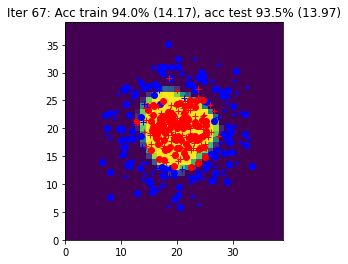

Iter 68: Acc train 94.0% (14.06), acc test 94.5% (15.35)


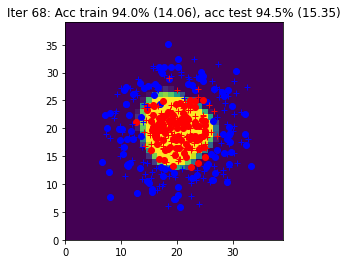

Iter 69: Acc train 93.5% (14.76), acc test 94.0% (14.39)


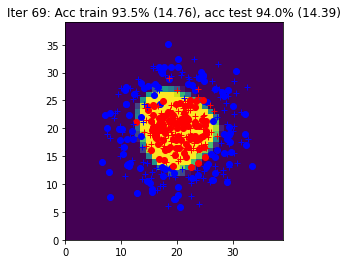

Iter 70: Acc train 95.5% (13.84), acc test 94.5% (14.60)


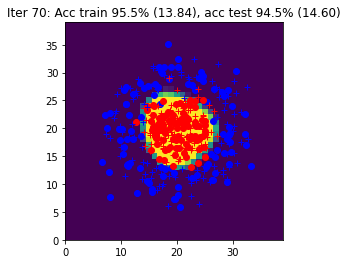

Iter 71: Acc train 94.0% (13.84), acc test 93.5% (14.24)


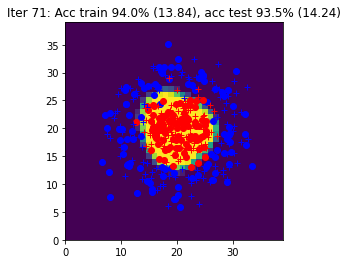

Iter 72: Acc train 93.0% (14.10), acc test 94.0% (14.71)


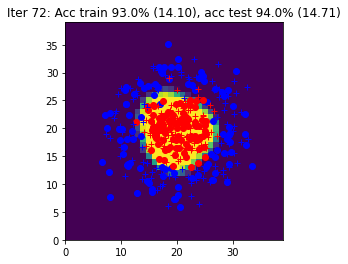

Iter 73: Acc train 94.0% (14.29), acc test 94.5% (15.76)


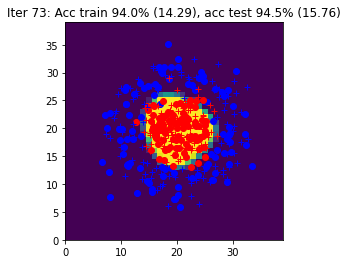

Iter 74: Acc train 95.0% (13.70), acc test 94.0% (14.15)


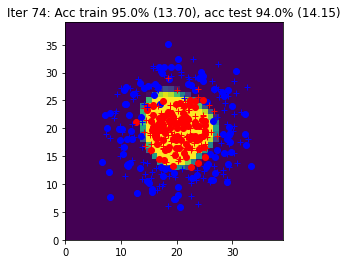

Iter 75: Acc train 93.5% (14.85), acc test 94.5% (14.32)


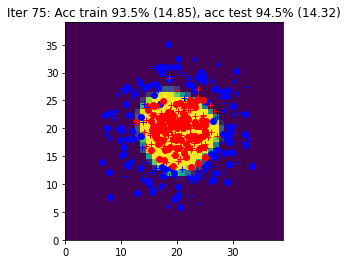

Iter 76: Acc train 95.0% (13.54), acc test 94.0% (14.80)


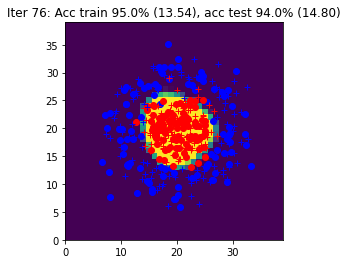

Iter 77: Acc train 94.5% (13.46), acc test 94.0% (13.74)


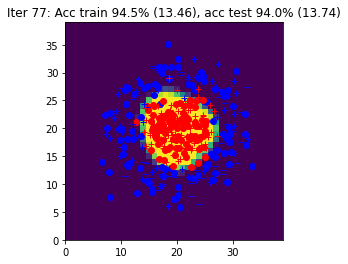

Iter 78: Acc train 94.0% (13.70), acc test 94.0% (14.22)


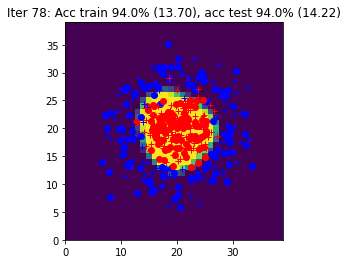

Iter 79: Acc train 94.5% (13.35), acc test 93.0% (14.16)


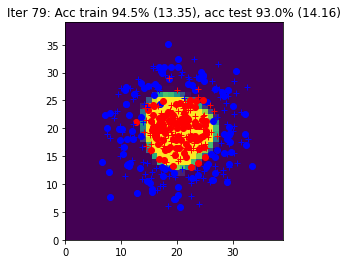

Iter 80: Acc train 93.0% (15.45), acc test 92.5% (17.67)


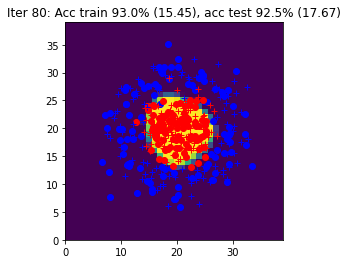

Iter 81: Acc train 93.5% (14.00), acc test 94.0% (15.03)


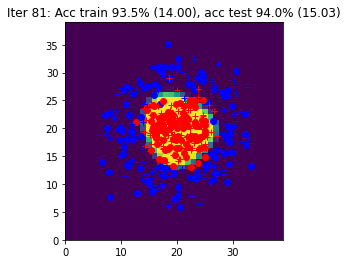

Iter 82: Acc train 94.0% (14.34), acc test 94.5% (16.34)


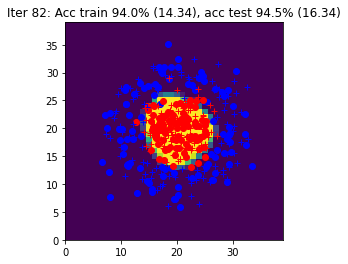

Iter 83: Acc train 94.5% (13.13), acc test 94.0% (14.05)


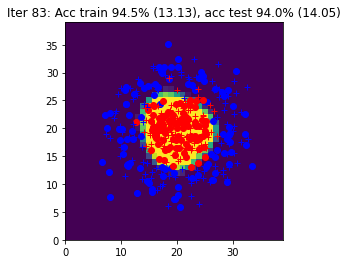

Iter 84: Acc train 95.5% (13.30), acc test 95.0% (15.17)


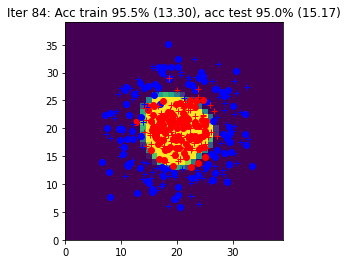

Iter 85: Acc train 94.5% (13.12), acc test 94.0% (13.92)


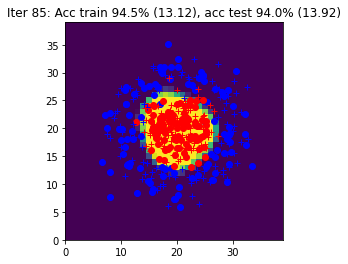

Iter 86: Acc train 95.0% (13.04), acc test 94.5% (13.56)


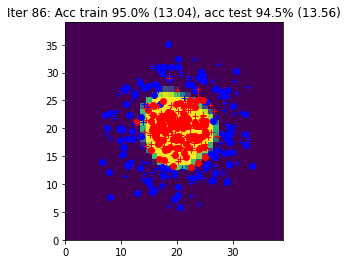

Iter 87: Acc train 94.5% (13.67), acc test 94.0% (15.87)


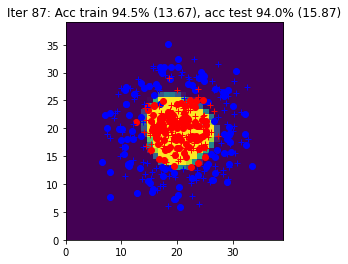

Iter 88: Acc train 95.0% (13.01), acc test 94.0% (13.26)


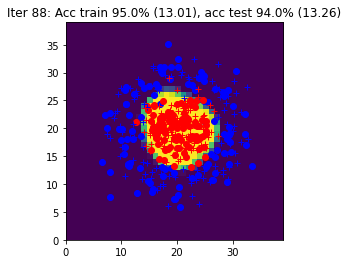

Iter 89: Acc train 94.0% (13.05), acc test 94.0% (14.40)


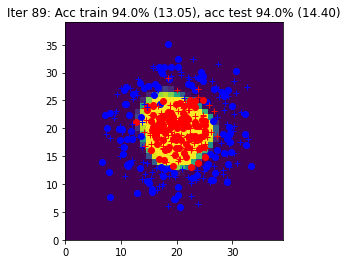

Iter 90: Acc train 94.5% (13.73), acc test 94.0% (16.56)


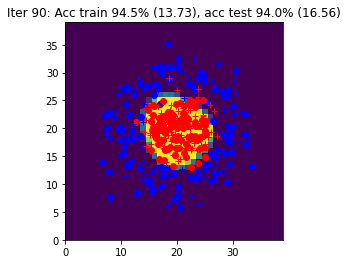

Iter 91: Acc train 94.0% (12.91), acc test 94.0% (14.22)


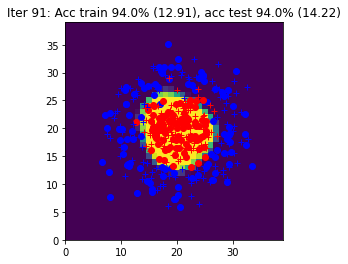

Iter 92: Acc train 95.0% (12.91), acc test 93.5% (13.62)


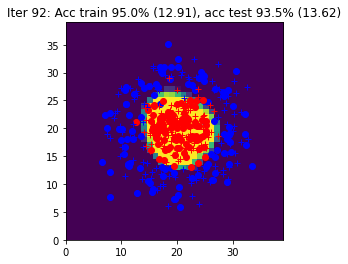

Iter 93: Acc train 95.5% (13.06), acc test 94.0% (15.31)


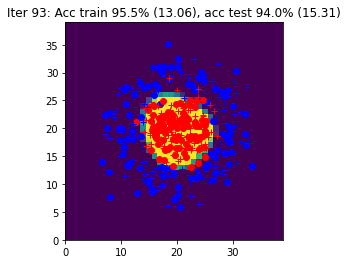

Iter 94: Acc train 95.5% (12.82), acc test 94.0% (13.85)


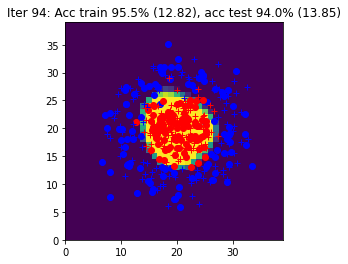

Iter 95: Acc train 95.0% (12.71), acc test 93.0% (13.96)


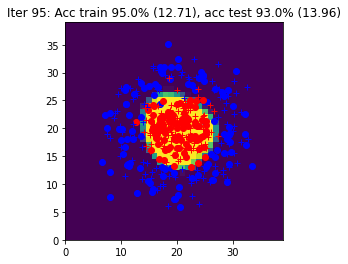

Iter 96: Acc train 95.5% (12.65), acc test 93.5% (13.56)


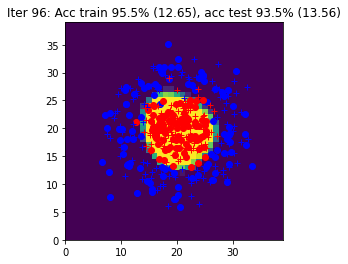

Iter 97: Acc train 94.0% (12.81), acc test 94.0% (14.09)


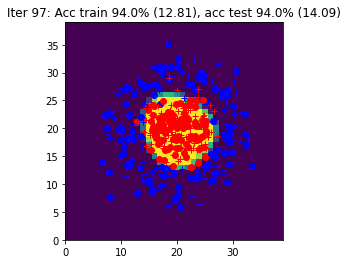

Iter 98: Acc train 95.0% (12.59), acc test 93.5% (14.02)


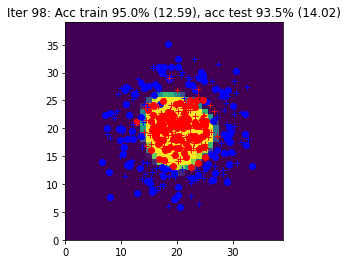

Iter 99: Acc train 95.5% (12.73), acc test 94.0% (14.57)


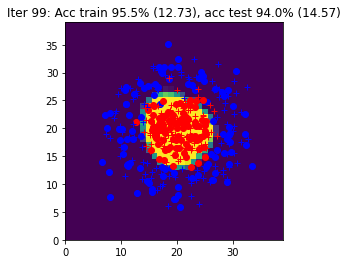

Iter 100: Acc train 95.0% (12.66), acc test 93.5% (14.50)


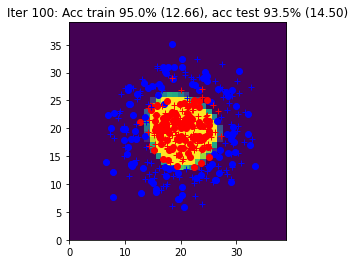

Iter 101: Acc train 95.5% (12.62), acc test 93.5% (13.16)


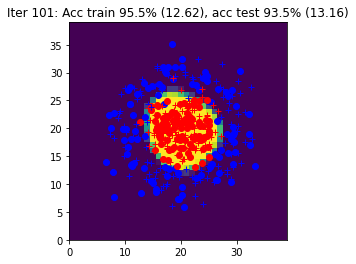

Iter 102: Acc train 93.5% (14.03), acc test 94.0% (16.24)


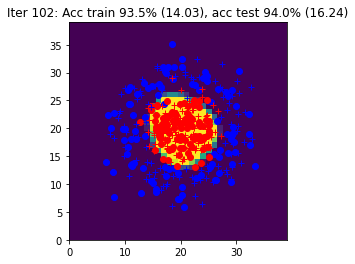

Iter 103: Acc train 95.5% (12.49), acc test 94.5% (14.57)


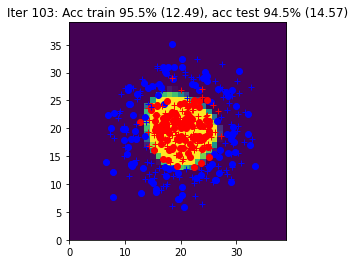

Iter 104: Acc train 95.5% (12.64), acc test 94.0% (14.74)


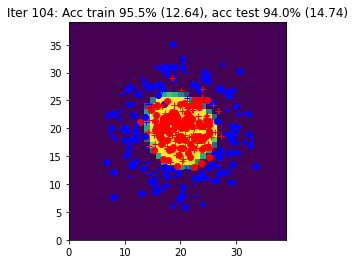

Iter 105: Acc train 95.5% (12.43), acc test 94.0% (14.16)


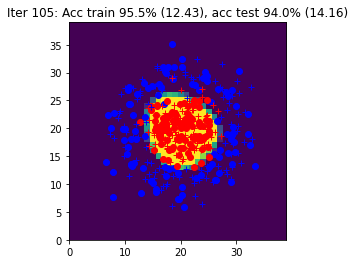

Iter 106: Acc train 95.5% (12.52), acc test 93.5% (14.20)


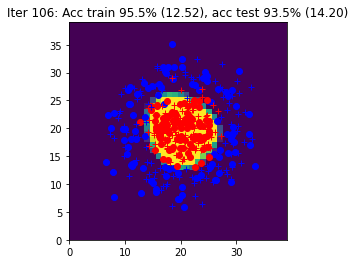

Iter 107: Acc train 94.5% (12.93), acc test 94.5% (14.30)


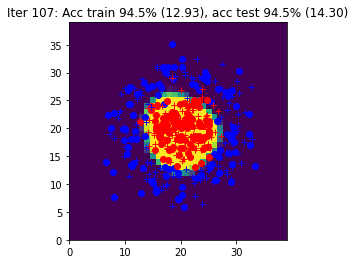

Iter 108: Acc train 94.0% (12.71), acc test 94.5% (14.54)


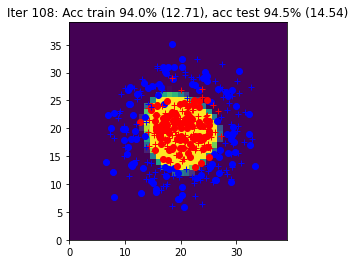

Iter 109: Acc train 95.0% (12.32), acc test 94.0% (13.96)


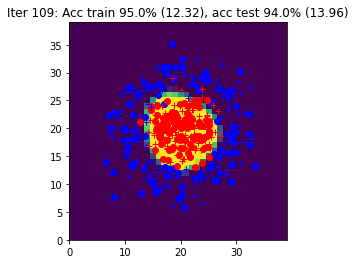

Iter 110: Acc train 94.0% (13.24), acc test 94.0% (13.99)


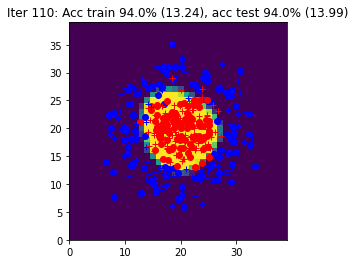

Iter 111: Acc train 95.5% (12.46), acc test 94.0% (13.50)


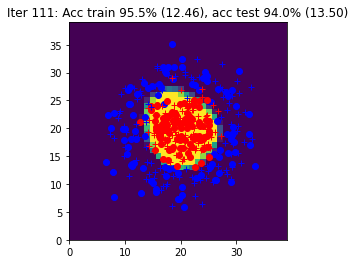

Iter 112: Acc train 94.0% (14.57), acc test 93.5% (14.64)


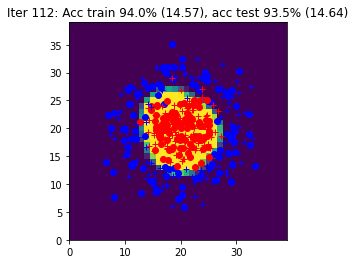

Iter 113: Acc train 94.5% (12.35), acc test 94.5% (14.72)


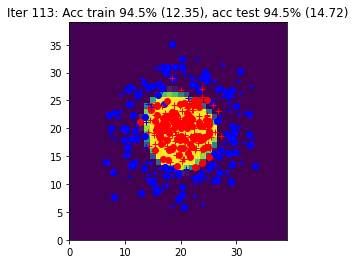

Iter 114: Acc train 95.5% (12.19), acc test 94.0% (14.14)


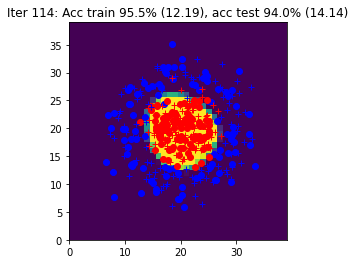

Iter 115: Acc train 95.5% (12.33), acc test 94.0% (14.12)


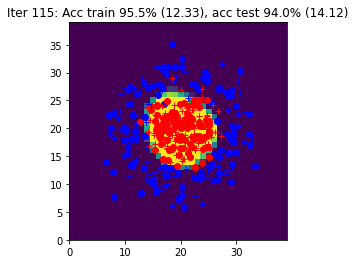

Iter 116: Acc train 95.5% (12.45), acc test 93.5% (14.56)


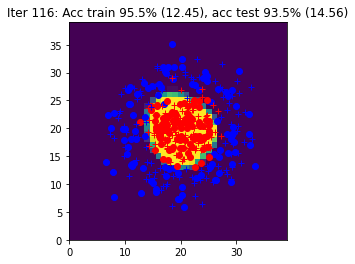

Iter 117: Acc train 95.0% (12.18), acc test 94.0% (13.60)


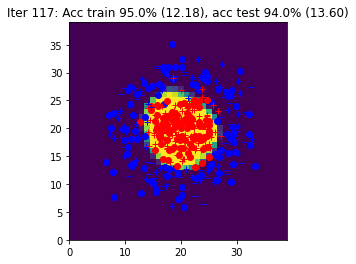

Iter 118: Acc train 95.5% (12.02), acc test 93.5% (13.85)


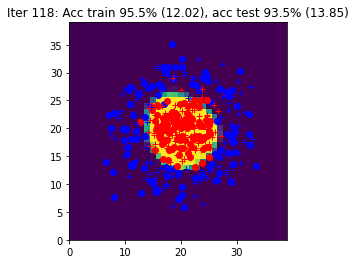

Iter 119: Acc train 94.0% (14.46), acc test 93.5% (14.21)


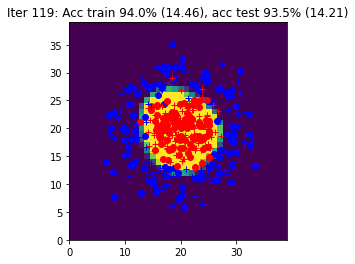

Iter 120: Acc train 95.5% (12.17), acc test 94.0% (13.16)


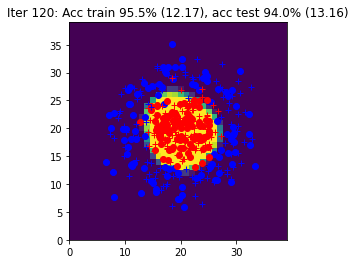

Iter 121: Acc train 95.5% (11.97), acc test 93.5% (13.62)


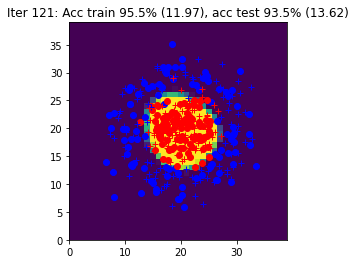

Iter 122: Acc train 96.0% (12.26), acc test 94.0% (12.56)


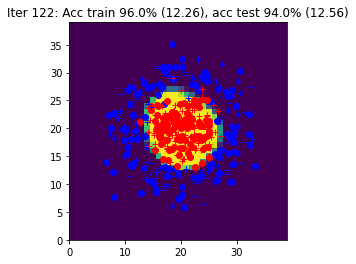

Iter 123: Acc train 97.0% (12.14), acc test 93.0% (12.84)


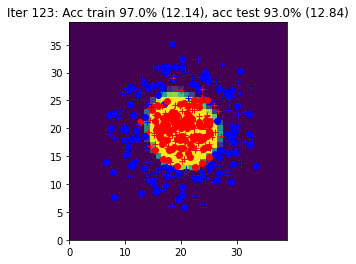

Iter 124: Acc train 94.0% (13.14), acc test 94.0% (16.22)


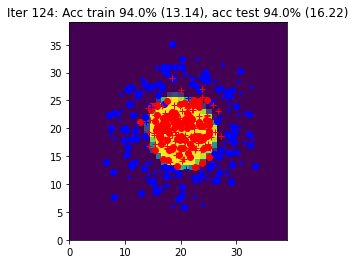

Iter 125: Acc train 94.5% (12.55), acc test 94.0% (13.68)


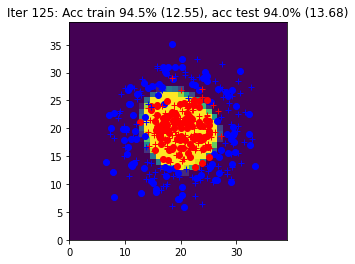

Iter 126: Acc train 92.5% (14.02), acc test 92.5% (18.16)


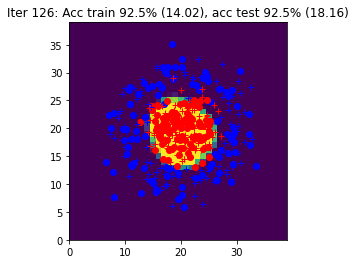

Iter 127: Acc train 96.5% (11.94), acc test 93.5% (13.10)


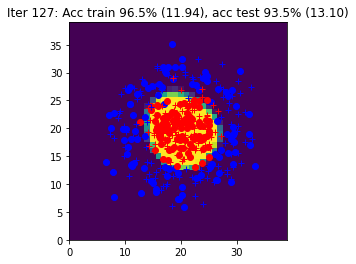

Iter 128: Acc train 94.0% (12.70), acc test 94.5% (15.01)


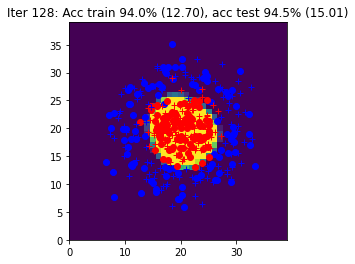

Iter 129: Acc train 96.5% (12.14), acc test 94.0% (12.61)


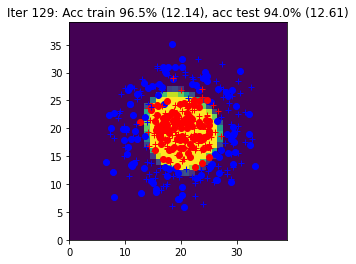

Iter 130: Acc train 97.0% (11.92), acc test 94.0% (13.20)


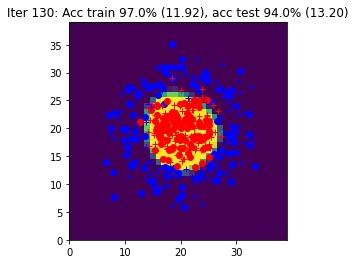

Iter 131: Acc train 95.0% (12.05), acc test 94.0% (13.16)


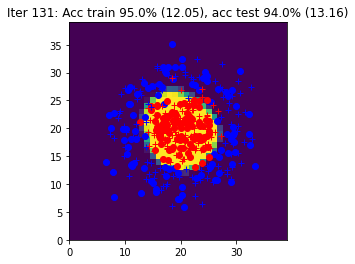

Iter 132: Acc train 95.0% (11.88), acc test 95.0% (14.50)


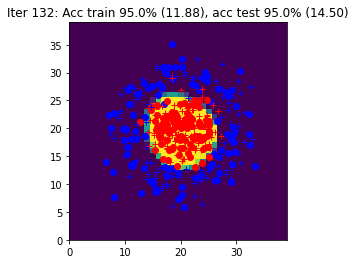

Iter 133: Acc train 95.0% (12.16), acc test 93.5% (13.88)


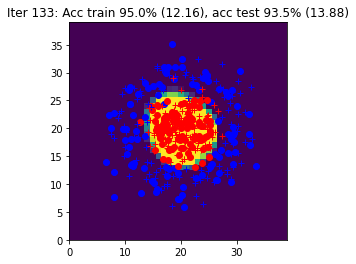

Iter 134: Acc train 95.5% (11.81), acc test 94.0% (14.04)


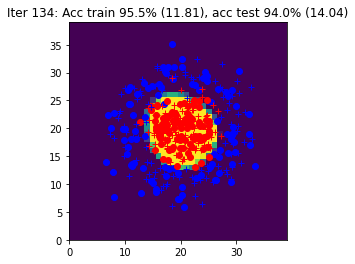

Iter 135: Acc train 94.5% (12.34), acc test 94.0% (12.71)


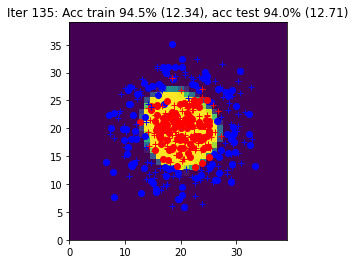

Iter 136: Acc train 96.0% (11.82), acc test 94.0% (12.76)


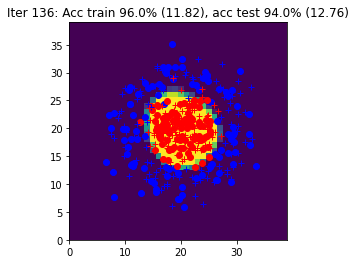

Iter 137: Acc train 95.0% (11.81), acc test 95.0% (14.51)


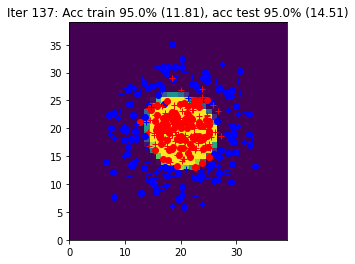

Iter 138: Acc train 96.0% (11.61), acc test 94.0% (13.04)


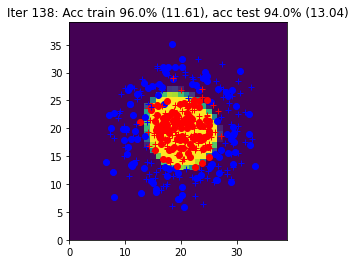

Iter 139: Acc train 95.5% (11.84), acc test 94.0% (14.12)


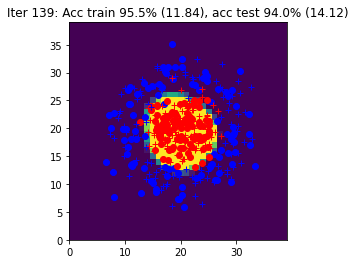

Iter 140: Acc train 95.0% (11.72), acc test 93.5% (14.15)


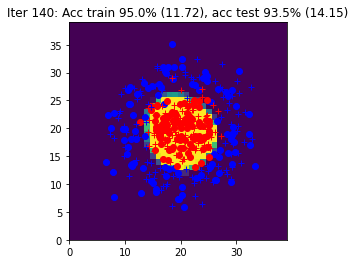

Iter 141: Acc train 95.5% (11.72), acc test 94.0% (13.25)


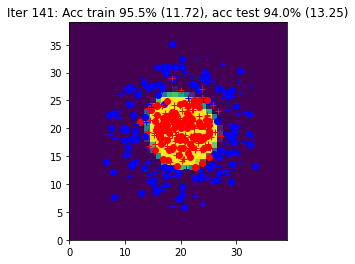

Iter 142: Acc train 95.0% (11.66), acc test 94.5% (13.11)


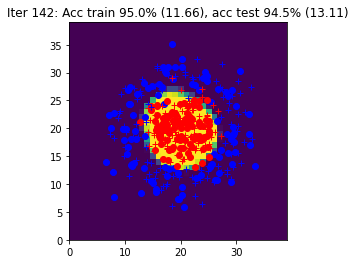

Iter 143: Acc train 95.0% (12.03), acc test 94.5% (13.82)


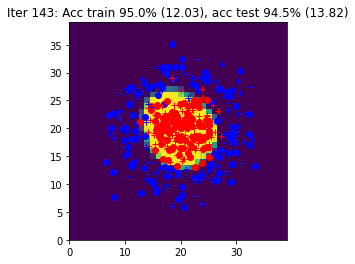

Iter 144: Acc train 95.0% (11.48), acc test 94.0% (13.69)


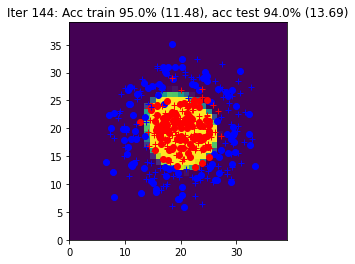

Iter 145: Acc train 97.0% (11.67), acc test 93.5% (12.54)


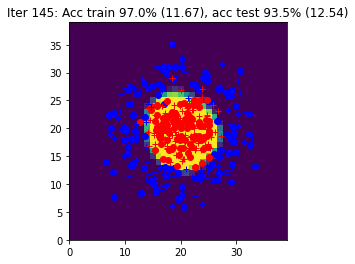

Iter 146: Acc train 95.5% (11.77), acc test 94.5% (14.28)


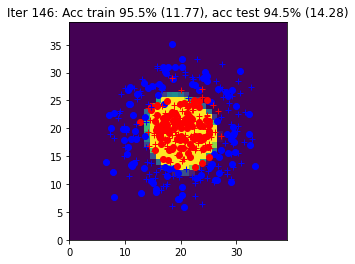

Iter 147: Acc train 95.0% (12.62), acc test 94.0% (12.84)


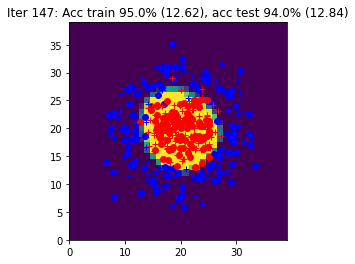

Iter 148: Acc train 95.0% (11.69), acc test 94.5% (13.98)


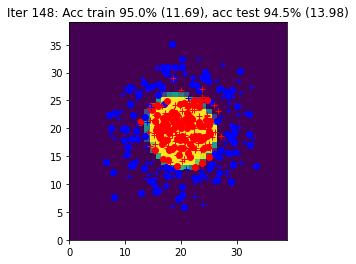

Iter 149: Acc train 93.5% (12.60), acc test 94.5% (15.22)


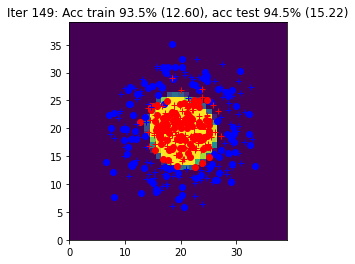

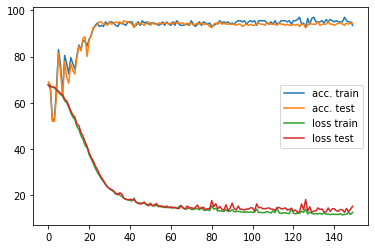

In [ ]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.03

params = init_params(nx, nh, ny)

curves = [[],[], [], []]

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    #####################
    ## Your code here  ##
    #####################
    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]
  
        # write the optimization algorithm on the batch (X,Y)
        # using the functions: forward, loss_accuracy, sgd
        # and the backward function with autograd

        Yhat, outputs = forward(params, X)
        L, acc = loss_accuracy(Yhat, Y)
        L.backward()
        params = sgd(params,eta)
    ####################
    ##      END        #
    ####################


    Yhat_train, _ = forward(params, data.Xtrain)
    Yhat_test, _ = forward(params, data.Xtest)
    Ltrain, acctrain = loss_accuracy(Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(Yhat_test, data.Ytest)
    Ygrid, _ = forward(params, data.Xgrid)  

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
    print(title)
    # detach() is used to remove the predictions from the computational graph in autograd
    data.plot_data_with_grid(Ygrid.detach(), title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain)
    curves[3].append(Ltest)

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Part 3 : Simplification of the forward pass with `torch.nn`

`init_params` and `forward` are replaced by the `init_model` function which defines the network architecture and the loss.

In [ ]:
def init_model(nx, nh, ny):

    #####################
    ## Your code here  ##
    #####################

    model = torch.nn.Sequential(
        torch.nn.Linear(nx, nh),
        torch.nn.Tanh(),
        torch.nn.Linear(nh, ny),
    )
    loss = torch.nn.CrossEntropyLoss()

    ####################
    ##      END        #
    ####################

    return model, loss

In [ ]:
def loss_accuracy(loss, Yhat, Y):

    #####################
    ## Your code here  ##
    #####################
    # call the loss function

    _, indsY = torch.max(Y,1)
    _, indsYhat = torch.max(Yhat,1)
    L = loss(Yhat,indsY) 
    acc = (indsY == indsYhat).float().mean() * 100

    ####################
    ##      END        #
    ####################

    return L, acc

In [ ]:
def sgd(model, eta):

    #####################
    ## Your code here  ##
    #####################
    # update the network weights
    # warning: use torch.no_grad()
    # and reset to zero the gradient accumulators

    with torch.no_grad():
        for param in model.parameters():
            param -= eta * param.grad
        model.zero_grad()
    ####################
    ##      END        #
    ####################
    return model

## Global learning procedure with autograd and `torch.nn`

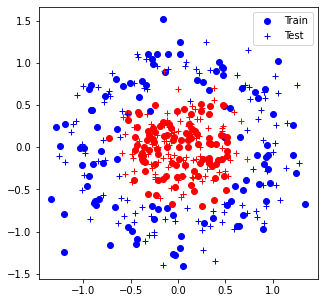

Iter 0: Acc train 58.5% (0.70), acc test 57.5% (0.69)


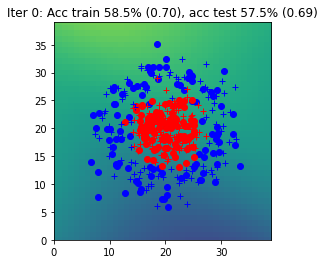

Iter 1: Acc train 60.5% (0.69), acc test 60.5% (0.69)


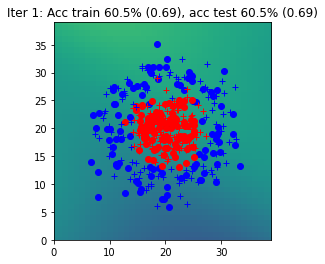

Iter 2: Acc train 65.0% (0.69), acc test 65.0% (0.69)


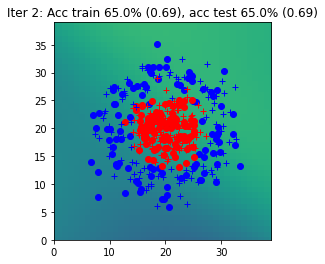

Iter 3: Acc train 45.0% (0.69), acc test 47.5% (0.69)


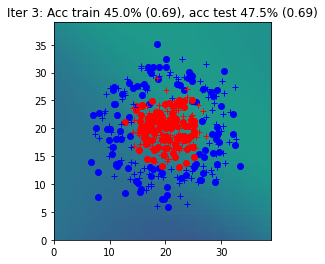

Iter 4: Acc train 40.0% (0.69), acc test 41.0% (0.69)


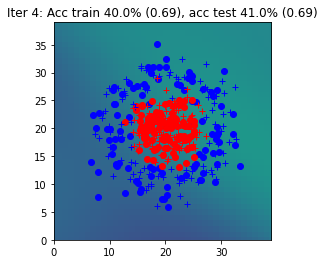

Iter 5: Acc train 57.0% (0.68), acc test 61.0% (0.68)


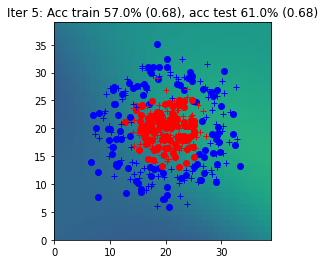

Iter 6: Acc train 55.5% (0.68), acc test 59.5% (0.68)


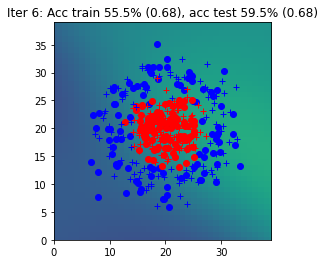

Iter 7: Acc train 69.0% (0.68), acc test 66.5% (0.68)


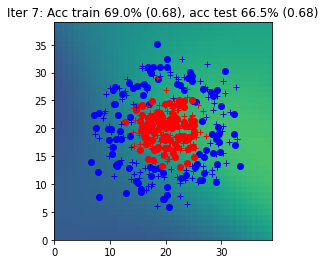

Iter 8: Acc train 67.5% (0.67), acc test 66.5% (0.68)


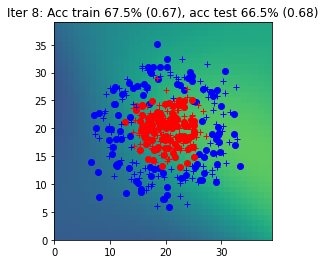

Iter 9: Acc train 61.0% (0.67), acc test 63.5% (0.67)


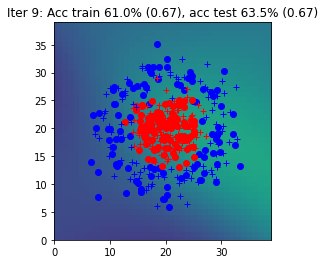

Iter 10: Acc train 69.5% (0.66), acc test 68.5% (0.67)


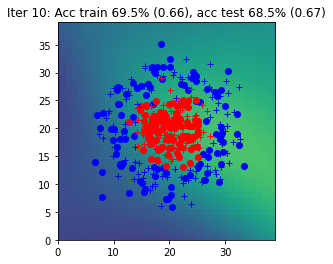

Iter 11: Acc train 52.0% (0.66), acc test 53.0% (0.66)


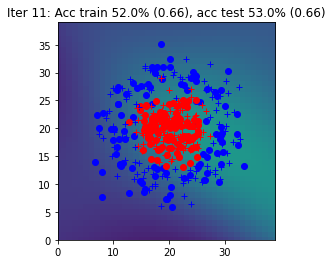

Iter 12: Acc train 75.0% (0.65), acc test 73.5% (0.65)


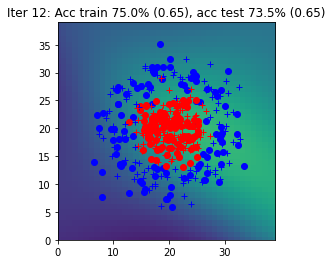

Iter 13: Acc train 76.0% (0.64), acc test 73.5% (0.65)


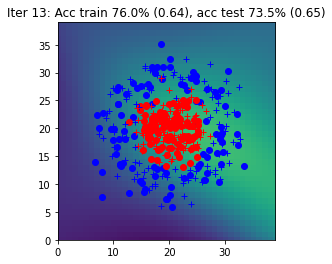

Iter 14: Acc train 83.0% (0.64), acc test 79.5% (0.64)


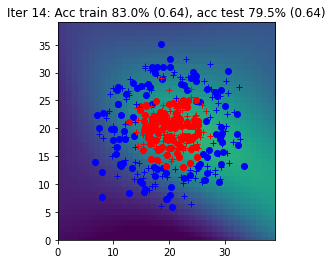

Iter 15: Acc train 50.0% (0.64), acc test 50.0% (0.64)


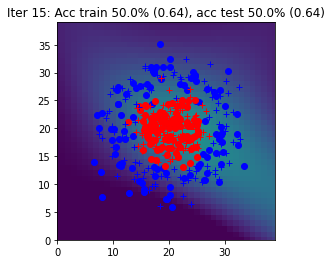

Iter 16: Acc train 83.5% (0.62), acc test 83.0% (0.62)


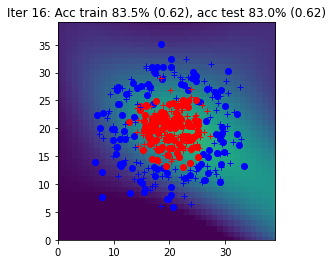

Iter 17: Acc train 73.5% (0.60), acc test 76.0% (0.61)


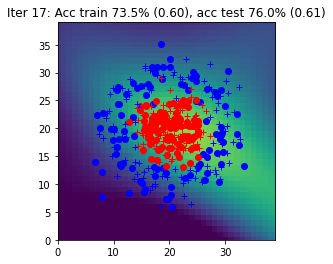

Iter 18: Acc train 87.0% (0.59), acc test 85.5% (0.59)


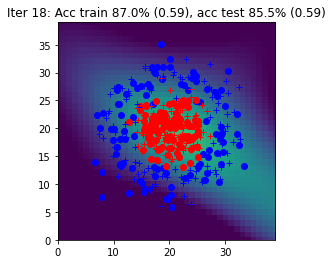

Iter 19: Acc train 78.0% (0.57), acc test 78.5% (0.58)


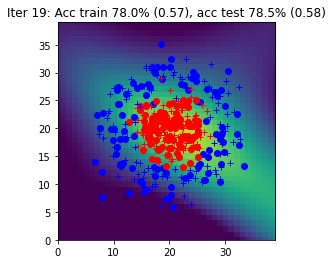

Iter 20: Acc train 88.0% (0.56), acc test 88.5% (0.56)


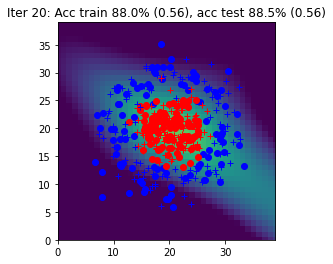

Iter 21: Acc train 85.5% (0.53), acc test 83.5% (0.54)


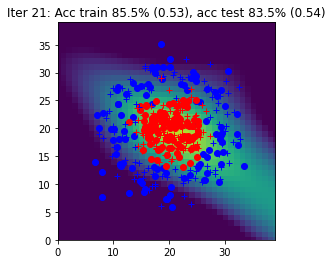

Iter 22: Acc train 86.0% (0.52), acc test 84.5% (0.52)


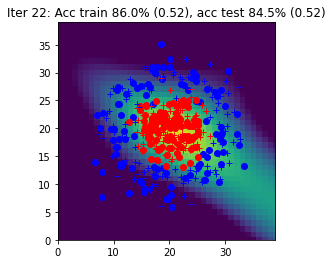

Iter 23: Acc train 84.5% (0.50), acc test 84.0% (0.50)


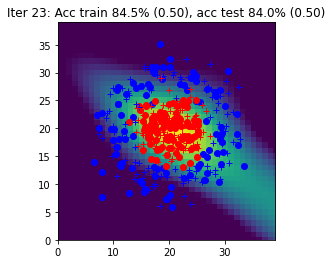

Iter 24: Acc train 84.0% (0.48), acc test 83.0% (0.49)


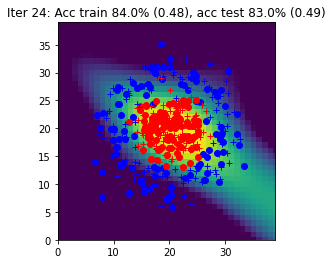

Iter 25: Acc train 85.0% (0.46), acc test 85.0% (0.47)


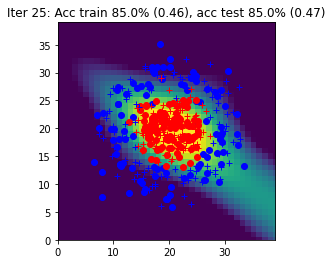

Iter 26: Acc train 91.0% (0.45), acc test 92.0% (0.46)


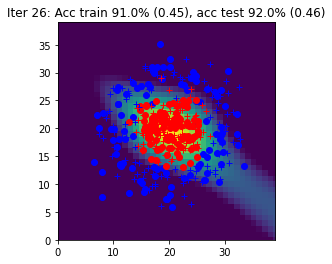

Iter 27: Acc train 87.0% (0.42), acc test 84.0% (0.43)


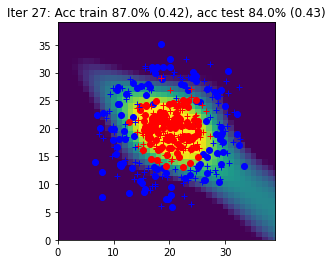

Iter 28: Acc train 90.5% (0.40), acc test 93.0% (0.41)


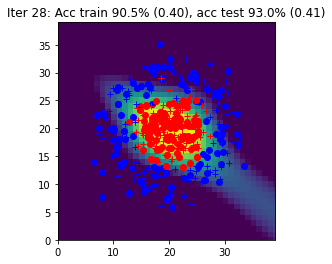

Iter 29: Acc train 93.0% (0.38), acc test 89.5% (0.39)


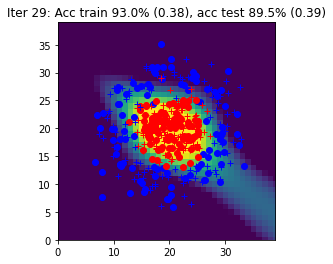

Iter 30: Acc train 92.5% (0.36), acc test 94.0% (0.38)


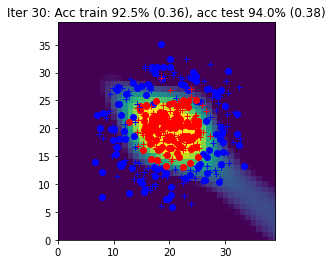

Iter 31: Acc train 92.0% (0.35), acc test 88.5% (0.37)


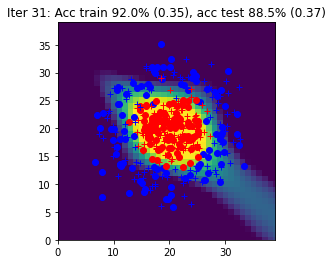

Iter 32: Acc train 93.5% (0.33), acc test 94.0% (0.35)


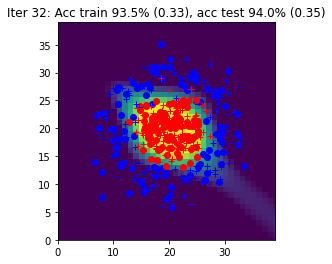

Iter 33: Acc train 94.5% (0.32), acc test 94.0% (0.34)


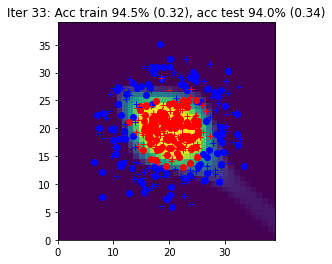

Iter 34: Acc train 94.0% (0.31), acc test 94.5% (0.32)


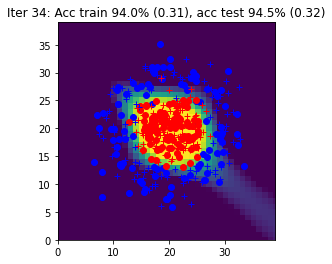

Iter 35: Acc train 95.0% (0.29), acc test 94.5% (0.31)


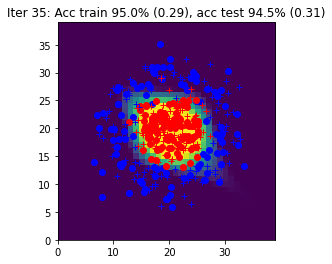

Iter 36: Acc train 95.5% (0.28), acc test 95.0% (0.30)


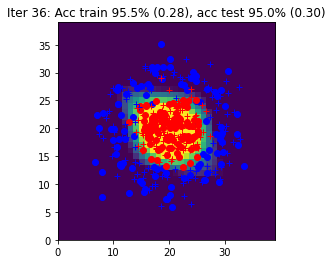

Iter 37: Acc train 95.5% (0.27), acc test 94.5% (0.28)


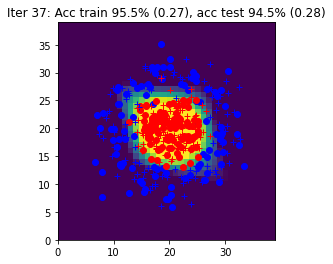

Iter 38: Acc train 96.0% (0.26), acc test 94.0% (0.28)


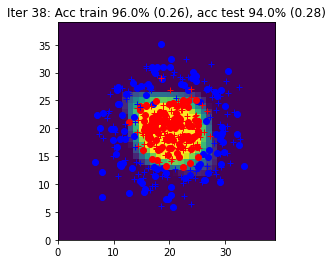

Iter 39: Acc train 95.5% (0.26), acc test 94.5% (0.27)


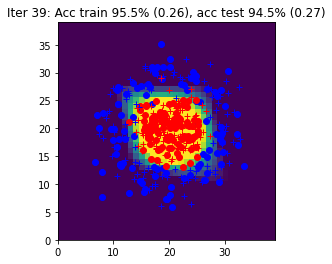

Iter 40: Acc train 95.0% (0.25), acc test 94.0% (0.26)


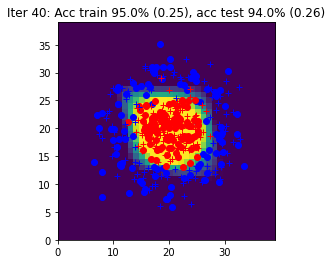

Iter 41: Acc train 97.0% (0.24), acc test 94.5% (0.26)


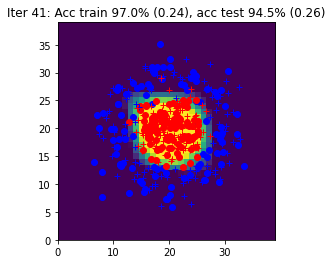

Iter 42: Acc train 95.5% (0.23), acc test 94.5% (0.25)


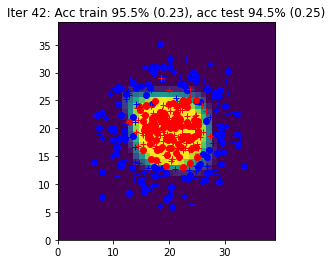

Iter 43: Acc train 95.0% (0.23), acc test 94.0% (0.24)


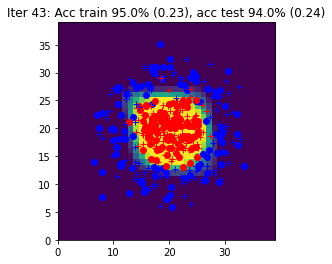

Iter 44: Acc train 96.5% (0.22), acc test 94.5% (0.24)


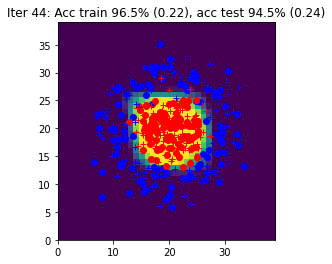

Iter 45: Acc train 97.0% (0.21), acc test 94.5% (0.23)


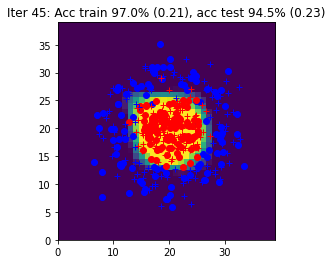

Iter 46: Acc train 96.5% (0.21), acc test 94.5% (0.23)


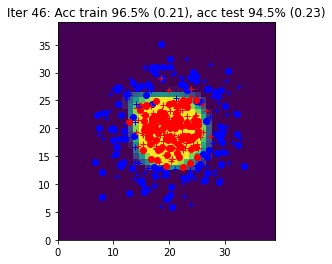

Iter 47: Acc train 94.5% (0.21), acc test 94.0% (0.23)


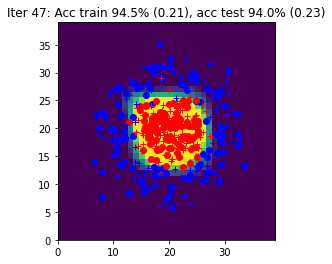

Iter 48: Acc train 96.0% (0.20), acc test 94.5% (0.22)


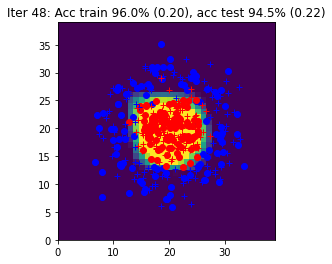

Iter 49: Acc train 96.5% (0.20), acc test 94.5% (0.22)


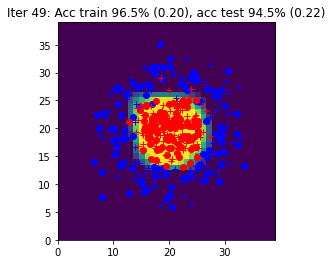

Iter 50: Acc train 96.5% (0.19), acc test 94.5% (0.21)


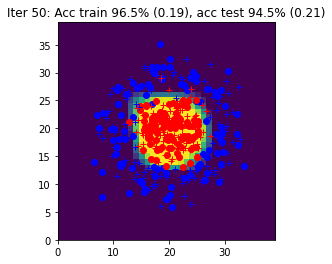

Iter 51: Acc train 97.0% (0.19), acc test 94.5% (0.21)


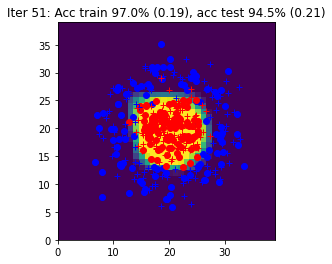

Iter 52: Acc train 96.5% (0.19), acc test 94.5% (0.21)


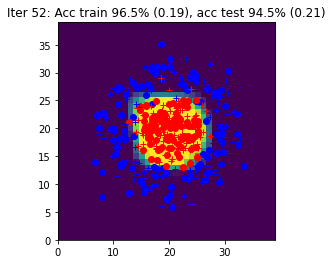

Iter 53: Acc train 96.0% (0.18), acc test 94.5% (0.21)


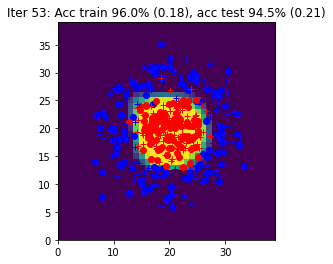

Iter 54: Acc train 96.0% (0.18), acc test 94.5% (0.21)


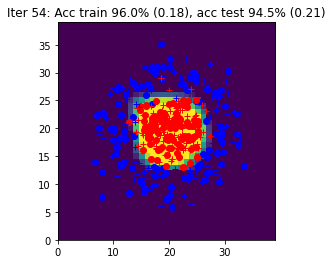

Iter 55: Acc train 95.0% (0.18), acc test 95.0% (0.21)


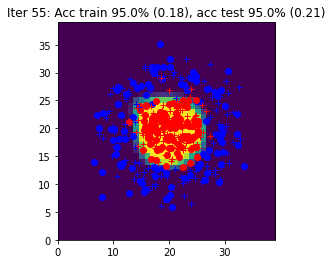

Iter 56: Acc train 96.0% (0.18), acc test 94.5% (0.20)


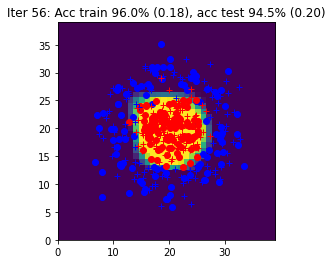

Iter 57: Acc train 96.0% (0.17), acc test 94.5% (0.19)


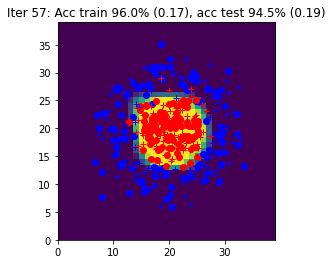

Iter 58: Acc train 96.5% (0.17), acc test 94.5% (0.20)


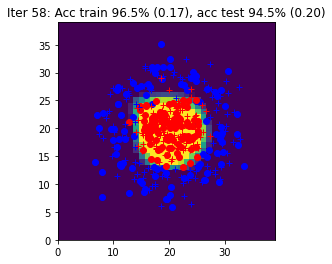

Iter 59: Acc train 95.5% (0.18), acc test 95.0% (0.21)


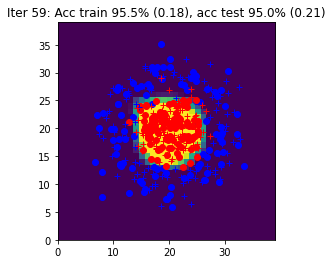

Iter 60: Acc train 95.5% (0.17), acc test 94.5% (0.19)


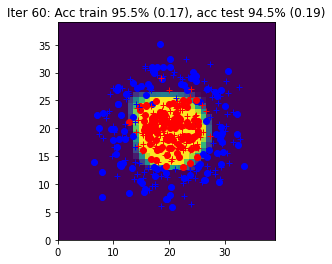

Iter 61: Acc train 96.0% (0.17), acc test 94.5% (0.19)


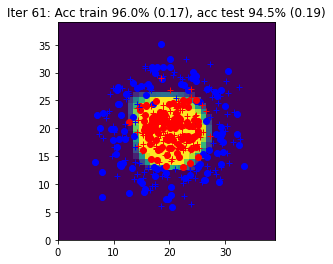

Iter 62: Acc train 96.0% (0.16), acc test 94.5% (0.19)


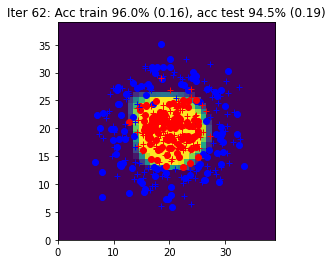

Iter 63: Acc train 96.0% (0.17), acc test 94.0% (0.18)


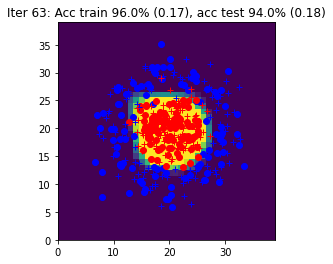

Iter 64: Acc train 96.5% (0.16), acc test 94.0% (0.19)


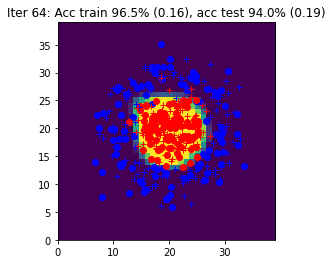

Iter 65: Acc train 95.5% (0.16), acc test 94.0% (0.18)


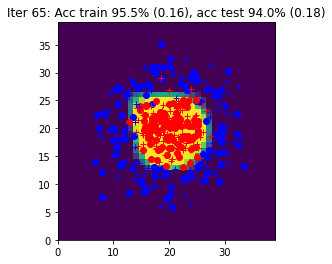

Iter 66: Acc train 95.5% (0.16), acc test 94.5% (0.18)


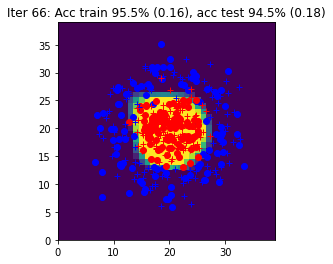

Iter 67: Acc train 96.5% (0.16), acc test 94.0% (0.18)


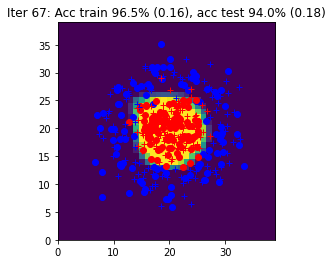

Iter 68: Acc train 95.5% (0.16), acc test 94.5% (0.18)


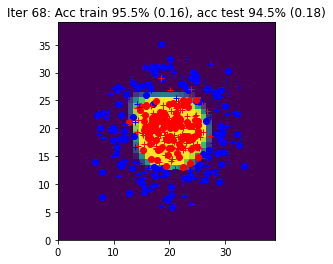

Iter 69: Acc train 96.0% (0.16), acc test 94.0% (0.18)


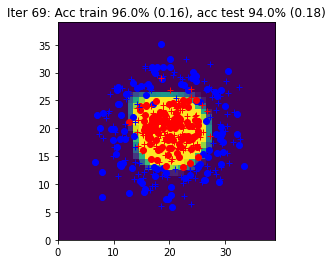

Iter 70: Acc train 96.0% (0.15), acc test 94.0% (0.18)


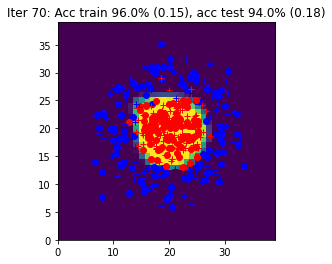

Iter 71: Acc train 96.0% (0.15), acc test 94.0% (0.17)


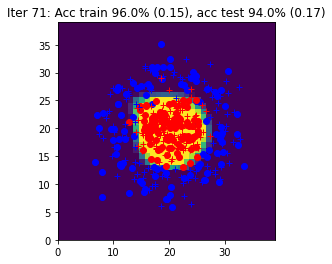

Iter 72: Acc train 95.5% (0.15), acc test 94.5% (0.17)


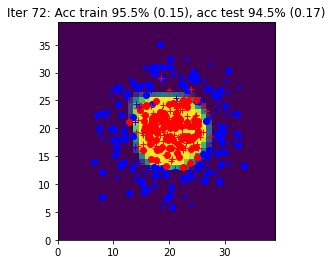

Iter 73: Acc train 95.5% (0.15), acc test 94.5% (0.18)


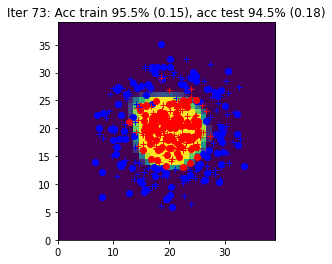

Iter 74: Acc train 96.5% (0.15), acc test 94.0% (0.17)


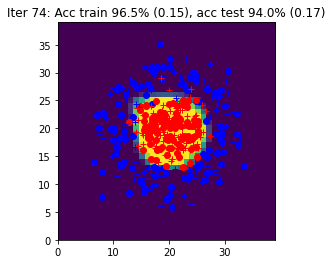

Iter 75: Acc train 96.0% (0.15), acc test 94.0% (0.17)


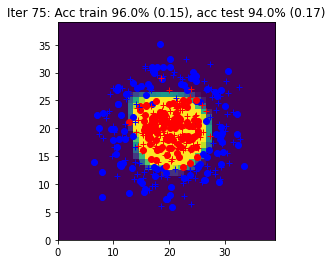

Iter 76: Acc train 95.0% (0.15), acc test 94.0% (0.17)


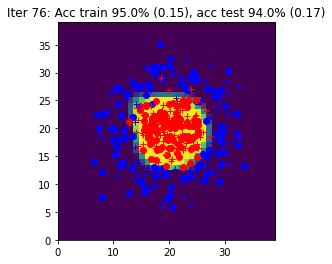

Iter 77: Acc train 96.0% (0.15), acc test 94.0% (0.17)


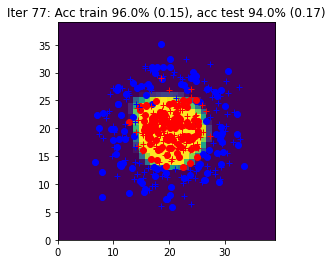

Iter 78: Acc train 95.5% (0.15), acc test 94.5% (0.17)


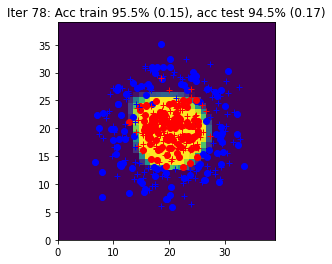

Iter 79: Acc train 96.5% (0.14), acc test 94.0% (0.17)


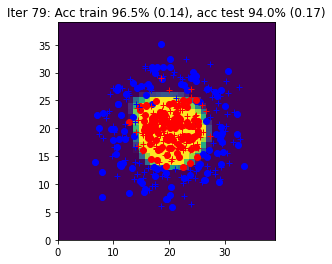

Iter 80: Acc train 96.0% (0.14), acc test 94.0% (0.17)


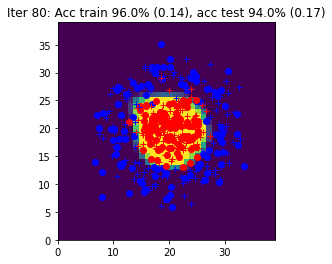

Iter 81: Acc train 95.0% (0.14), acc test 94.0% (0.17)


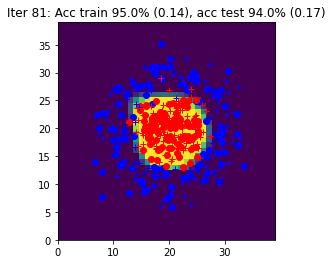

Iter 82: Acc train 96.5% (0.15), acc test 94.0% (0.17)


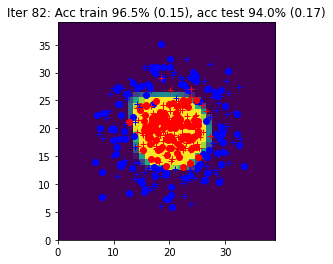

Iter 83: Acc train 96.0% (0.14), acc test 94.5% (0.17)


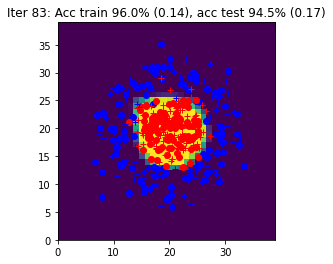

Iter 84: Acc train 96.0% (0.14), acc test 94.0% (0.17)


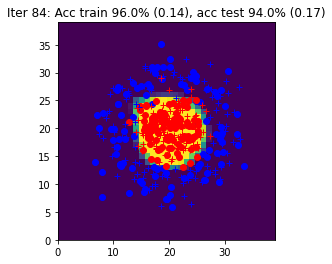

Iter 85: Acc train 96.0% (0.14), acc test 94.5% (0.17)


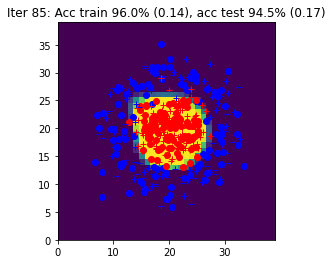

Iter 86: Acc train 95.5% (0.14), acc test 94.5% (0.17)


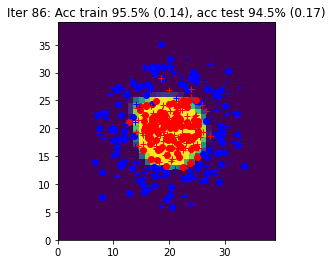

Iter 87: Acc train 95.5% (0.14), acc test 94.5% (0.18)


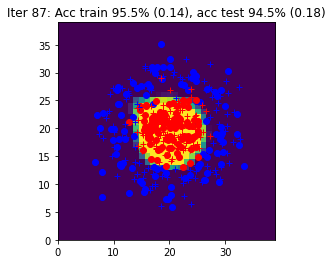

Iter 88: Acc train 96.5% (0.14), acc test 94.0% (0.17)


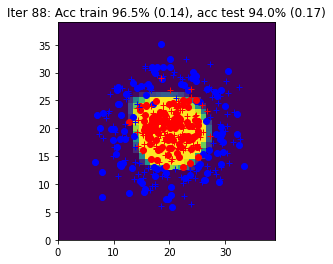

Iter 89: Acc train 95.5% (0.14), acc test 94.0% (0.17)


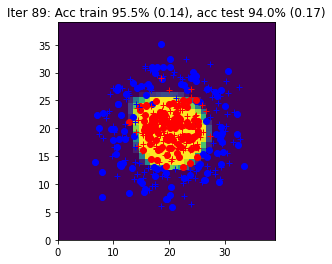

Iter 90: Acc train 96.0% (0.14), acc test 94.0% (0.17)


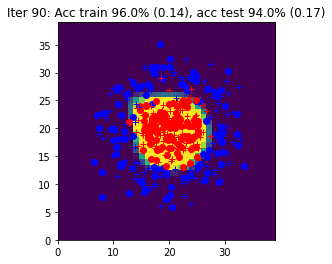

Iter 91: Acc train 95.5% (0.14), acc test 94.0% (0.17)


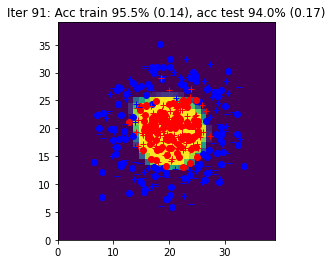

Iter 92: Acc train 95.0% (0.14), acc test 94.5% (0.18)


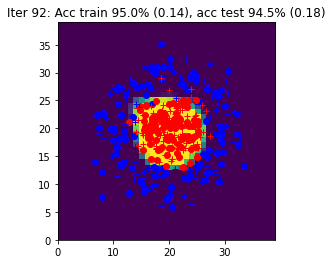

Iter 93: Acc train 96.0% (0.14), acc test 94.5% (0.17)


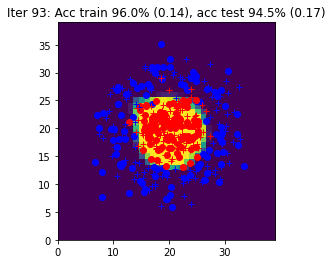

Iter 94: Acc train 96.0% (0.14), acc test 94.0% (0.16)


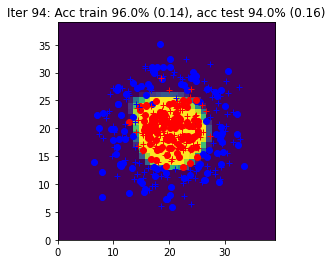

Iter 95: Acc train 95.5% (0.14), acc test 94.0% (0.16)


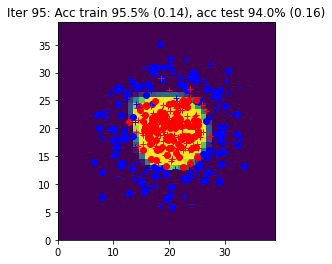

Iter 96: Acc train 96.0% (0.14), acc test 94.5% (0.17)


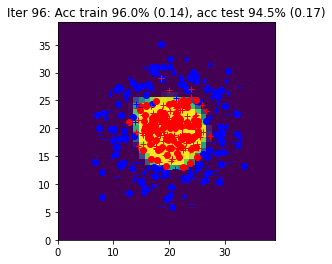

Iter 97: Acc train 95.5% (0.13), acc test 94.0% (0.17)


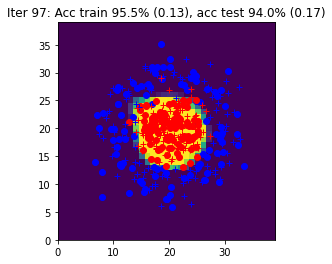

Iter 98: Acc train 95.5% (0.13), acc test 94.5% (0.17)


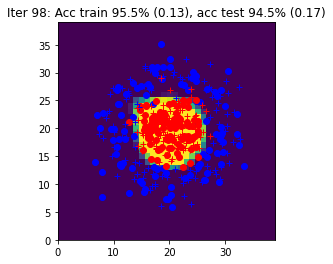

Iter 99: Acc train 96.0% (0.13), acc test 94.5% (0.16)


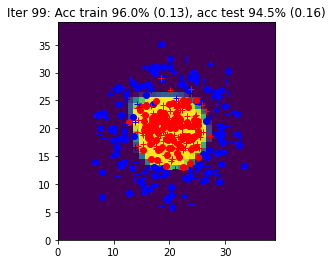

Iter 100: Acc train 95.5% (0.13), acc test 94.0% (0.17)


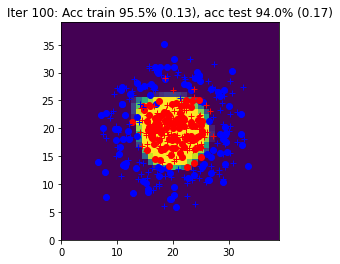

Iter 101: Acc train 95.5% (0.13), acc test 95.0% (0.17)


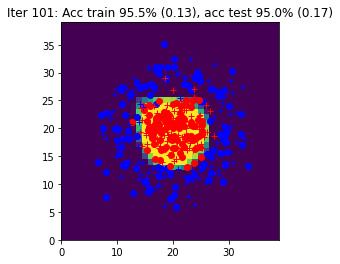

Iter 102: Acc train 96.0% (0.13), acc test 94.0% (0.16)


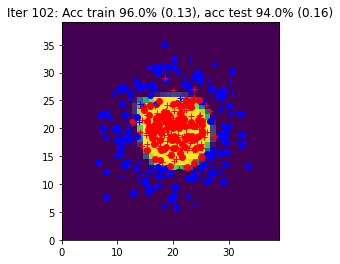

Iter 103: Acc train 96.0% (0.13), acc test 94.5% (0.17)


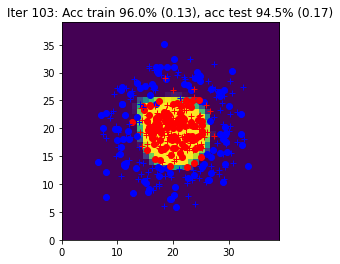

Iter 104: Acc train 95.5% (0.13), acc test 94.5% (0.17)


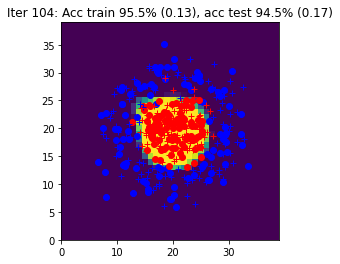

Iter 105: Acc train 95.5% (0.13), acc test 95.0% (0.18)


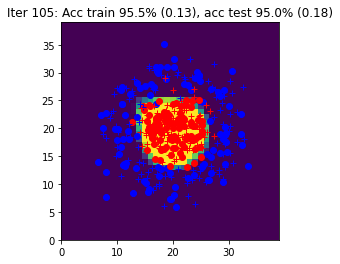

Iter 106: Acc train 96.0% (0.13), acc test 94.0% (0.16)


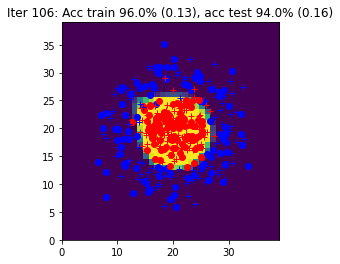

Iter 107: Acc train 96.0% (0.13), acc test 93.5% (0.16)


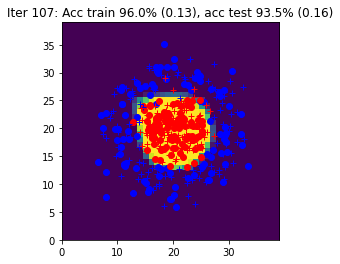

Iter 108: Acc train 96.0% (0.13), acc test 94.5% (0.16)


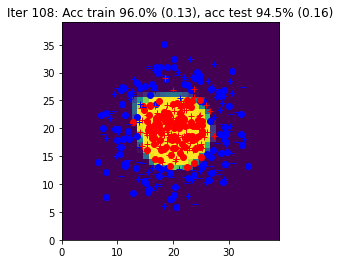

Iter 109: Acc train 95.5% (0.13), acc test 94.0% (0.17)


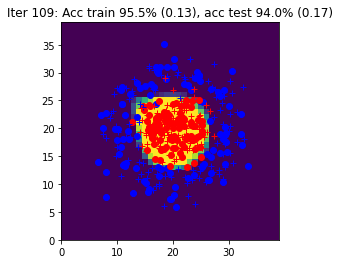

Iter 110: Acc train 96.0% (0.13), acc test 94.0% (0.16)


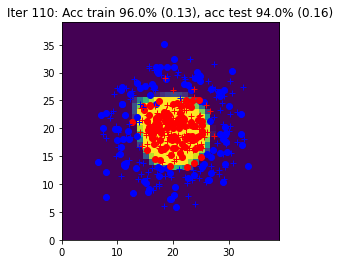

Iter 111: Acc train 96.5% (0.13), acc test 94.0% (0.16)


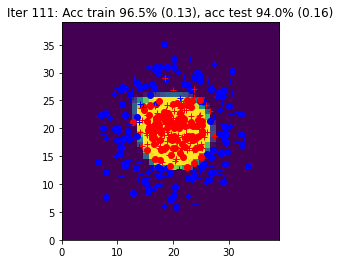

Iter 112: Acc train 97.0% (0.13), acc test 94.0% (0.16)


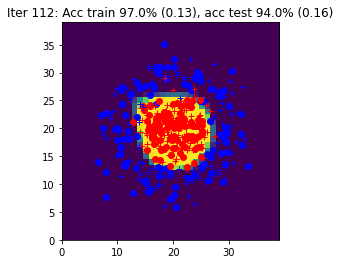

Iter 113: Acc train 96.0% (0.13), acc test 93.5% (0.16)


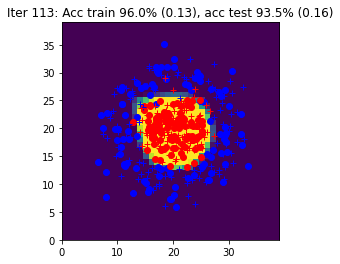

Iter 114: Acc train 96.0% (0.13), acc test 94.5% (0.17)


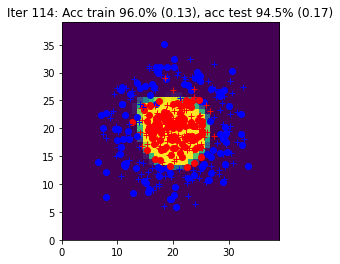

Iter 115: Acc train 96.0% (0.13), acc test 94.0% (0.16)


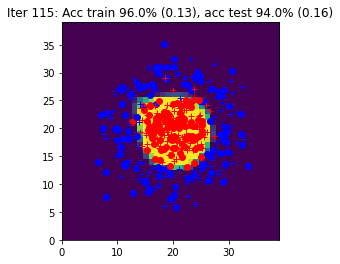

Iter 116: Acc train 96.0% (0.13), acc test 94.0% (0.16)


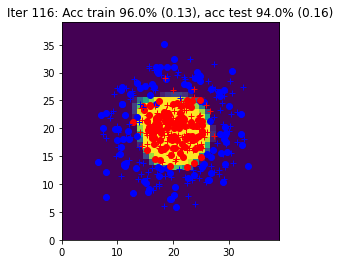

Iter 117: Acc train 95.5% (0.13), acc test 94.5% (0.17)


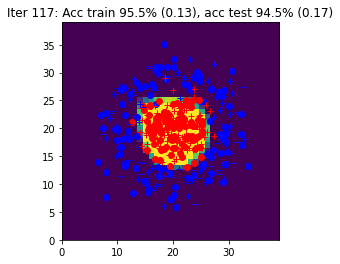

Iter 118: Acc train 95.5% (0.13), acc test 94.0% (0.16)


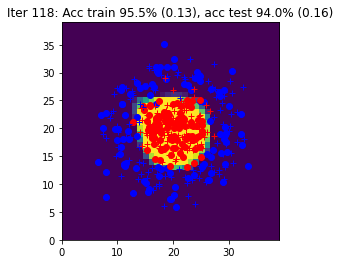

Iter 119: Acc train 95.5% (0.13), acc test 93.5% (0.16)


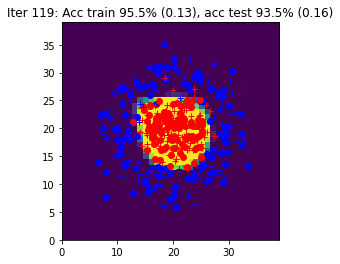

Iter 120: Acc train 97.0% (0.13), acc test 94.0% (0.16)


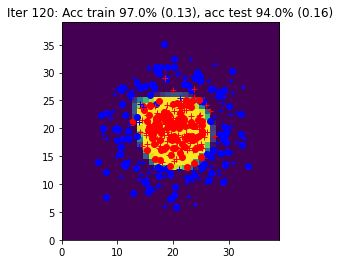

Iter 121: Acc train 96.0% (0.12), acc test 94.0% (0.16)


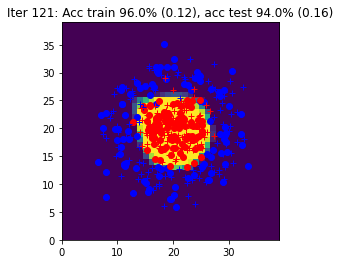

Iter 122: Acc train 97.5% (0.13), acc test 93.5% (0.16)


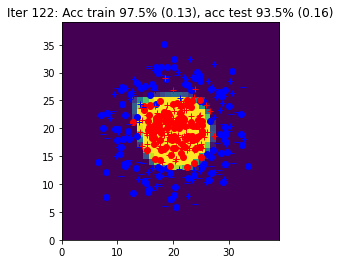

Iter 123: Acc train 96.0% (0.12), acc test 94.0% (0.16)


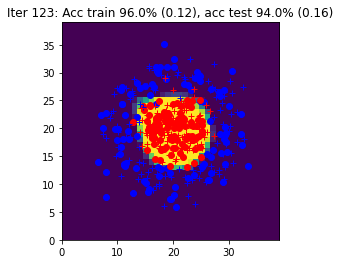

Iter 124: Acc train 97.5% (0.12), acc test 93.5% (0.16)


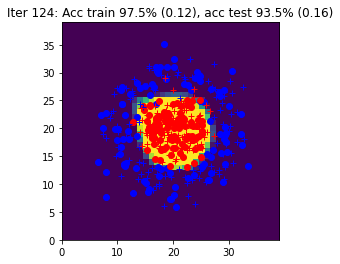

Iter 125: Acc train 97.0% (0.12), acc test 93.5% (0.16)


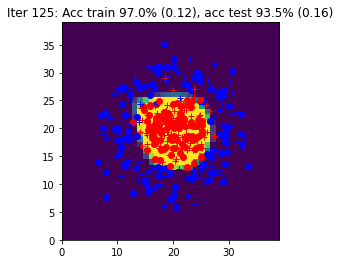

Iter 126: Acc train 97.0% (0.12), acc test 94.0% (0.15)


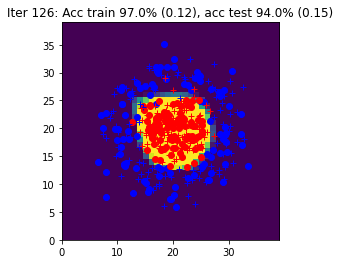

Iter 127: Acc train 96.5% (0.12), acc test 93.5% (0.16)


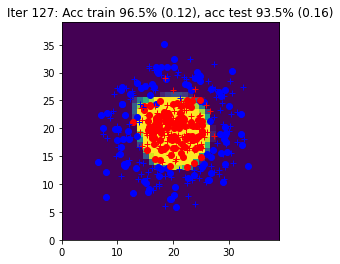

Iter 128: Acc train 96.5% (0.12), acc test 94.0% (0.16)


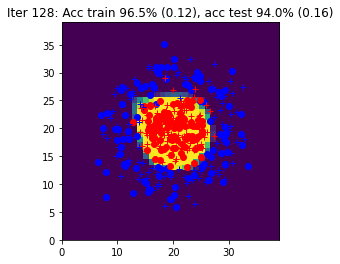

Iter 129: Acc train 96.0% (0.12), acc test 94.0% (0.16)


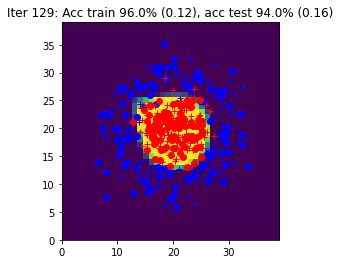

Iter 130: Acc train 97.0% (0.12), acc test 94.0% (0.16)


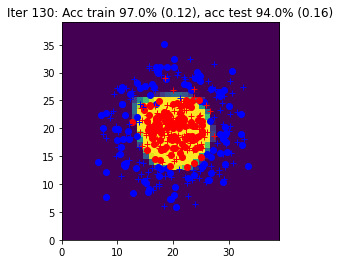

Iter 131: Acc train 96.0% (0.12), acc test 94.0% (0.16)


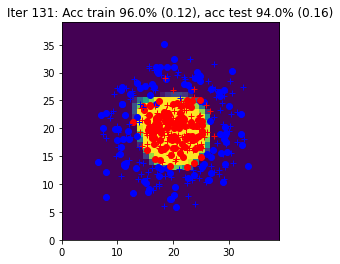

Iter 132: Acc train 95.5% (0.12), acc test 93.5% (0.16)


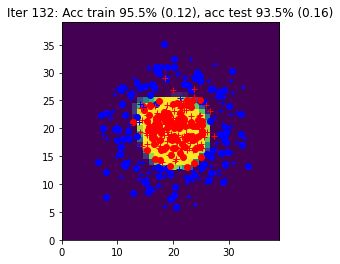

Iter 133: Acc train 95.5% (0.12), acc test 94.5% (0.17)


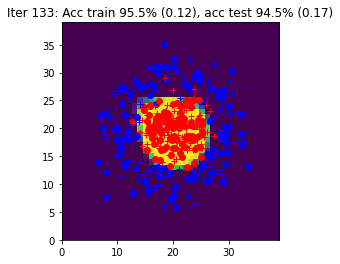

Iter 134: Acc train 96.0% (0.12), acc test 94.0% (0.16)


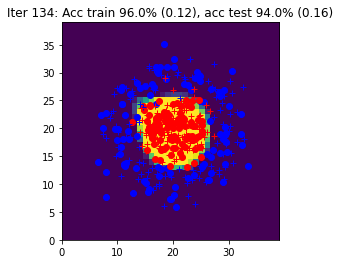

Iter 135: Acc train 97.0% (0.12), acc test 94.0% (0.16)


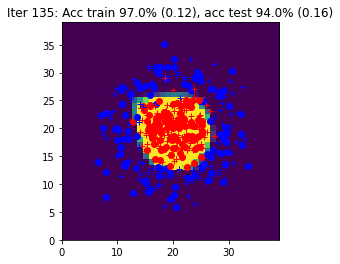

Iter 136: Acc train 97.0% (0.12), acc test 93.5% (0.16)


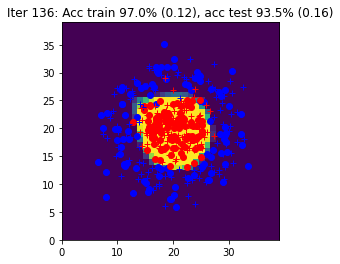

Iter 137: Acc train 96.5% (0.12), acc test 93.5% (0.16)


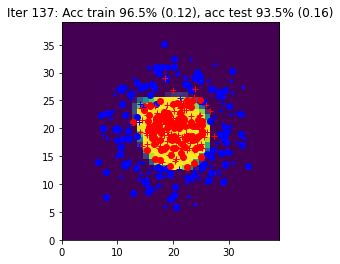

Iter 138: Acc train 96.5% (0.12), acc test 93.5% (0.16)


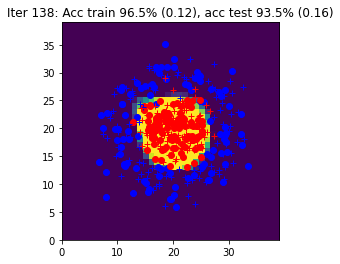

Iter 139: Acc train 96.0% (0.12), acc test 94.0% (0.16)


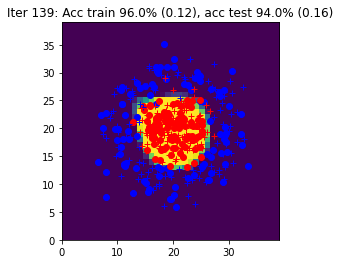

Iter 140: Acc train 97.0% (0.12), acc test 94.0% (0.16)


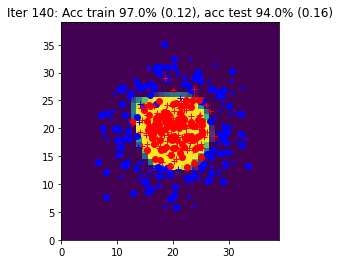

Iter 141: Acc train 97.0% (0.12), acc test 94.0% (0.15)


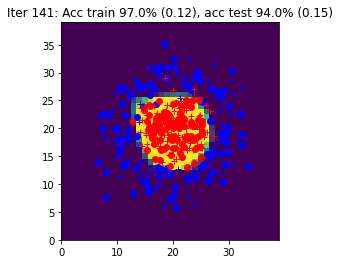

Iter 142: Acc train 97.0% (0.12), acc test 93.5% (0.16)


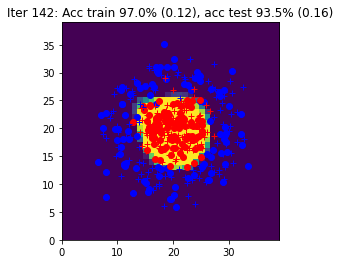

Iter 143: Acc train 96.0% (0.12), acc test 94.5% (0.17)


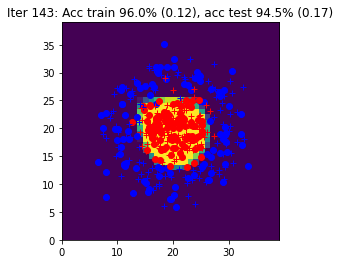

Iter 144: Acc train 96.5% (0.12), acc test 93.5% (0.16)


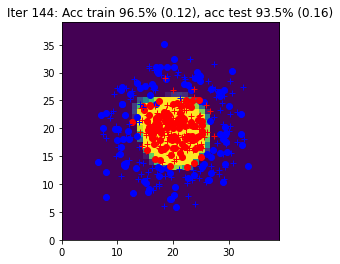

Iter 145: Acc train 96.0% (0.12), acc test 94.5% (0.17)


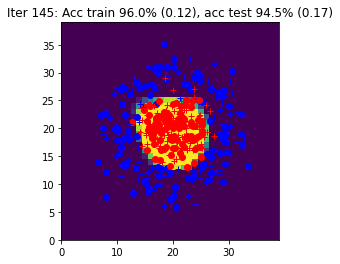

Iter 146: Acc train 97.0% (0.12), acc test 94.0% (0.16)


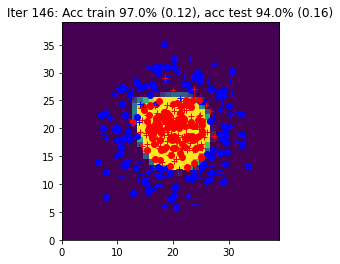

Iter 147: Acc train 96.5% (0.13), acc test 94.0% (0.15)


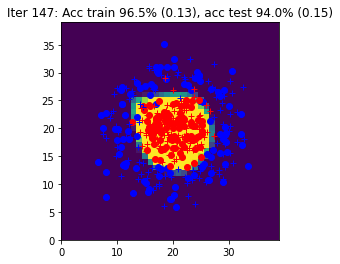

Iter 148: Acc train 95.5% (0.12), acc test 94.5% (0.17)


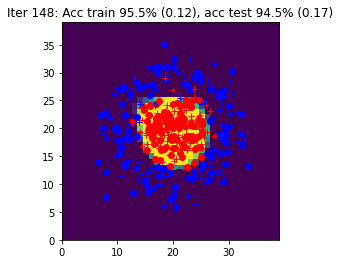

Iter 149: Acc train 96.0% (0.12), acc test 94.0% (0.16)


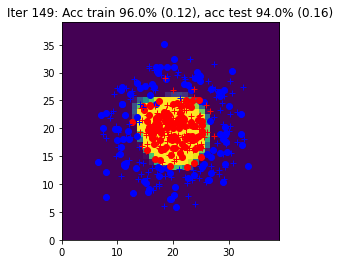

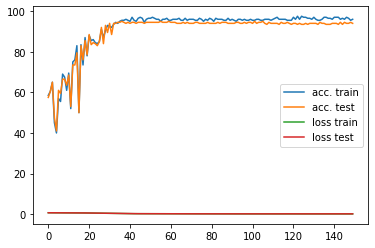

In [ ]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.03

model, loss = init_model(nx, nh, ny)

curves = [[],[], [], []]

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    #####################
    ## Your code here  ##
    #####################
    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]

        # write the optimization algorithm on the batch (X,Y)
        # using the functions: loss_accuracy, sgd
        # the forward with the predict method from the model
        # and the backward function with autograd
        
        Yhat = model(X)
        l, acc = loss_accuracy(loss, Yhat, Y)
        l.backward()
        sgd(model, eta)
    ####################
    ##      END        #
    ####################


    Yhat_train = model(data.Xtrain)
    Yhat_test = model(data.Xtest)
    Ltrain, acctrain = loss_accuracy(loss, Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(loss, Yhat_test, data.Ytest)
    Ygrid = model(data.Xgrid)  

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
    print(title) 
    data.plot_data_with_grid(torch.nn.Softmax(dim=1)(Ygrid.detach()), title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain)
    curves[3].append(Ltest)

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Part 4 : Simplification of the SGD with `torch.optim`

In [ ]:
def init_model(nx, nh, ny, eta):

    #####################
    ## Your code here  ##
    #####################

    model = torch.nn.Sequential(
        torch.nn.Linear(nx, nh),
        torch.nn.Tanh(),
        torch.nn.Linear(nh, ny),
    )
    loss = torch.nn.CrossEntropyLoss()
    optim = torch.optim.SGD(model.parameters(), lr=eta)

    ####################
    ##      END        #
    ####################

    return model, loss, optim

The `sgd` function is replaced by calling the `optim.zero_grad()` before the backward and `optim.step()` after. 

## Algorithme global d'apprentissage (avec autograd, les couches `torch.nn` et `torch.optim`)

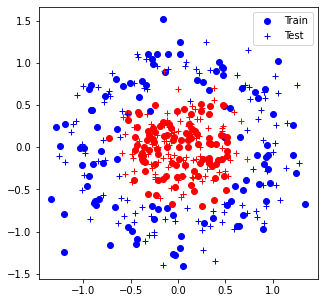

Iter 0: Acc train 50.5% (0.68), acc test 51.0% (0.68)


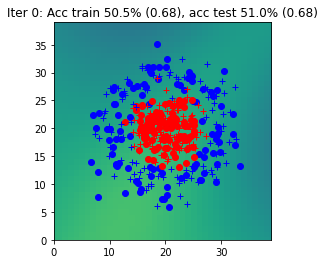

Iter 1: Acc train 66.5% (0.68), acc test 67.5% (0.68)


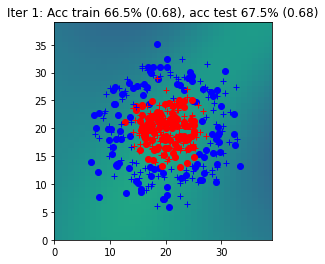

Iter 2: Acc train 53.0% (0.67), acc test 54.0% (0.67)


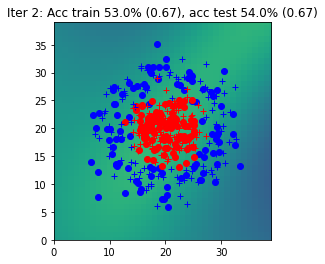

Iter 3: Acc train 80.0% (0.67), acc test 77.5% (0.67)


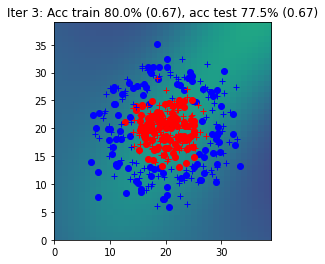

Iter 4: Acc train 72.0% (0.66), acc test 71.5% (0.66)


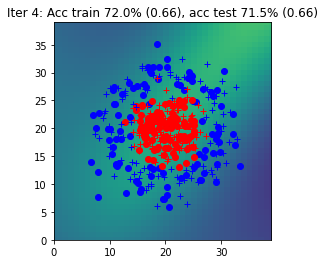

Iter 5: Acc train 67.5% (0.66), acc test 68.5% (0.65)


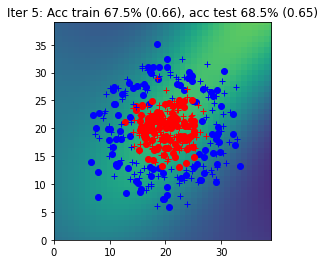

Iter 6: Acc train 75.5% (0.65), acc test 72.5% (0.65)


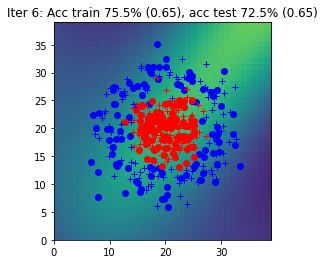

Iter 7: Acc train 79.5% (0.64), acc test 76.5% (0.64)


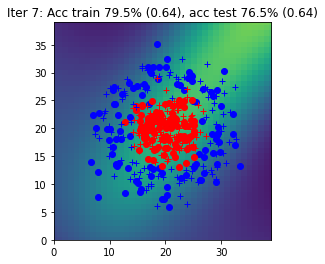

Iter 8: Acc train 63.0% (0.64), acc test 65.5% (0.63)


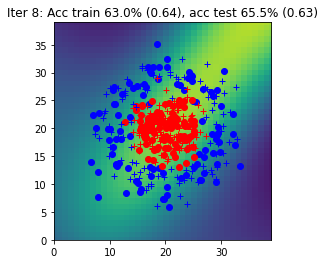

Iter 9: Acc train 79.0% (0.62), acc test 77.5% (0.62)


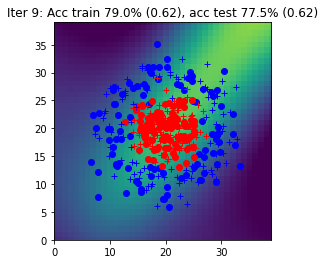

Iter 10: Acc train 73.5% (0.61), acc test 72.0% (0.61)


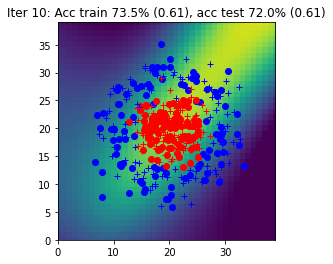

Iter 11: Acc train 82.0% (0.60), acc test 81.0% (0.59)


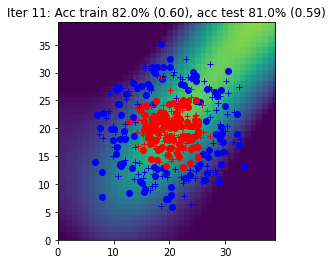

Iter 12: Acc train 79.0% (0.58), acc test 78.0% (0.58)


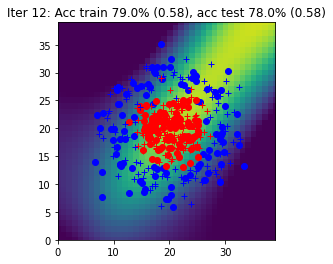

Iter 13: Acc train 80.0% (0.57), acc test 81.5% (0.57)


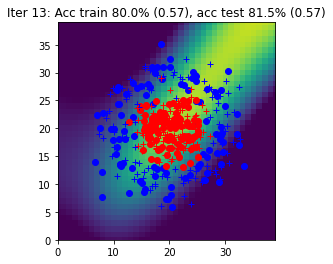

Iter 14: Acc train 79.5% (0.56), acc test 78.0% (0.56)


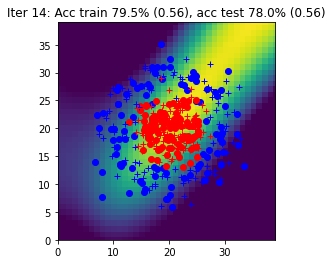

Iter 15: Acc train 82.5% (0.55), acc test 80.5% (0.55)


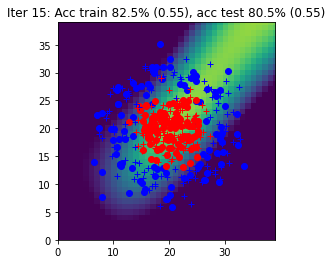

Iter 16: Acc train 79.0% (0.54), acc test 77.5% (0.53)


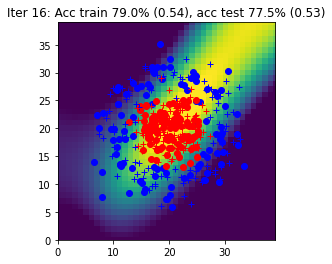

Iter 17: Acc train 80.0% (0.52), acc test 81.5% (0.52)


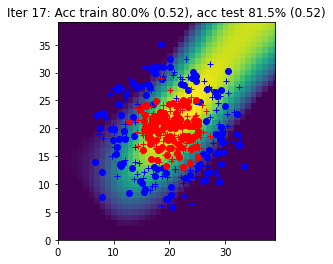

Iter 18: Acc train 80.5% (0.51), acc test 82.0% (0.50)


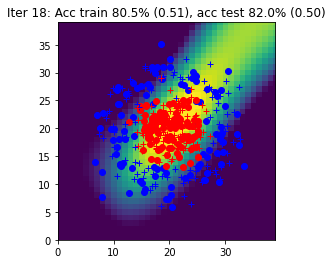

Iter 19: Acc train 82.5% (0.49), acc test 82.0% (0.49)


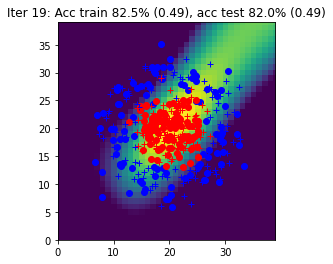

Iter 20: Acc train 83.5% (0.48), acc test 82.0% (0.48)


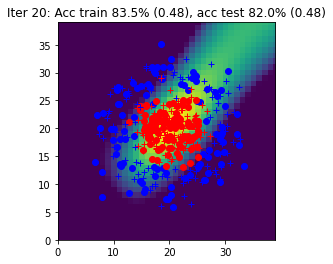

Iter 21: Acc train 83.0% (0.46), acc test 83.5% (0.46)


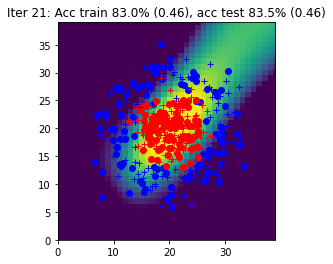

Iter 22: Acc train 83.5% (0.45), acc test 84.0% (0.45)


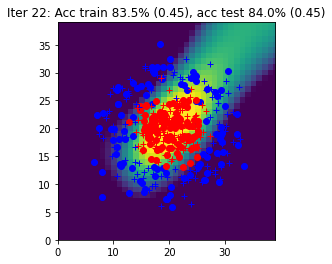

Iter 23: Acc train 83.5% (0.43), acc test 85.0% (0.43)


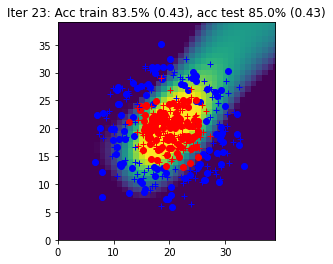

Iter 24: Acc train 84.0% (0.42), acc test 88.0% (0.42)


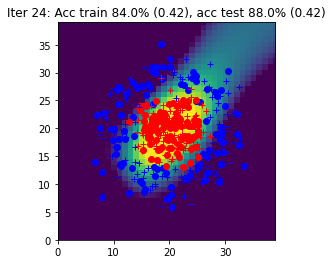

Iter 25: Acc train 85.5% (0.40), acc test 86.5% (0.40)


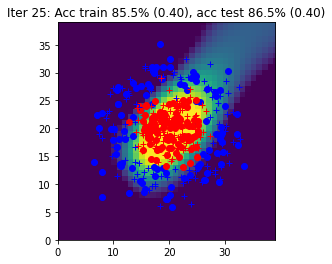

Iter 26: Acc train 86.5% (0.38), acc test 90.0% (0.38)


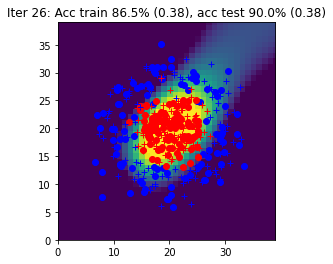

Iter 27: Acc train 89.0% (0.37), acc test 93.5% (0.37)


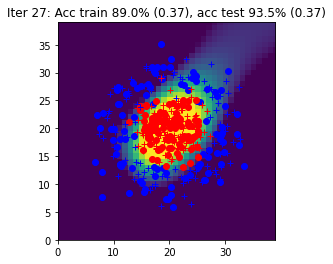

Iter 28: Acc train 90.5% (0.36), acc test 95.5% (0.35)


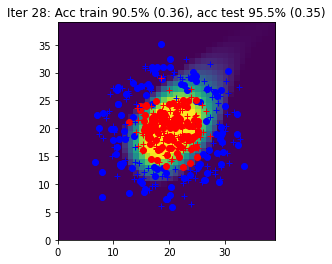

Iter 29: Acc train 90.0% (0.34), acc test 96.0% (0.34)


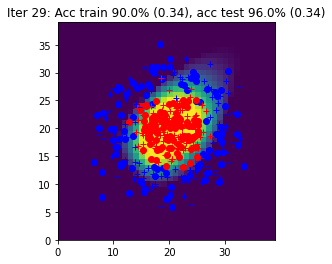

Iter 30: Acc train 92.0% (0.32), acc test 95.5% (0.32)


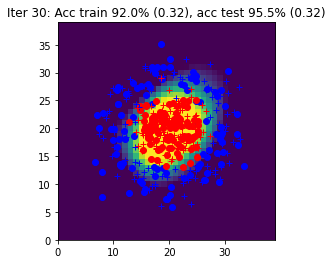

Iter 31: Acc train 92.5% (0.31), acc test 95.0% (0.31)


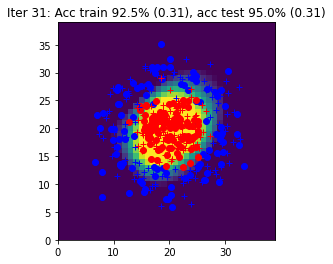

Iter 32: Acc train 92.5% (0.30), acc test 94.0% (0.30)


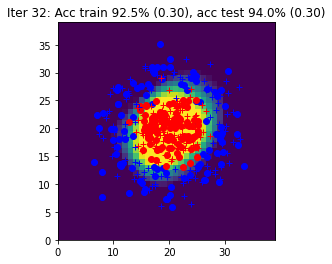

Iter 33: Acc train 92.5% (0.28), acc test 95.5% (0.29)


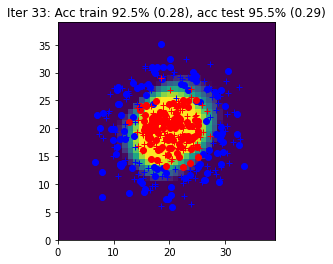

Iter 34: Acc train 92.5% (0.28), acc test 95.0% (0.28)


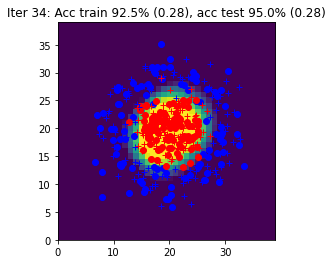

Iter 35: Acc train 93.0% (0.27), acc test 94.5% (0.27)


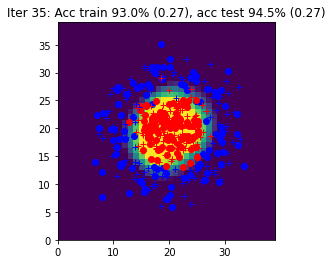

Iter 36: Acc train 93.5% (0.26), acc test 95.5% (0.26)


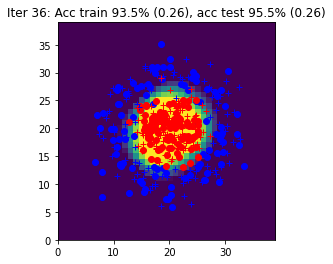

Iter 37: Acc train 93.5% (0.25), acc test 94.5% (0.25)


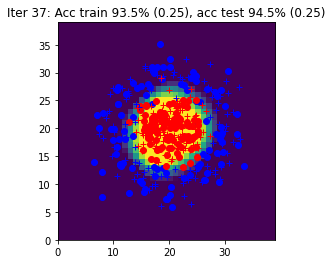

Iter 38: Acc train 93.5% (0.24), acc test 95.5% (0.24)


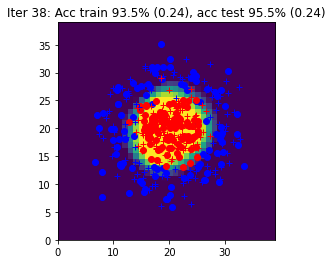

Iter 39: Acc train 94.5% (0.23), acc test 94.5% (0.24)


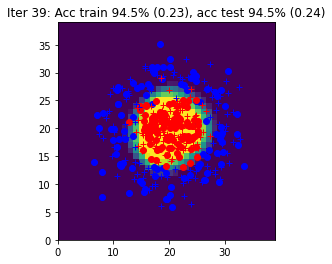

Iter 40: Acc train 94.5% (0.23), acc test 95.0% (0.23)


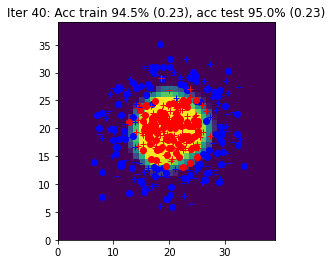

Iter 41: Acc train 93.5% (0.22), acc test 94.0% (0.23)


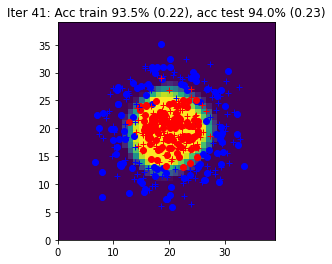

Iter 42: Acc train 94.5% (0.22), acc test 94.0% (0.22)


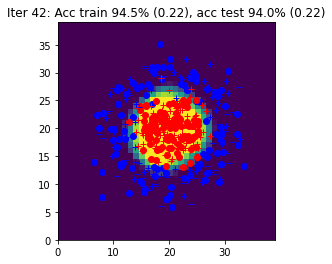

Iter 43: Acc train 93.5% (0.22), acc test 95.5% (0.22)


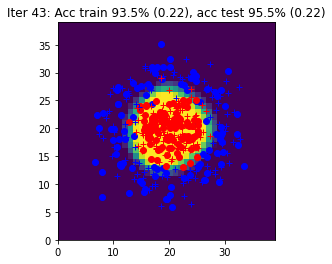

Iter 44: Acc train 95.0% (0.21), acc test 94.5% (0.21)


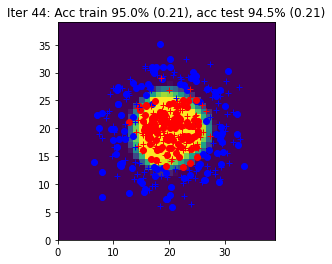

Iter 45: Acc train 94.0% (0.20), acc test 95.0% (0.21)


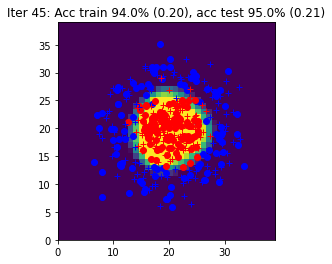

Iter 46: Acc train 94.0% (0.20), acc test 95.0% (0.20)


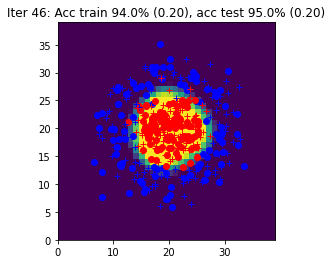

Iter 47: Acc train 94.5% (0.20), acc test 94.5% (0.20)


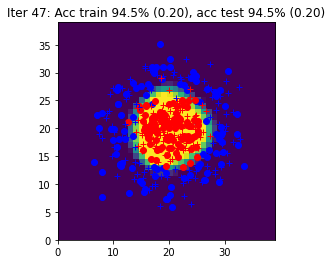

Iter 48: Acc train 94.5% (0.20), acc test 95.5% (0.21)


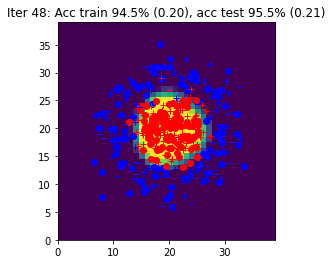

Iter 49: Acc train 94.0% (0.19), acc test 95.0% (0.20)


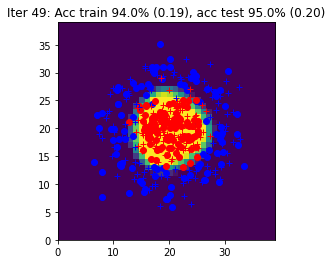

Iter 50: Acc train 94.5% (0.19), acc test 94.5% (0.19)


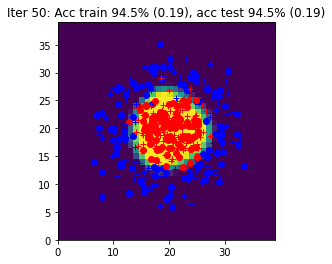

Iter 51: Acc train 94.5% (0.19), acc test 94.5% (0.19)


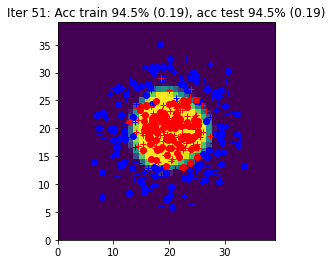

Iter 52: Acc train 95.5% (0.19), acc test 95.5% (0.19)


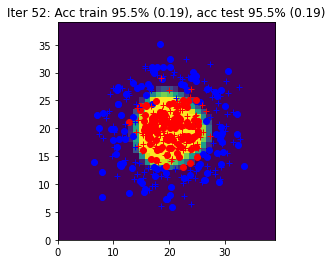

Iter 53: Acc train 95.0% (0.18), acc test 95.5% (0.19)


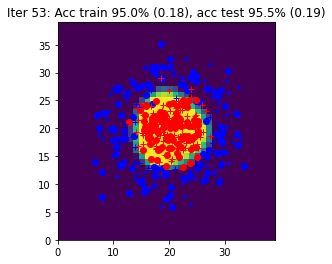

Iter 54: Acc train 95.0% (0.18), acc test 94.5% (0.18)


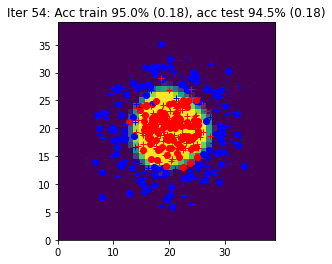

Iter 55: Acc train 94.5% (0.18), acc test 94.5% (0.18)


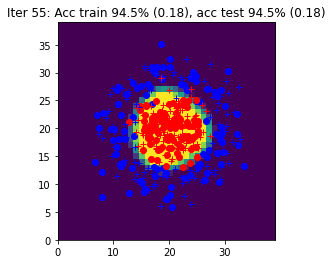

Iter 56: Acc train 94.0% (0.18), acc test 95.0% (0.18)


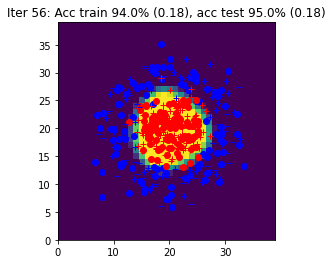

Iter 57: Acc train 95.5% (0.17), acc test 95.5% (0.18)


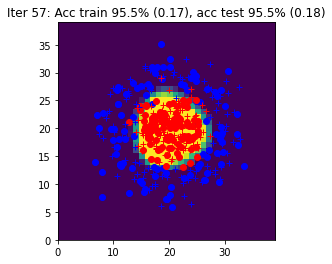

Iter 58: Acc train 95.5% (0.17), acc test 95.5% (0.18)


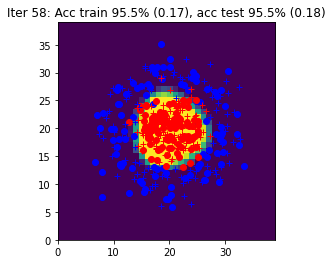

Iter 59: Acc train 94.5% (0.17), acc test 95.0% (0.17)


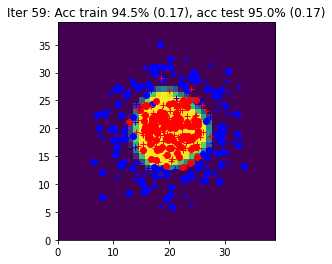

Iter 60: Acc train 94.0% (0.17), acc test 95.0% (0.17)


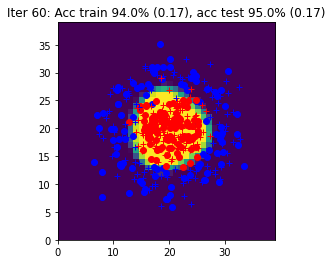

Iter 61: Acc train 94.5% (0.17), acc test 94.5% (0.17)


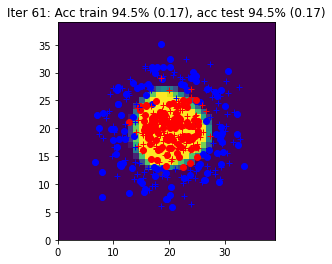

Iter 62: Acc train 95.5% (0.17), acc test 95.0% (0.18)


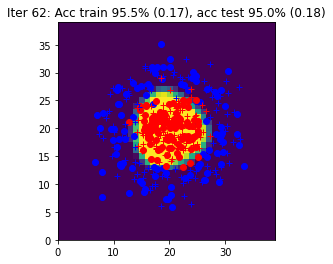

Iter 63: Acc train 95.5% (0.16), acc test 95.5% (0.17)


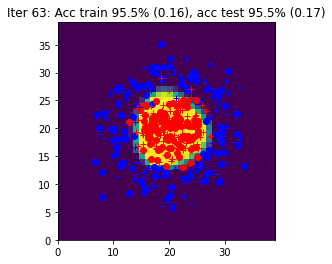

Iter 64: Acc train 94.5% (0.16), acc test 94.5% (0.17)


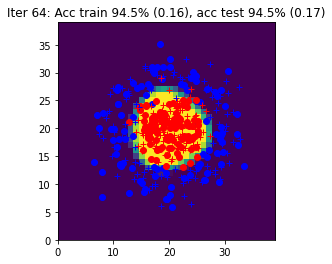

Iter 65: Acc train 94.0% (0.16), acc test 95.0% (0.17)


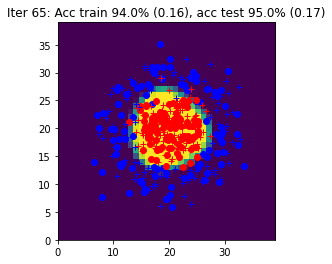

Iter 66: Acc train 94.5% (0.16), acc test 94.5% (0.17)


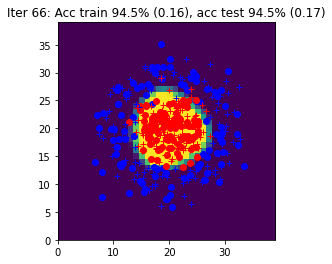

Iter 67: Acc train 95.0% (0.16), acc test 95.5% (0.17)


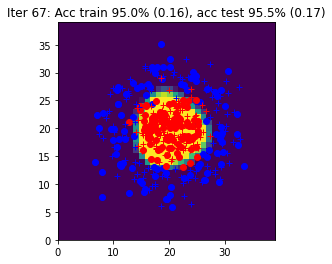

Iter 68: Acc train 95.5% (0.16), acc test 95.5% (0.17)


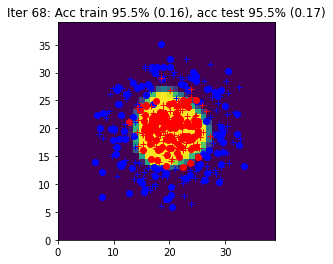

Iter 69: Acc train 95.5% (0.16), acc test 95.5% (0.17)


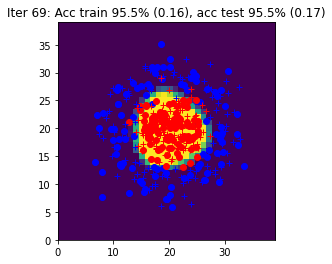

Iter 70: Acc train 95.0% (0.16), acc test 95.5% (0.17)


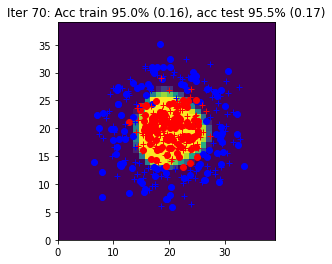

Iter 71: Acc train 95.0% (0.16), acc test 95.5% (0.17)


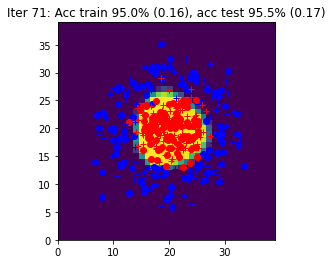

Iter 72: Acc train 95.5% (0.16), acc test 95.5% (0.17)


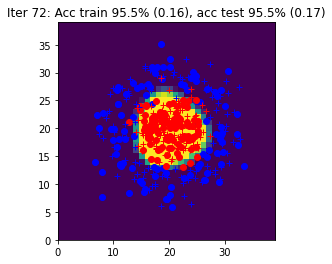

Iter 73: Acc train 95.0% (0.15), acc test 95.5% (0.16)


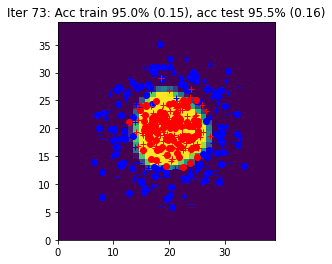

Iter 74: Acc train 95.5% (0.15), acc test 95.5% (0.16)


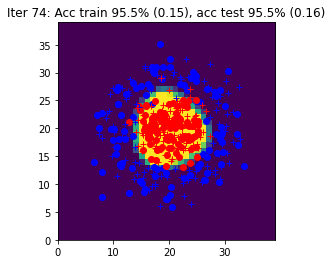

Iter 75: Acc train 95.5% (0.15), acc test 95.0% (0.16)


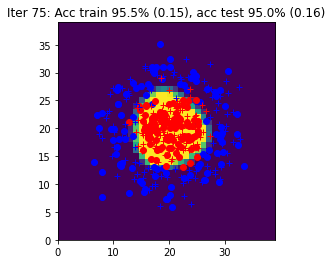

Iter 76: Acc train 95.0% (0.15), acc test 95.0% (0.16)


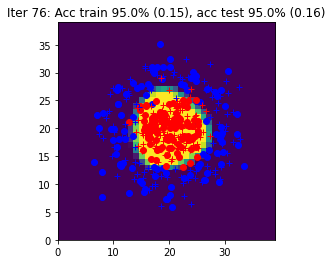

Iter 77: Acc train 94.5% (0.15), acc test 94.5% (0.15)


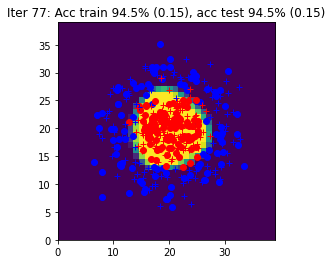

Iter 78: Acc train 94.5% (0.15), acc test 95.5% (0.17)


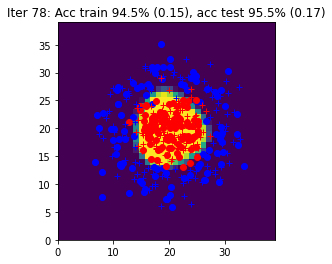

Iter 79: Acc train 95.5% (0.15), acc test 95.5% (0.16)


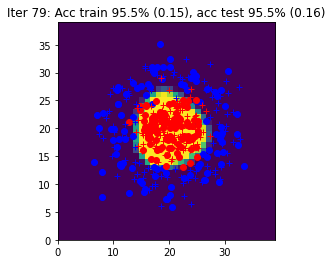

Iter 80: Acc train 95.5% (0.15), acc test 95.5% (0.16)


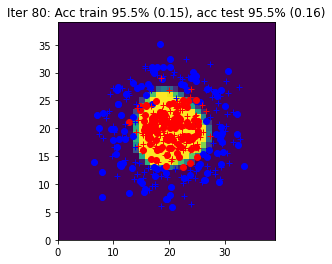

Iter 81: Acc train 95.0% (0.15), acc test 95.5% (0.16)


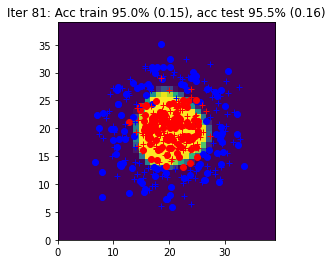

Iter 82: Acc train 95.5% (0.15), acc test 95.0% (0.16)


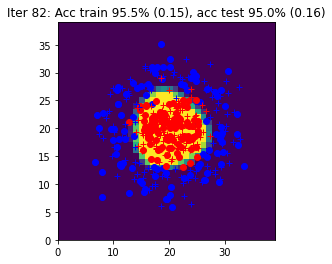

Iter 83: Acc train 95.0% (0.15), acc test 95.5% (0.16)


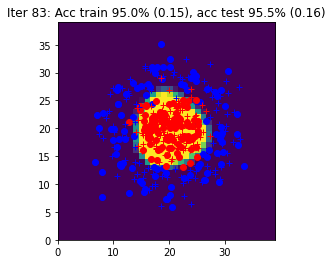

Iter 84: Acc train 95.5% (0.15), acc test 95.5% (0.16)


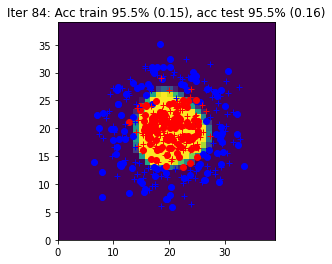

Iter 85: Acc train 95.5% (0.15), acc test 95.5% (0.15)


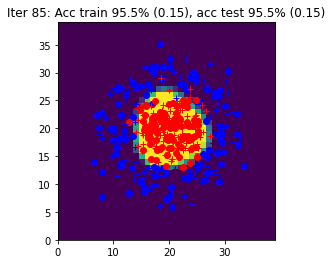

Iter 86: Acc train 95.5% (0.15), acc test 95.5% (0.15)


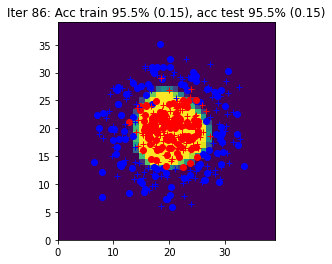

Iter 87: Acc train 95.5% (0.15), acc test 95.5% (0.16)


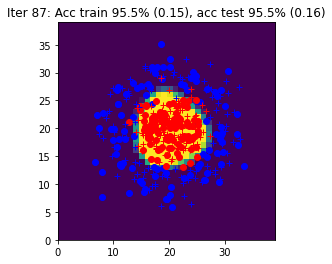

Iter 88: Acc train 95.0% (0.15), acc test 95.5% (0.16)


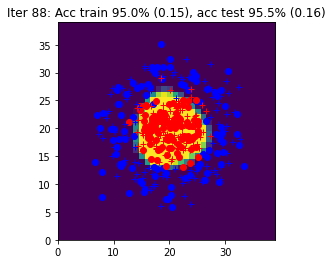

Iter 89: Acc train 95.0% (0.14), acc test 95.0% (0.15)


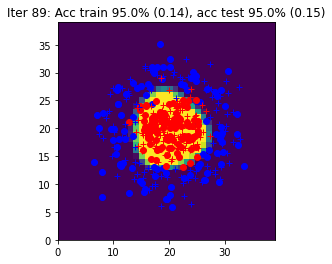

Iter 90: Acc train 95.0% (0.15), acc test 95.5% (0.16)


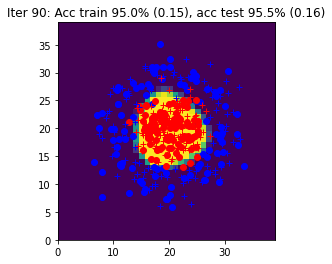

Iter 91: Acc train 95.5% (0.14), acc test 96.0% (0.15)


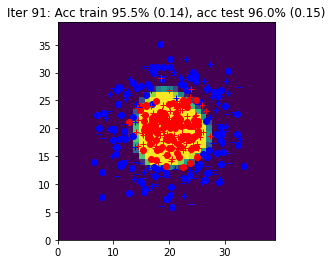

Iter 92: Acc train 95.5% (0.14), acc test 95.5% (0.15)


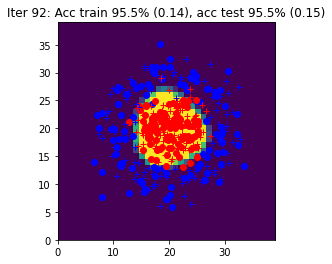

Iter 93: Acc train 96.0% (0.14), acc test 95.0% (0.15)


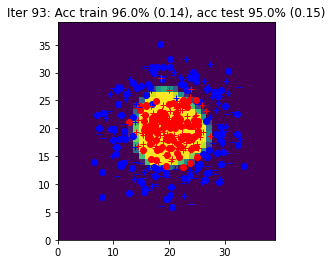

Iter 94: Acc train 95.5% (0.14), acc test 95.5% (0.15)


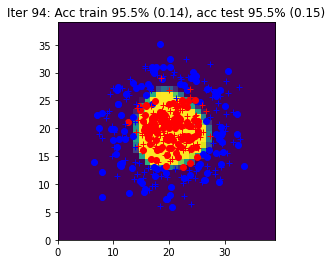

Iter 95: Acc train 95.5% (0.14), acc test 95.5% (0.15)


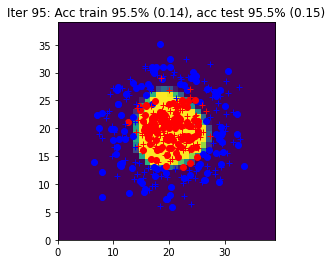

Iter 96: Acc train 95.0% (0.14), acc test 95.5% (0.15)


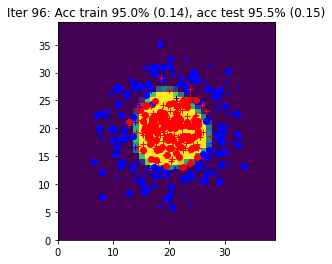

Iter 97: Acc train 95.5% (0.14), acc test 95.5% (0.15)


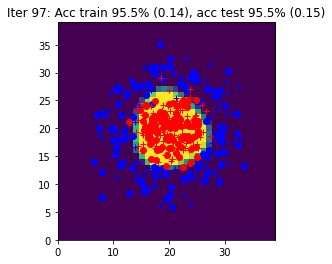

Iter 98: Acc train 95.0% (0.14), acc test 95.5% (0.15)


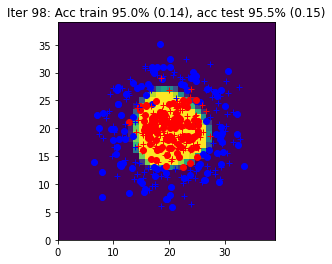

Iter 99: Acc train 94.5% (0.14), acc test 95.5% (0.15)


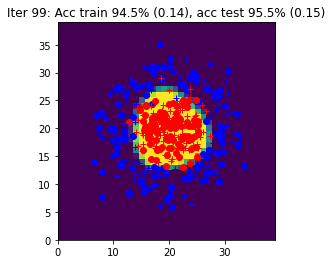

Iter 100: Acc train 95.5% (0.14), acc test 94.5% (0.15)


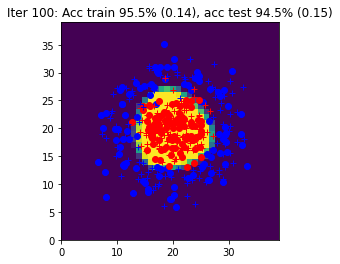

Iter 101: Acc train 95.0% (0.14), acc test 95.0% (0.15)


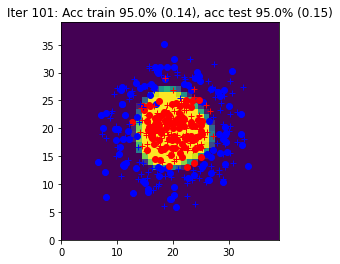

Iter 102: Acc train 95.5% (0.14), acc test 95.5% (0.15)


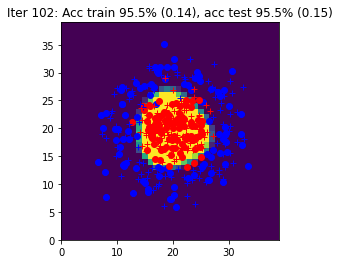

Iter 103: Acc train 94.0% (0.14), acc test 94.5% (0.14)


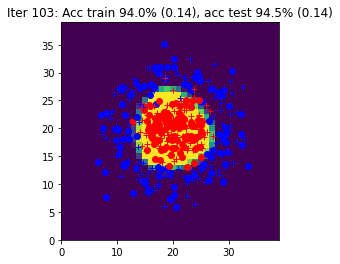

Iter 104: Acc train 95.5% (0.14), acc test 96.0% (0.14)


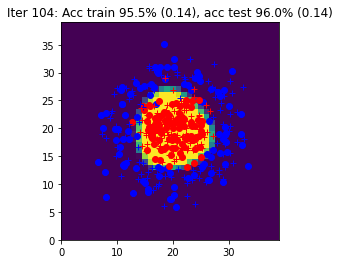

Iter 105: Acc train 95.0% (0.14), acc test 95.5% (0.15)


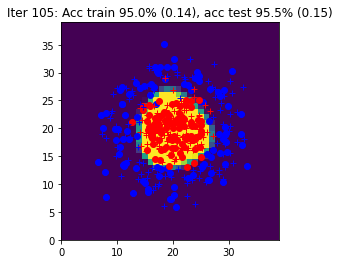

Iter 106: Acc train 95.5% (0.14), acc test 96.0% (0.15)


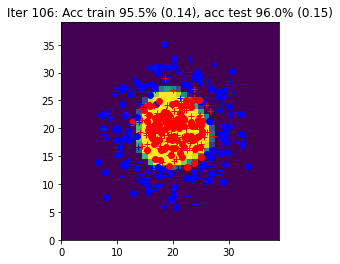

Iter 107: Acc train 95.5% (0.14), acc test 95.5% (0.14)


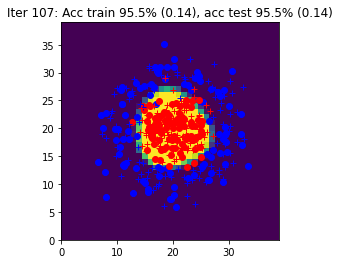

Iter 108: Acc train 95.0% (0.14), acc test 94.5% (0.14)


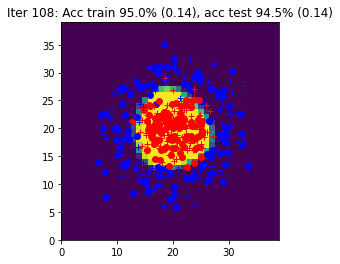

Iter 109: Acc train 95.5% (0.14), acc test 96.0% (0.15)


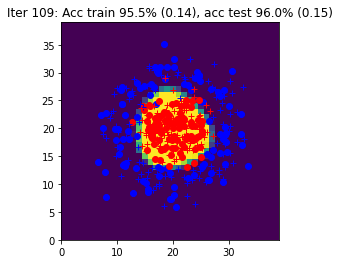

Iter 110: Acc train 95.5% (0.14), acc test 96.0% (0.14)


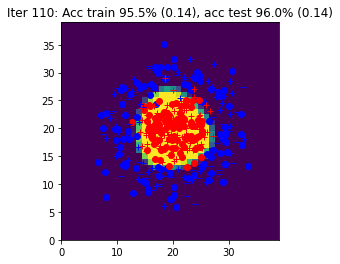

Iter 111: Acc train 95.5% (0.14), acc test 96.0% (0.14)


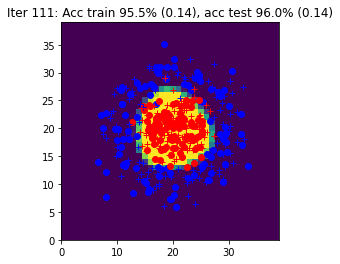

Iter 112: Acc train 96.0% (0.14), acc test 96.0% (0.14)


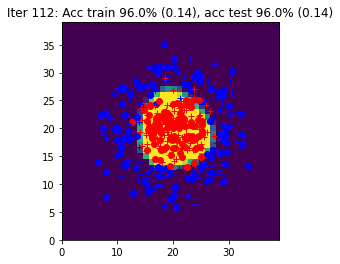

Iter 113: Acc train 95.5% (0.14), acc test 96.0% (0.14)


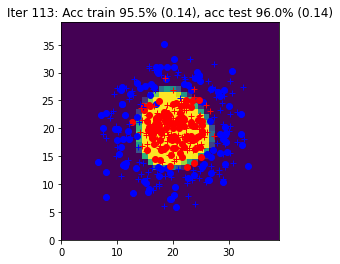

Iter 114: Acc train 95.5% (0.14), acc test 96.0% (0.15)


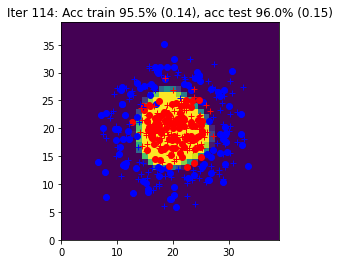

Iter 115: Acc train 95.0% (0.13), acc test 95.5% (0.15)


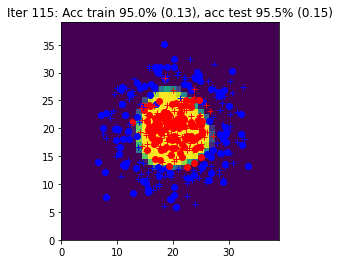

Iter 116: Acc train 95.5% (0.13), acc test 95.5% (0.15)


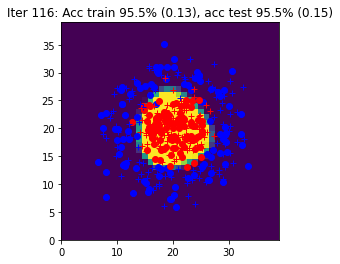

Iter 117: Acc train 96.5% (0.13), acc test 96.0% (0.14)


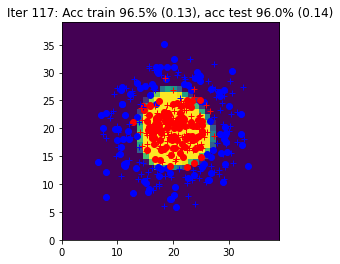

Iter 118: Acc train 95.0% (0.14), acc test 95.5% (0.16)


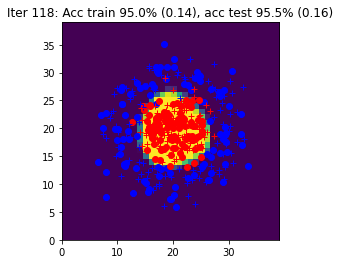

Iter 119: Acc train 95.5% (0.14), acc test 95.5% (0.14)


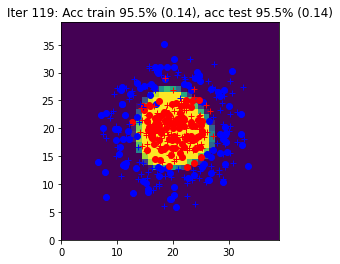

Iter 120: Acc train 96.5% (0.13), acc test 96.0% (0.14)


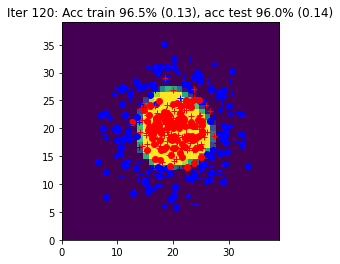

Iter 121: Acc train 95.5% (0.13), acc test 96.0% (0.15)


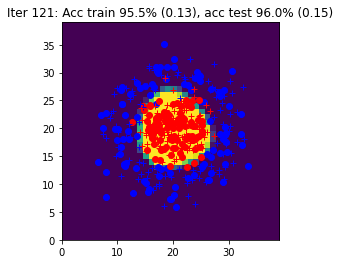

Iter 122: Acc train 96.5% (0.13), acc test 96.0% (0.14)


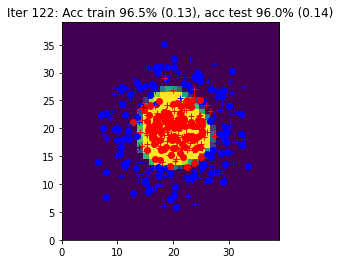

Iter 123: Acc train 95.5% (0.13), acc test 96.0% (0.15)


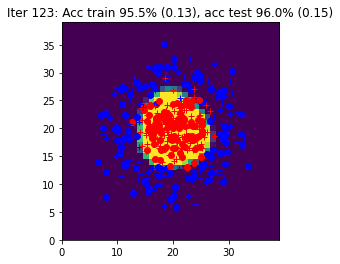

Iter 124: Acc train 96.0% (0.13), acc test 96.0% (0.14)


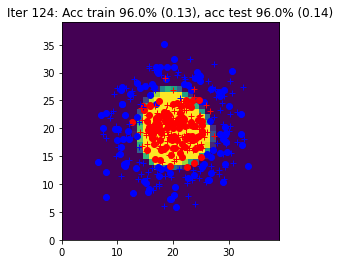

Iter 125: Acc train 96.5% (0.13), acc test 95.0% (0.14)


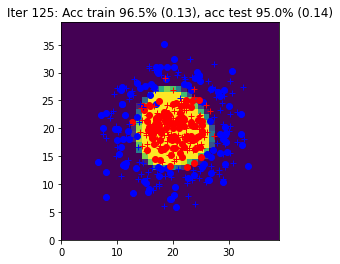

Iter 126: Acc train 95.5% (0.13), acc test 96.0% (0.14)


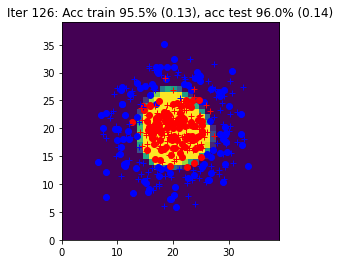

Iter 127: Acc train 95.5% (0.13), acc test 95.5% (0.16)


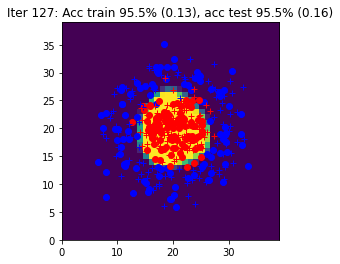

Iter 128: Acc train 95.5% (0.13), acc test 95.5% (0.15)


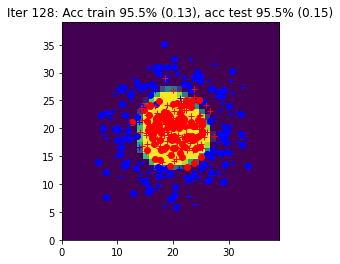

Iter 129: Acc train 95.0% (0.13), acc test 94.5% (0.14)


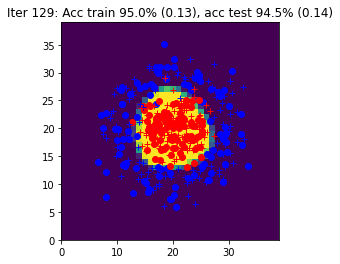

Iter 130: Acc train 95.0% (0.13), acc test 94.5% (0.14)


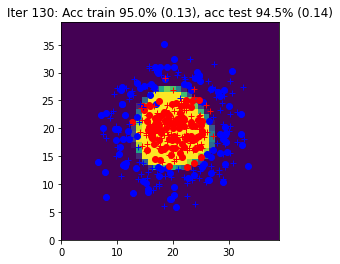

Iter 131: Acc train 95.5% (0.13), acc test 96.0% (0.14)


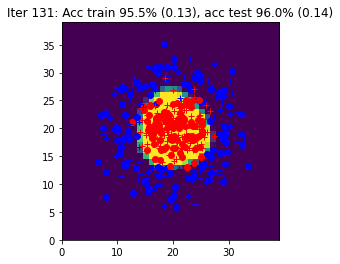

Iter 132: Acc train 96.5% (0.13), acc test 96.0% (0.14)


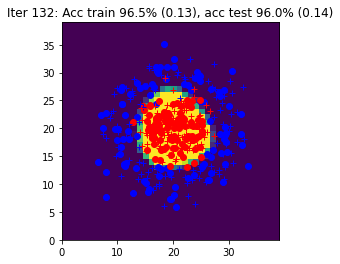

Iter 133: Acc train 96.0% (0.13), acc test 95.5% (0.14)


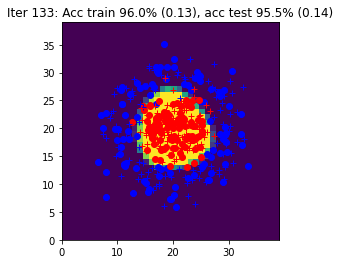

Iter 134: Acc train 96.0% (0.13), acc test 96.0% (0.14)


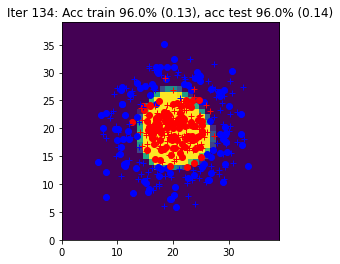

Iter 135: Acc train 95.5% (0.13), acc test 94.5% (0.14)


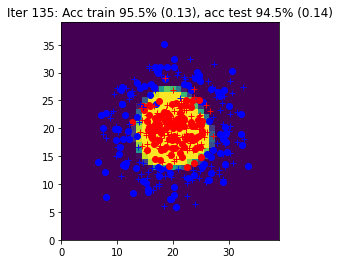

Iter 136: Acc train 96.0% (0.13), acc test 95.5% (0.14)


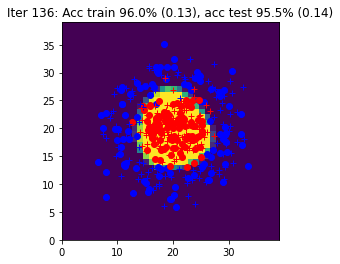

Iter 137: Acc train 96.0% (0.13), acc test 96.0% (0.14)


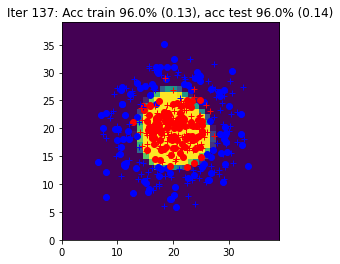

Iter 138: Acc train 96.0% (0.13), acc test 96.0% (0.15)


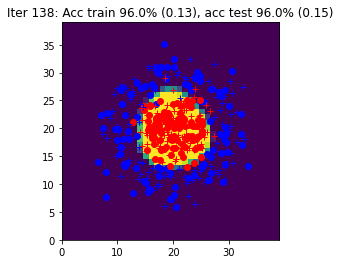

Iter 139: Acc train 96.0% (0.13), acc test 96.0% (0.14)


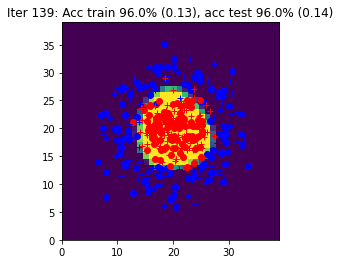

Iter 140: Acc train 96.0% (0.13), acc test 95.5% (0.14)


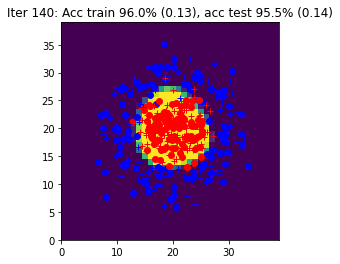

Iter 141: Acc train 95.5% (0.13), acc test 96.0% (0.14)


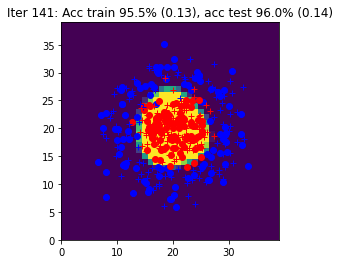

Iter 142: Acc train 96.0% (0.13), acc test 94.5% (0.14)


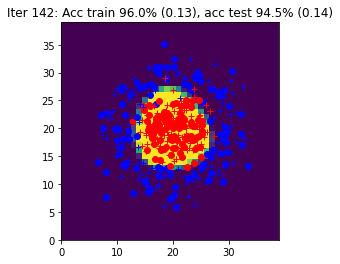

Iter 143: Acc train 96.0% (0.13), acc test 96.0% (0.14)


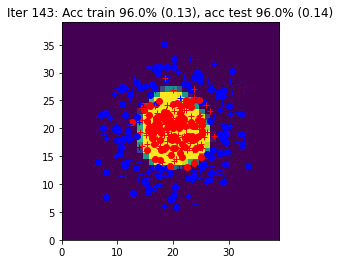

Iter 144: Acc train 96.0% (0.13), acc test 96.0% (0.14)


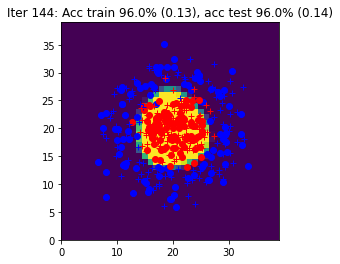

Iter 145: Acc train 96.0% (0.13), acc test 94.5% (0.14)


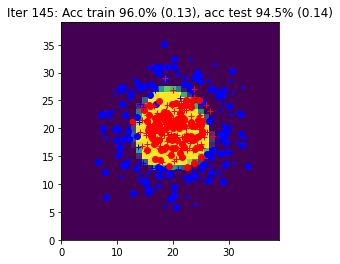

Iter 146: Acc train 96.0% (0.13), acc test 95.0% (0.14)


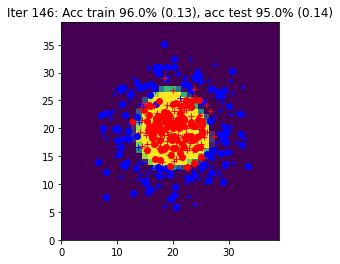

Iter 147: Acc train 96.0% (0.13), acc test 96.0% (0.14)


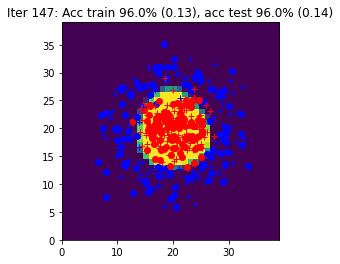

Iter 148: Acc train 96.0% (0.13), acc test 95.5% (0.14)


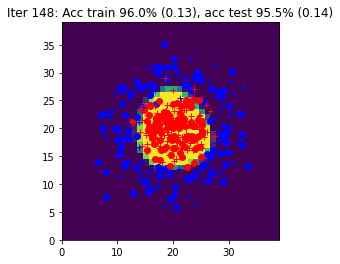

Iter 149: Acc train 95.5% (0.13), acc test 96.0% (0.14)


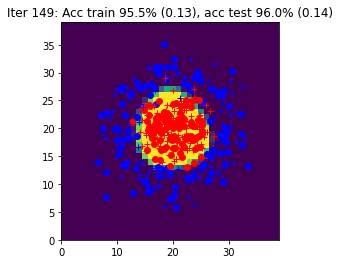

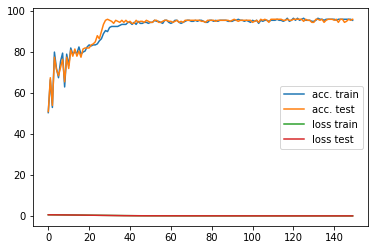

In [ ]:
# init
data = CirclesData()
data.plot_data()
N = data.Xtrain.shape[0]
Nbatch = 10
nx = data.Xtrain.shape[1]
nh = 10
ny = data.Ytrain.shape[1]
eta = 0.03

model, loss, optim = init_model(nx, nh, ny, eta)

curves = [[],[], [], []]

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]

    #####################
    ## Your code  here ##
    #####################
    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]
  
        # write the optimization algorithm on the batch (X,Y)
        # using the functions: loss_accuracy
        # the forward with the predict method from the model
        # the backward function with autograd
        # and then an optimization step

        Yhat = model(X)
        l, acc = loss_accuracy(loss,Yhat, Y)
        l.backward()
        optim.step()
        optim.zero_grad()
    ####################
    ##      FIN        #
    ####################


    Yhat_train = model(data.Xtrain)
    Yhat_test = model(data.Xtest)
    Ltrain, acctrain = loss_accuracy(loss, Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(loss, Yhat_test, data.Ytest)
    Ygrid = model(data.Xgrid)  

    title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
    print(title) 
    data.plot_data_with_grid(torch.nn.Softmax(dim=1)(Ygrid.detach()), title)

    curves[0].append(acctrain)
    curves[1].append(acctest)
    curves[2].append(Ltrain)
    curves[3].append(Ltest)

fig = plt.figure()
plt.plot(curves[0], label="acc. train")
plt.plot(curves[1], label="acc. test")
plt.plot(curves[2], label="loss train")
plt.plot(curves[3], label="loss test")
plt.legend()
plt.show()

# Part 5 : MNIST

Apply the code from previous part code to the MNIST dataset.

In [ ]:
# init
data = MNISTData()
N = data.Xtrain.shape[0]
Nbatch = 100
nx = data.Xtrain.shape[1]
nh = 100
ny = data.Ytrain.shape[1]
eta = 0.03


model, loss, optim = init_model(nx, nh, ny, eta)

curves = [[],[], [], []]

# epoch
for iteration in range(150):

    # permute
    perm = np.random.permutation(N)
    Xtrain = data.Xtrain[perm, :]
    Ytrain = data.Ytrain[perm, :]


    # batches
    for j in range(N // Nbatch):

        indsBatch = range(j * Nbatch, (j+1) * Nbatch)
        X = Xtrain[indsBatch, :]
        Y = Ytrain[indsBatch, :]


        Yhat = model(X)
        l, acc = loss_accuracy(loss,Yhat, Y)
        l.backward()
        optim.step()
        optim.zero_grad()


    Yhat_train = model(data.Xtrain)
    Yhat_test = model(data.Xtest)
    Ltrain, acctrain = loss_accuracy(loss, Yhat_train, data.Ytrain)
    Ltest, acctest = loss_accuracy(loss, Yhat_test, data.Ytest)

    if iteration % 10 == 0:
      title = 'Iter {}: Acc train {:.1f}% ({:.2f}), acc test {:.1f}% ({:.2f})'.format(iteration, acctrain, Ltrain, acctest, Ltest)
      print(title) 
   

Iter 0: Acc train 85.2% (0.54), acc test 85.7% (0.52)
Iter 10: Acc train 87.7% (0.41), acc test 87.8% (0.41)
Iter 20: Acc train 88.1% (0.39), acc test 88.6% (0.38)
Iter 30: Acc train 89.9% (0.34), acc test 90.1% (0.33)
Iter 40: Acc train 90.6% (0.31), acc test 90.6% (0.31)
Iter 50: Acc train 91.3% (0.29), acc test 91.5% (0.28)
Iter 60: Acc train 91.4% (0.28), acc test 91.1% (0.29)
Iter 70: Acc train 92.0% (0.27), acc test 92.1% (0.27)
Iter 80: Acc train 91.9% (0.27), acc test 91.7% (0.28)
Iter 90: Acc train 92.8% (0.23), acc test 92.7% (0.24)
Iter 100: Acc train 92.7% (0.24), acc test 92.8% (0.24)
Iter 110: Acc train 92.9% (0.24), acc test 92.6% (0.25)
Iter 120: Acc train 92.8% (0.24), acc test 92.4% (0.25)
Iter 130: Acc train 93.0% (0.22), acc test 93.1% (0.23)
Iter 140: Acc train 93.1% (0.22), acc test 92.8% (0.23)


# Part 6: Bonus: SVM


Train a SVM model on the Circles dataset.

Ideas : 
- First try a linear SVM (sklearn.svm.LinearSVC dans scikit-learn). Does it work well ? Why ?
- Then try more complex kernels (sklearn.svm.SVC). Which one is the best ? why ?
- Does the parameter C of regularization have an impact? Why ?

In [ ]:
# data
data = CirclesData()
Xtrain = data.Xtrain.numpy()
Ytrain = data.Ytrain[:, 0].numpy()

Xgrid = data.Xgrid.numpy()

Xtest = data.Xtest.numpy()
Ytest = data.Ytest[:, 0].numpy()

def plot_svm_predictions(data, predictions):
      plt.figure(2)
      plt.clf()
      plt.imshow(np.reshape(predictions, (40,40)))
      plt.plot(data._Xtrain[data._Ytrain[:,0] == 1,0]*10+20, data._Xtrain[data._Ytrain[:,0] == 1,1]*10+20, 'bo', label="Train")
      plt.plot(data._Xtrain[data._Ytrain[:,1] == 1,0]*10+20, data._Xtrain[data._Ytrain[:,1] == 1,1]*10+20, 'ro')
      plt.plot(data._Xtest[data._Ytest[:,0] == 1,0]*10+20, data._Xtest[data._Ytest[:,0] == 1,1]*10+20, 'b+', label="Test")
      plt.plot(data._Xtest[data._Ytest[:,1] == 1,0]*10+20, data._Xtest[data._Ytest[:,1] == 1,1]*10+20, 'r+')
      plt.xlim(0,39)
      plt.ylim(0,39)
      plt.clim(0.3,0.7)
      plt.draw()
      plt.pause(1e-3)

In [ ]:
from sklearn.svm import SVC, LinearSVC

Accuracy : 53.00


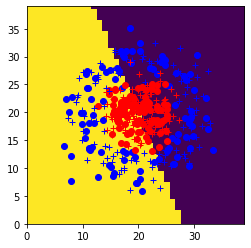

In [ ]:

svm = LinearSVC()
svm.fit(Xtrain, Ytrain)

###########################
Ytest_pred = svm.predict(Xtest)
accuracy = np.sum(Ytest == Ytest_pred) / len(Ytest)
print(f"Accuracy : {100 * accuracy:.2f}")
Ygrid_pred = svm.predict(Xgrid)
plot_svm_predictions(data, Ygrid_pred)

Accuracy : 94.00


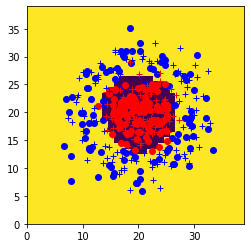

In [ ]:

svm = SVC()
svm.fit(Xtrain, Ytrain)

###########################
Ytest_pred = svm.predict(Xtest)
accuracy = np.sum(Ytest == Ytest_pred) / len(Ytest)
print(f"Accuracy : {100 * accuracy:.2f}")
Ygrid_pred = svm.predict(Xgrid)
plot_svm_predictions(data, Ygrid_pred)